# BEE Analysis — Load Pre-trained Models (No Training)

This notebook skips all training and runs the full BEE diagnostic analysis
by loading pre-trained models directly from saved checkpoints.

**Required files (upload to Colab or mount from Drive):**
- `pythia-emotion-classifier-weighted-final/` — Target model
- `MIA_Reference_Model_Base/` — Reference model
- `clf_n-1_no_EmoLit/`, `clf_n-1_no_Emotion20/`, `clf_n-1_no_GoEmotions/`, `clf_n-1_no_XED_SMED/`
- `clf_single_EmoLit/`, `clf_single_Emotion20/`, `clf_single_GoEmotions/`, `clf_single_XED_SMED/`
- Dataset CSVs: `all_4_datasets.csv`, `no_EmoLit.csv`, `no_EmotionDataset20.csv`,
  `no_GoEmotions.csv`, `no_XED_SMED.csv`, `EmoLit_mapped.csv`,
  `EmotionDataset20_mapped.csv`, `GoEmotions_mapped.csv`, `XED_and_SMED.csv`

In [1]:
# Install dependencies
!pip install -q transformers datasets torch yake nltk scikit-learn matplotlib seaborn openpyxl

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.4/91.4 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 360.5/360.5 kB 26.4 MB/s eta 0:00:00


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import os, gc, zipfile
import torch
import pandas as pd
import numpy as np
import yake
import nltk
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from datasets import Dataset
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics.pairwise import cosine_similarity as sklearn_cosine_sim

nltk.download('stopwords', quiet=True)
nltk.download('punkt', quiet=True)

SEED = 42
np.random.seed(SEED)
torch.manual_seed(SEED)

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device: {device}")

Device: cuda


In [4]:
import zipfile, os

ZIPS = {
    "pythia_emotion_classifier_weighted_final (1).zip" : "/content/pythia-emotion-classifier-weighted-final",
    "MIA_Reference_Model_Base.zip"                 : "/content/pythia-base-linear-probe",
    "clf_n-1_no_Emolit (1).zip"                        : "/content/clf_n-1_no_EmoLit",
    "clf_n-1_no_Emotion20 (1).zip"                     : "/content/clf_n-1_no_Emotion20",
    "clf_n-1_no_GoEmotions (1).zip"                    : "/content/clf_n-1_no_GoEmotions",
    "clf_n-1_no_XED_SMED (1).zip"                      : "/content/clf_n-1_no_XED_SMED",
    "clf_single_EmoLit (1).zip"                        : "/content/clf_single_EmoLit",
    "clf_single_Emotion20 (1).zip"                     : "/content/clf_single_Emotion20",
    "clf_single_GoEmotions (1).zip"                    : "/content/clf_single_GoEmotions",
    "clf_single_XED_SMED (1).zip"                      : "/content/clf_single_XED_SMED",
}

# Where are the zips? Check both /content and Drive
ZIP_SEARCH_DIRS = [
    # "/content",
    "/content/drive/MyDrive/TRAINED_MODELS",          # adjust if your Drive folder is different
    # "/content/drive/MyDrive/models",   # common alternative
]

for zip_name, extract_to in ZIPS.items():
    if os.path.isdir(extract_to):
        print(f"  Already exists, skipping: {extract_to}")
        continue

    # Search for the zip in known locations
    zip_path = None
    for search_dir in ZIP_SEARCH_DIRS:
        candidate = os.path.join(search_dir, zip_name)
        if os.path.isfile(candidate):
            zip_path = candidate
            break

    if zip_path is None:
        print(f"  ✗ ZIP not found anywhere: {zip_name}")
        continue

    print(f"  Unzipping {zip_path} → {extract_to} ...")
    os.makedirs(extract_to, exist_ok=True)
    with zipfile.ZipFile(zip_path, 'r') as zf:
        zf.extractall(extract_to)
    print(f"  ✓ Done")

print("\nResult:")
for zip_name, extract_to in ZIPS.items():
    exists = os.path.isfile(os.path.join(extract_to, "config.json"))
    # check for nesting
    nested = os.path.join(extract_to, os.path.basename(extract_to), "config.json")
    if not exists and os.path.isfile(nested):
        print(f"  ⚠ NESTED: {extract_to} — real files are one level deeper")
    else:
        print(f"  {'✓' if exists else '✗ MISSING config.json'} {extract_to}")

  Unzipping /content/drive/MyDrive/TRAINED_MODELS/pythia_emotion_classifier_weighted_final (1).zip → /content/pythia-emotion-classifier-weighted-final ...
  ✓ Done
  Unzipping /content/drive/MyDrive/TRAINED_MODELS/MIA_Reference_Model_Base.zip → /content/pythia-base-linear-probe ...
  ✓ Done
  Unzipping /content/drive/MyDrive/TRAINED_MODELS/clf_n-1_no_Emolit (1).zip → /content/clf_n-1_no_EmoLit ...
  ✓ Done
  Unzipping /content/drive/MyDrive/TRAINED_MODELS/clf_n-1_no_Emotion20 (1).zip → /content/clf_n-1_no_Emotion20 ...
  ✓ Done
  Unzipping /content/drive/MyDrive/TRAINED_MODELS/clf_n-1_no_GoEmotions (1).zip → /content/clf_n-1_no_GoEmotions ...
  ✓ Done
  Unzipping /content/drive/MyDrive/TRAINED_MODELS/clf_n-1_no_XED_SMED (1).zip → /content/clf_n-1_no_XED_SMED ...
  ✓ Done
  Unzipping /content/drive/MyDrive/TRAINED_MODELS/clf_single_EmoLit (1).zip → /content/clf_single_EmoLit ...
  ✓ Done
  Unzipping /content/drive/MyDrive/TRAINED_MODELS/clf_single_Emotion20 (1).zip → /content/clf_single

## Configurations - set paths here

In [5]:
# ============================================================
# EDIT THESE PATHS to match where your models and CSVs live.
# If you unzipped models directly into /content, leave as-is.
# If they are in Drive, use e.g. /content/drive/MyDrive/...
# ============================================================

DRIVE_ROOT = "/content/drive/MyDrive"   # change if needed

# --- Model directories ---
MODEL_PATHS = {
    "alpha_n"            : "/content/pythia-emotion-classifier-weighted-final",
    "reference"          : "/content/pythia-base-linear-probe",
    "n-1_no_EmoLit"      : "/content/clf_n-1_no_EmoLit",
    "n-1_no_Emotion20"   : "/content/clf_n-1_no_Emotion20",
    "n-1_no_GoEmotions"  : "/content/clf_n-1_no_GoEmotions",
    "n-1_no_XED_SMED"    : "/content/clf_n-1_no_XED_SMED",
    "single_EmoLit"      : "/content/clf_single_EmoLit",
    "single_Emotion20"   : "/content/clf_single_Emotion20",
    "single_GoEmotions"  : "/content/clf_single_GoEmotions",
    "single_XED_SMED"    : "/content/clf_single_XED_SMED",
}

# --- Dataset CSVs (used for keyword extraction per model) ---
DATASET_CSVS = {
    "alpha_n"            : f"{DRIVE_ROOT}/UPDATED_DATASETS/all_4_datasets.csv",
    "reference"          : f"{DRIVE_ROOT}/UPDATED_DATASETS/all_4_datasets.csv",
    "n-1_no_EmoLit"      : f"{DRIVE_ROOT}/UPDATED_DATASETS/no_EmoLit.csv",
    "n-1_no_Emotion20"   : f"{DRIVE_ROOT}/UPDATED_DATASETS/no_EmotionDataset20.csv",
    "n-1_no_GoEmotions"  : f"{DRIVE_ROOT}/UPDATED_DATASETS/no_GoEmotions.csv",
    "n-1_no_XED_SMED"    : f"{DRIVE_ROOT}/UPDATED_DATASETS/no_XED_SMED.csv",
    "single_EmoLit"      : f"{DRIVE_ROOT}/UPDATED_DATASETS/EmoLit_mapped.csv",
    "single_Emotion20"   : f"{DRIVE_ROOT}/UPDATED_DATASETS/EmotionDataset20_mapped.csv",
    "single_GoEmotions"  : f"{DRIVE_ROOT}/UPDATED_DATASETS/GoEmotions_mapped.csv",
    "single_XED_SMED"    : f"{DRIVE_ROOT}/UPDATED_DATASETS/XED_and_SMED.csv",
}

# Verify all paths exist
print("Checking model paths:")
for key, path in MODEL_PATHS.items():
    exists = os.path.isdir(path)
    print(f"  {'OK' if exists else 'MISSING'} {key}: {path}")

print("\nChecking dataset paths:")
for key, path in DATASET_CSVS.items():
    exists = os.path.isfile(path)
    print(f"  {'OK' if exists else 'MISSING'} {key}: {path}")

Checking model paths:
  OK alpha_n: /content/pythia-emotion-classifier-weighted-final
  OK reference: /content/pythia-base-linear-probe
  OK n-1_no_EmoLit: /content/clf_n-1_no_EmoLit
  OK n-1_no_Emotion20: /content/clf_n-1_no_Emotion20
  OK n-1_no_GoEmotions: /content/clf_n-1_no_GoEmotions
  OK n-1_no_XED_SMED: /content/clf_n-1_no_XED_SMED
  OK single_EmoLit: /content/clf_single_EmoLit
  OK single_Emotion20: /content/clf_single_Emotion20
  OK single_GoEmotions: /content/clf_single_GoEmotions
  OK single_XED_SMED: /content/clf_single_XED_SMED

Checking dataset paths:
  OK alpha_n: /content/drive/MyDrive/UPDATED_DATASETS/all_4_datasets.csv
  OK reference: /content/drive/MyDrive/UPDATED_DATASETS/all_4_datasets.csv
  OK n-1_no_EmoLit: /content/drive/MyDrive/UPDATED_DATASETS/no_EmoLit.csv
  OK n-1_no_Emotion20: /content/drive/MyDrive/UPDATED_DATASETS/no_EmotionDataset20.csv
  OK n-1_no_GoEmotions: /content/drive/MyDrive/UPDATED_DATASETS/no_GoEmotions.csv
  OK n-1_no_XED_SMED: /content/drive

## Unzip models

In [7]:
# Map from zip filename → extraction folder
# Only runs if the folder doesn't already exist.

ZIPS = {
    "Target_Victim_Model.zip"                        : "/content/pythia-emotion-classifier-weighted-final",
    "Reference_Frozen_Model.zip"                     : "/content/MIA_Reference_Model_Base",
    "clf_n-1_no_EmoLit.zip"                         : "/content/clf_n-1_no_EmoLit",
    "clf_n-1_no_Emotion20.zip"                      : "/content/clf_n-1_no_Emotion20",
    "clf_n-1_no_GoEmotions.zip"                     : "/content/clf_n-1_no_GoEmotions",
    "clf_n-1_XED_SMED.zip"                          : "/content/clf_n-1_no_XED_SMED",
    "clf_single_EmoLit.zip"                         : "/content/clf_single_EmoLit",
    "clf_single_Emotion20.zip"                      : "/content/clf_single_Emotion20",
    "clf_single_GoEmotions.zip"                     : "/content/clf_single_GoEmotions",
    "clf_single_XED_SMED.zip"                       : "/content/clf_single_XED_SMED",
}

for zip_name, extract_to in ZIPS.items():
    zip_path = f"/content/{zip_name}"
    if os.path.isdir(extract_to):
        print(f"  Already exists, skipping: {extract_to}")
        continue
    if not os.path.isfile(zip_path):
        print(f"  ZIP not found, skipping: {zip_path}")
        continue
    print(f"  Unzipping {zip_name} → {extract_to} ...")
    with zipfile.ZipFile(zip_path, 'r') as zf:
        zf.extractall(extract_to)
    print(f"  Done.")

print("\nUnzip step complete.")

  Already exists, skipping: /content/pythia-emotion-classifier-weighted-final
  ZIP not found, skipping: /content/Reference_Frozen_Model.zip
  Already exists, skipping: /content/clf_n-1_no_EmoLit
  Already exists, skipping: /content/clf_n-1_no_Emotion20
  Already exists, skipping: /content/clf_n-1_no_GoEmotions
  Already exists, skipping: /content/clf_n-1_no_XED_SMED
  Already exists, skipping: /content/clf_single_EmoLit
  Already exists, skipping: /content/clf_single_Emotion20
  Already exists, skipping: /content/clf_single_GoEmotions
  Already exists, skipping: /content/clf_single_XED_SMED

Unzip step complete.


## Constants and helper functions

In [6]:
# Canonical label order — must match what the models were trained with
ID2LABEL = {
    0: "Angry", 1: "Anticipation", 2: "Disgust", 3: "Fear",
    4: "Happy", 5: "Neutral",      6: "Sad",     7: "Surprise", 8: "Trust"
}
LABEL_NAMES        = list(ID2LABEL.values())
CANONICAL_LABELS   = LABEL_NAMES
DATASET_NAMES      = ["EmoLit", "Emotion20", "GoEmotions", "XED_SMED"]
N1_KEYS            = ["n-1_no_EmoLit", "n-1_no_Emotion20", "n-1_no_GoEmotions", "n-1_no_XED_SMED"]
SINGLE_KEYS        = ["single_EmoLit", "single_Emotion20", "single_GoEmotions", "single_XED_SMED"]


# ── Helpers ──────────────────────────────────────────────────────────────────

def normalize_embeddings(embeddings):
    return embeddings / np.maximum(np.linalg.norm(embeddings, axis=1, keepdims=True), 1e-8)


def extract_keywords_from_text(texts, top=200):
    sample_text = " ".join([str(t) for t in texts])
    kw_extractor = yake.KeywordExtractor(lan="en", n=1, dedupLim=0.9, top=top, features=None)
    keywords = kw_extractor.extract_keywords(sample_text)
    return [k[0] for k in keywords]


def embed_text_list(text_list, model, tokenizer, batch_size=64):
    model.eval()
    all_embeddings = []
    for i in range(0, len(text_list), batch_size):
        batch_texts = text_list[i: i + batch_size]
        inputs = tokenizer(batch_texts, padding=True, truncation=True, return_tensors="pt")
        inputs = {k: v.to(model.device) for k, v in inputs.items()}
        if inputs['input_ids'].shape[1] == 0:
            continue
        with torch.no_grad():
            outputs = model(**inputs, output_hidden_states=True)
            last_hidden = outputs.hidden_states[-1]
            mask = inputs['attention_mask']
            seq_lens = (mask.sum(dim=1) - 1).clamp(min=0)
            embeddings = last_hidden[torch.arange(last_hidden.size(0), device=last_hidden.device), seq_lens]
            all_embeddings.append(embeddings.cpu().numpy())
    return np.vstack(all_embeddings)


def compute_bee_scores(classifier_weights_norm, keyword_embeddings_norm, keywords, id2label):
    raw_sims  = classifier_weights_norm @ keyword_embeddings_norm.T
    min_sim   = raw_sims.min(axis=0, keepdims=True)
    sc_scores = raw_sims - min_sim
    overall_bias    = sc_scores.max(axis=0)
    order           = np.argsort(overall_bias)[::-1]
    sorted_keywords = np.array(keywords)[order]
    sorted_bias     = overall_bias[order]
    sorted_sc       = sc_scores[:, order]
    bee_df = pd.DataFrame({'Keyword': sorted_keywords, 'Bias_Score': sorted_bias})
    for i, label in id2label.items():
        bee_df[label] = sorted_sc[i]
    return bee_df, sorted_sc, raw_sims


def visualize_bee_results(bee_df, id2label, title_prefix="", top_k=15):
    for class_idx, class_label in id2label.items():
        top = (bee_df[['Keyword', class_label]]
               .nlargest(top_k, class_label)
               .reset_index(drop=True))
        heatmap_data = top.set_index('Keyword')[[class_label]]
        fig, ax = plt.subplots(figsize=(3, max(4, top_k * 0.45)))
        sns.heatmap(heatmap_data, cmap="YlOrRd", vmin=0,
                    annot=True, fmt=".2f", cbar=True, ax=ax)
        ax.set_title(f"{title_prefix}\nClass: {class_label}  —  top {top_k} keywords", fontsize=11)
        ax.set_xticklabels([class_label], rotation=0)
        plt.tight_layout()
        plt.show()


print("✓ Constants and helpers defined.")

✓ Constants and helpers defined.


## Load model and compute bee scores

In [8]:
def bee_from_saved_model(config_name, model_path, csv_path, top_keywords=200):
    """
    Load a saved classification model and compute BEE scores.
    No training — pure inference + weight extraction.

    Returns dict with keys: bee_df, similarities, keywords
    """
    print(f"\n{'='*70}")
    print(f"BEE ANALYSIS: {config_name}")
    print(f"  model  : {model_path}")
    print(f"  dataset: {csv_path}")
    print(f"{'='*70}")

    # ── 1. Load dataset (for keyword extraction only) ──────────────────────
    df = pd.read_csv(csv_path)
    df = df.dropna(subset=['text'])
    df['text'] = df['text'].astype(str)
    print(f"  Loaded {len(df):,} texts for keyword extraction.")

    # ── 2. Load model ──────────────────────────────────────────────────────
    tokenizer = AutoTokenizer.from_pretrained(model_path)
    tokenizer.pad_token = tokenizer.eos_token

    model = AutoModelForSequenceClassification.from_pretrained(
        model_path, torch_dtype=torch.float32
    )
    model.to(device).eval()

    # Use model's own id2label if available, else fall back to global ID2LABEL
    id2label = {int(k): v for k, v in model.config.id2label.items()}                if model.config.id2label else ID2LABEL
    print(f"  Labels: {id2label}")

    # ── 3. Extract classifier weights ─────────────────────────────────────
    classifier_weights      = model.score.weight.detach().cpu().numpy()
    classifier_weights_norm = normalize_embeddings(classifier_weights)
    print(f"  Classifier weight shape: {classifier_weights_norm.shape}")

    # ── 4. Keyword extraction ──────────────────────────────────────────────
    raw_keywords  = extract_keywords_from_text(df['text'].tolist(), top=top_keywords)
    filter_words  = set(w.lower() for w in LABEL_NAMES)
    clean_keywords = [str(k).strip() for k in raw_keywords
                      if str(k).lower() not in filter_words and len(str(k).strip()) > 0]
    print(f"  Keywords: {len(clean_keywords)} (after filtering label names)")

    # ── 5. Embed keywords ──────────────────────────────────────────────────
    keyword_embeddings      = embed_text_list(clean_keywords, model, tokenizer)
    keyword_embeddings_norm = normalize_embeddings(keyword_embeddings)
    print(f"  Keyword embeddings shape: {keyword_embeddings_norm.shape}")

    # ── 6. BEE scores ─────────────────────────────────────────────────────
    bee_df, sorted_sc, raw_sims = compute_bee_scores(
        classifier_weights_norm, keyword_embeddings_norm, clean_keywords, id2label
    )

    # ── 7. Free GPU memory ────────────────────────────────────────────────
    del model
    gc.collect()
    torch.cuda.empty_cache()

    print(f"  Done. BEE DataFrame shape: {bee_df.shape}")
    return {
        "bee_df"      : bee_df,
        "similarities": sorted_sc,
        "keywords"    : bee_df['Keyword'].tolist(),
    }


print("✓ bee_from_saved_model() defined.")

✓ bee_from_saved_model() defined.


## Run BEE on all 10 models

This cell runs inference on each model in sequence, freeing GPU memory between runs.
Expect ~2–4 minutes per model (keyword embedding is the bottleneck).

In [9]:
all_bee_results = {}

for config_name in ["alpha_n"] + N1_KEYS + SINGLE_KEYS:
    model_path = MODEL_PATHS[config_name]
    csv_path   = DATASET_CSVS[config_name]

    if not os.path.isdir(model_path):
        print(f"  SKIP {config_name}: model folder not found at {model_path}")
        continue
    if not os.path.isfile(csv_path):
        print(f"  SKIP {config_name}: CSV not found at {csv_path}")
        continue

    all_bee_results[config_name] = bee_from_saved_model(config_name, model_path, csv_path)


if "reference" not in all_bee_results:
    model_path = MODEL_PATHS["reference"]
    csv_path = DATASET_CSVS["reference"]
    if os.path.isdir(model_path) and os.path.isfile(csv_path):
        all_bee_results["reference"] = bee_from_saved_model("reference", model_path, csv_path)


print(f"\n✓ Computed BEE for {len(all_bee_results)} / {len(MODEL_PATHS)} models.")
print("  Keys:", list(all_bee_results.keys()))


BEE ANALYSIS: alpha_n
  model  : /content/pythia-emotion-classifier-weighted-final
  dataset: /content/drive/MyDrive/UPDATED_DATASETS/all_4_datasets.csv
  Loaded 427,290 texts for keyword extraction.


`torch_dtype` is deprecated! Use `dtype` instead!


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Labels: {0: 'Angry', 1: 'Anticipation', 2: 'Disgust', 3: 'Fear', 4: 'Happy', 5: 'Neutral', 6: 'Sad', 7: 'Surprise', 8: 'Trust'}
  Classifier weight shape: (9, 128)
  Keywords: 197 (after filtering label names)
  Keyword embeddings shape: (197, 128)
  Done. BEE DataFrame shape: (197, 11)

BEE ANALYSIS: n-1_no_EmoLit
  model  : /content/clf_n-1_no_EmoLit
  dataset: /content/drive/MyDrive/UPDATED_DATASETS/no_EmoLit.csv
  Loaded 226,563 texts for keyword extraction.


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Labels: {0: 'Angry', 1: 'Anticipation', 2: 'Disgust', 3: 'Fear', 4: 'Happy', 5: 'Neutral', 6: 'Sad', 7: 'Surprise', 8: 'Trust'}
  Classifier weight shape: (9, 128)
  Keywords: 196 (after filtering label names)
  Keyword embeddings shape: (196, 128)
  Done. BEE DataFrame shape: (196, 11)

BEE ANALYSIS: n-1_no_Emotion20
  model  : /content/clf_n-1_no_Emotion20
  dataset: /content/drive/MyDrive/UPDATED_DATASETS/no_EmotionDataset20.csv
  Loaded 347,695 texts for keyword extraction.


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Labels: {0: 'Angry', 1: 'Anticipation', 2: 'Disgust', 3: 'Fear', 4: 'Happy', 5: 'Neutral', 6: 'Sad', 7: 'Surprise', 8: 'Trust'}
  Classifier weight shape: (9, 128)
  Keywords: 197 (after filtering label names)
  Keyword embeddings shape: (197, 128)
  Done. BEE DataFrame shape: (197, 11)

BEE ANALYSIS: n-1_no_GoEmotions
  model  : /content/clf_n-1_no_GoEmotions
  dataset: /content/drive/MyDrive/UPDATED_DATASETS/no_GoEmotions.csv
  Loaded 373,300 texts for keyword extraction.


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Labels: {0: 'Angry', 1: 'Anticipation', 2: 'Disgust', 3: 'Fear', 4: 'Happy', 5: 'Neutral', 6: 'Sad', 7: 'Surprise', 8: 'Trust'}
  Classifier weight shape: (9, 128)
  Keywords: 197 (after filtering label names)
  Keyword embeddings shape: (197, 128)
  Done. BEE DataFrame shape: (197, 11)

BEE ANALYSIS: n-1_no_XED_SMED
  model  : /content/clf_n-1_no_XED_SMED
  dataset: /content/drive/MyDrive/UPDATED_DATASETS/no_XED_SMED.csv
  Loaded 334,315 texts for keyword extraction.


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Labels: {0: 'Angry', 1: 'Anticipation', 2: 'Disgust', 3: 'Fear', 4: 'Happy', 5: 'Neutral', 6: 'Sad', 7: 'Surprise', 8: 'Trust'}
  Classifier weight shape: (9, 128)
  Keywords: 197 (after filtering label names)
  Keyword embeddings shape: (197, 128)
  Done. BEE DataFrame shape: (197, 11)

BEE ANALYSIS: single_EmoLit
  model  : /content/clf_single_EmoLit
  dataset: /content/drive/MyDrive/UPDATED_DATASETS/EmoLit_mapped.csv
  Loaded 200,727 texts for keyword extraction.


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Labels: {0: 'Angry', 1: 'Anticipation', 2: 'Disgust', 3: 'Fear', 4: 'Happy', 5: 'Neutral', 6: 'Sad', 7: 'Surprise', 8: 'Trust'}
  Classifier weight shape: (9, 128)
  Keywords: 198 (after filtering label names)
  Keyword embeddings shape: (198, 128)
  Done. BEE DataFrame shape: (198, 11)

BEE ANALYSIS: single_Emotion20
  model  : /content/clf_single_Emotion20
  dataset: /content/drive/MyDrive/UPDATED_DATASETS/EmotionDataset20_mapped.csv
  Loaded 79,595 texts for keyword extraction.


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Labels: {0: 'Angry', 1: 'Anticipation', 2: 'Disgust', 3: 'Fear', 4: 'Happy', 5: 'Neutral', 6: 'Sad', 7: 'Surprise', 8: 'Trust'}
  Classifier weight shape: (9, 128)
  Keywords: 198 (after filtering label names)
  Keyword embeddings shape: (198, 128)
  Done. BEE DataFrame shape: (198, 11)

BEE ANALYSIS: single_GoEmotions
  model  : /content/clf_single_GoEmotions
  dataset: /content/drive/MyDrive/UPDATED_DATASETS/GoEmotions_mapped.csv
  Loaded 53,993 texts for keyword extraction.


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Labels: {0: 'Angry', 1: 'Anticipation', 2: 'Disgust', 3: 'Fear', 4: 'Happy', 5: 'Neutral', 6: 'Sad', 7: 'Surprise', 8: 'Trust'}
  Classifier weight shape: (9, 128)
  Keywords: 198 (after filtering label names)
  Keyword embeddings shape: (198, 128)
  Done. BEE DataFrame shape: (198, 11)

BEE ANALYSIS: single_XED_SMED
  model  : /content/clf_single_XED_SMED
  dataset: /content/drive/MyDrive/UPDATED_DATASETS/XED_and_SMED.csv
  Loaded 92,978 texts for keyword extraction.


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Labels: {0: 'Angry', 1: 'Anticipation', 2: 'Disgust', 3: 'Fear', 4: 'Happy', 5: 'Neutral', 6: 'Sad', 7: 'Surprise', 8: 'Trust'}
  Classifier weight shape: (9, 128)
  Keywords: 197 (after filtering label names)
  Keyword embeddings shape: (197, 128)
  Done. BEE DataFrame shape: (197, 11)

BEE ANALYSIS: reference
  model  : /content/pythia-base-linear-probe
  dataset: /content/drive/MyDrive/UPDATED_DATASETS/all_4_datasets.csv
  Loaded 427,290 texts for keyword extraction.


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Labels: {0: 'Angry', 1: 'Anticipation', 2: 'Disgust', 3: 'Fear', 4: 'Happy', 5: 'Neutral', 6: 'Sad', 7: 'Surprise', 8: 'Trust'}
  Classifier weight shape: (9, 128)
  Keywords: 197 (after filtering label names)
  Keyword embeddings shape: (197, 128)
  Done. BEE DataFrame shape: (197, 11)

✓ Computed BEE for 10 / 10 models.
  Keys: ['alpha_n', 'n-1_no_EmoLit', 'n-1_no_Emotion20', 'n-1_no_GoEmotions', 'n-1_no_XED_SMED', 'single_EmoLit', 'single_Emotion20', 'single_GoEmotions', 'single_XED_SMED', 'reference']


## Align all BEE matrices to a union keyword vocabulary

In [38]:
canonical_label_to_idx = {label: i for i, label in enumerate(CANONICAL_LABELS)}

# Build union of all keywords
all_keywords_set = set()
for result in all_bee_results.values():
    all_keywords_set.update(result["keywords"])
all_keywords_union = sorted(all_keywords_set)
keyword_to_idx     = {kw: i for i, kw in enumerate(all_keywords_union)}

num_keywords = len(all_keywords_union)
num_classes  = 9
print(f"Union vocabulary: {num_keywords} keywords across {num_classes} classes.")


def align_matrix(result):
    """
    Map a result's BEE DataFrame onto the global (num_keywords, 9) grid,
    zero-filling any missing keywords or label columns.
    """
    aligned  = np.zeros((num_keywords, num_classes))
    kw_list  = result["keywords"]
    bee_df   = result["bee_df"]
    present_labels = [col for col in bee_df.columns if col in canonical_label_to_idx]

    for local_idx, kw in enumerate(kw_list):
        global_idx = keyword_to_idx[kw]
        for label in present_labels:
            class_idx = canonical_label_to_idx[label]
            aligned[global_idx, class_idx] = bee_df.iloc[local_idx][label]
    return aligned


aligned_matrices = {}
for key, result in all_bee_results.items():
    aligned_matrices[key] = align_matrix(result)
    print(f"  Aligned {key}: {aligned_matrices[key].shape}")

print("\n✓ All matrices aligned.")

Union vocabulary: 535 keywords across 9 classes.
  Aligned alpha_n: (535, 9)
  Aligned n-1_no_EmoLit: (535, 9)
  Aligned n-1_no_Emotion20: (535, 9)
  Aligned n-1_no_GoEmotions: (535, 9)
  Aligned n-1_no_XED_SMED: (535, 9)
  Aligned single_EmoLit: (535, 9)
  Aligned single_Emotion20: (535, 9)
  Aligned single_GoEmotions: (535, 9)
  Aligned single_XED_SMED: (535, 9)
  Aligned reference: (535, 9)

✓ All matrices aligned.


## BEE Diagnostic Matrix: cos_sim(a_1, a_{n\\1}) + Class-Level Diagnostic (one 4×4 matrix per emotion)

  a_n\1 [EmoLit]: norm=1.6243
  a_n\1 [Emotion20]: norm=1.1170
  a_n\1 [GoEmotions]: norm=1.0918
  a_n\1 [XED_SMED]: norm=1.2245
  a_1   [EmoLit]: norm=2.1744
  a_1   [Emotion20]: norm=2.6980
  a_1   [GoEmotions]: norm=1.7503
  a_1   [XED_SMED]: norm=1.8224

Diagnostic Matrix:
                 a_n\1(EmoLit)  a_n\1(Emotion20)  a_n\1(GoEmotions)  a_n\1(XED_SMED)
a_1(EmoLit)           0.382086         -0.015809          -0.240877         0.033503
a_1(Emotion20)       -0.028342          0.216940          -0.011357         0.248392
a_1(GoEmotions)       0.006730          0.100139           0.029202         0.263397
a_1(XED_SMED)        -0.055294          0.101226          -0.023799         0.315829

Diagonal: [0.38208643 0.21694018 0.02920211 0.31582884]
  EmoLit: diag=0.3821  dominant=YES
  Emotion20: diag=0.2169  dominant=NO
  GoEmotions: diag=0.0292  dominant=NO
  XED_SMED: diag=0.3158  dominant=YES


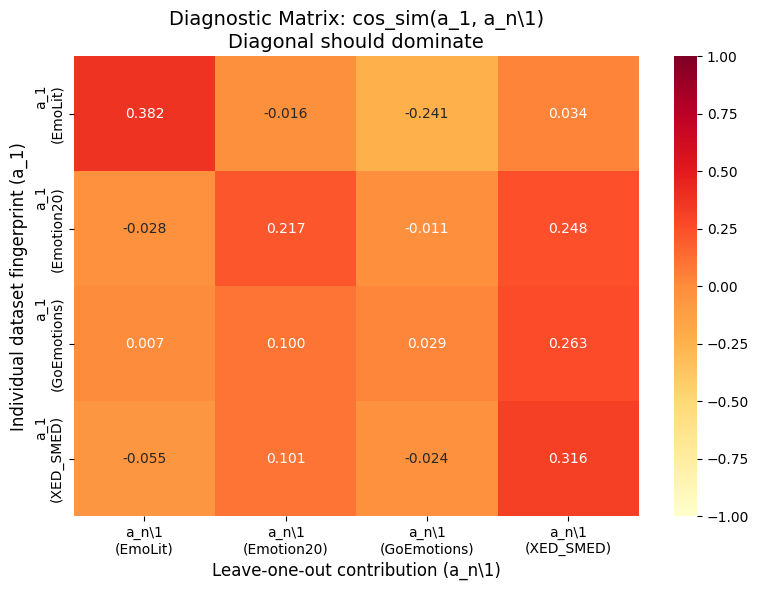

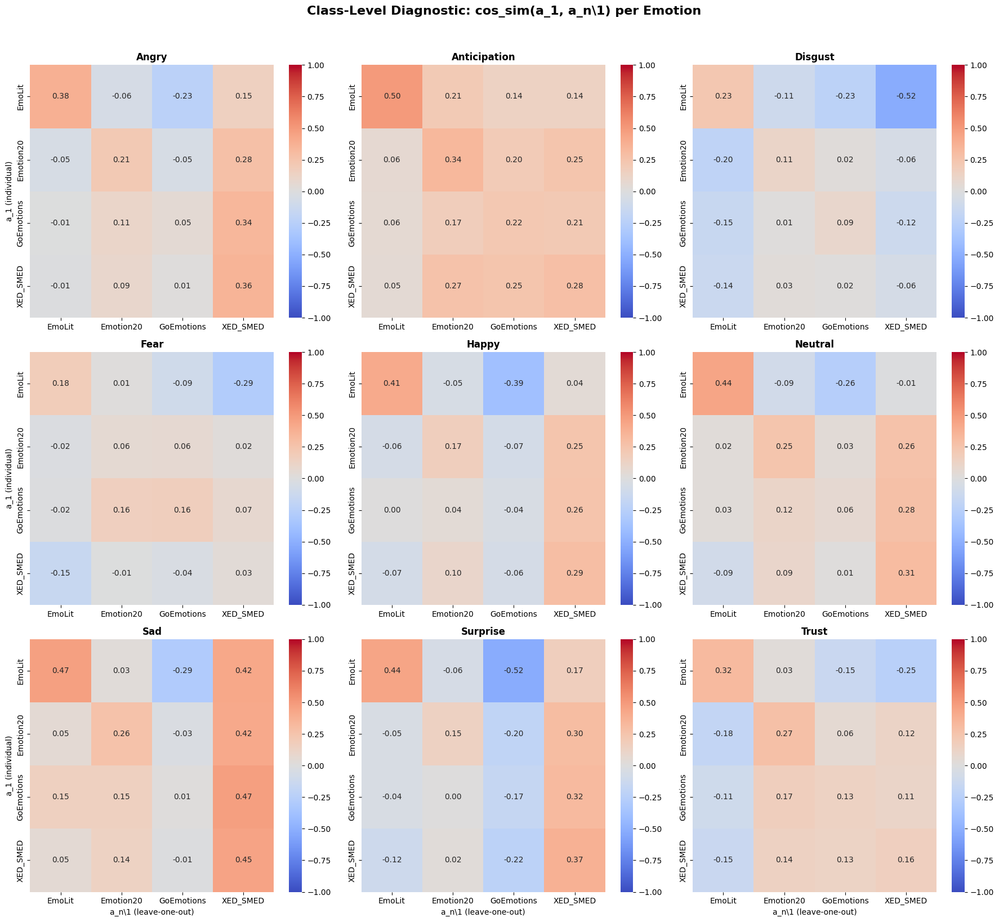

In [39]:
# a_{n\1,i}  =  alpha_n - alpha_{n-1,i}   (contribution of dataset i)
# a_{1,i}    =  alpha_{1,i}                 (fingerprint from dataset i alone)
# D[i,j]     =  cos_sim(a_{1,i}, a_{n\1,j})  — diagonal should dominate

alpha_n_matrix = aligned_matrices["alpha_n"]

a_n1 = {}
for name, n1_key in zip(DATASET_NAMES, N1_KEYS):
    diff = alpha_n_matrix - aligned_matrices[n1_key]
    a_n1[name] = diff.flatten()
    print(f"  a_n\\1 [{name}]: norm={np.linalg.norm(a_n1[name]):.4f}")

a_1 = {}
for name, s_key in zip(DATASET_NAMES, SINGLE_KEYS):
    a_1[name] = aligned_matrices[s_key].flatten()
    print(f"  a_1   [{name}]: norm={np.linalg.norm(a_1[name]):.4f}")

# Build 4x4 matrix
diagnostic_matrix = np.zeros((4, 4))
for i, name_i in enumerate(DATASET_NAMES):
    for j, name_j in enumerate(DATASET_NAMES):
        diagnostic_matrix[i, j] = sklearn_cosine_sim(
            a_1[name_i].reshape(1, -1), a_n1[name_j].reshape(1, -1)
        )[0, 0]

diag_df = pd.DataFrame(
    diagnostic_matrix,
    index  =[f"a_1({n})"    for n in DATASET_NAMES],
    columns=[f"a_n\\1({n})" for n in DATASET_NAMES],
)
print("\nDiagnostic Matrix:")
print(diag_df.to_string())
print(f"\nDiagonal: {np.diag(diagnostic_matrix)}")
for i, name in enumerate(DATASET_NAMES):
    row = diagnostic_matrix[i]
    dominant = all(row[i] >= row[j] for j in range(4) if j != i)
    print(f"  {name}: diag={row[i]:.4f}  dominant={'YES' if dominant else 'NO'}")

fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(
    diagnostic_matrix, annot=True, fmt=".3f", cmap="YlOrRd",
    xticklabels=[f"a_n\\1\n({n})" for n in DATASET_NAMES],
    yticklabels=[f"a_1\n({n})"    for n in DATASET_NAMES],
    vmin=-1, vmax=1, center=0, ax=ax,
)
ax.set_title("Diagnostic Matrix: cos_sim(a_1, a_n\\1)\nDiagonal should dominate", fontsize=14)
ax.set_xlabel("Leave-one-out contribution (a_n\\1)", fontsize=12)
ax.set_ylabel("Individual dataset fingerprint (a_1)", fontsize=12)
plt.tight_layout()
plt.show()

class_diagnostics = {}
for class_idx, class_name in ID2LABEL.items():
    D_class = np.zeros((4, 4))
    for i, name_i in enumerate(DATASET_NAMES):
        for j, name_j in enumerate(DATASET_NAMES):
            vec_1  = aligned_matrices[SINGLE_KEYS[i]][:, class_idx].reshape(1, -1)
            vec_n1 = (alpha_n_matrix[:, class_idx] -
                      aligned_matrices[N1_KEYS[j]][:, class_idx]).reshape(1, -1)
            if np.linalg.norm(vec_1) < 1e-10 or np.linalg.norm(vec_n1) < 1e-10:
                D_class[i, j] = 0.0
            else:
                D_class[i, j] = sklearn_cosine_sim(vec_1, vec_n1)[0, 0]
    class_diagnostics[class_name] = D_class

fig, axes = plt.subplots(3, 3, figsize=(18, 16))
for idx, (class_name, D_class) in enumerate(class_diagnostics.items()):
    row, col = divmod(idx, 3)
    ax = axes[row][col]
    sns.heatmap(D_class, annot=True, fmt=".2f", cmap="coolwarm",
                center=0, vmin=-1, vmax=1,
                xticklabels=DATASET_NAMES, yticklabels=DATASET_NAMES, ax=ax)
    ax.set_title(class_name, fontsize=12, fontweight='bold')
    ax.set_ylabel("a_1 (individual)"      if col == 0 else "", fontsize=10)
    ax.set_xlabel("a_n\\1 (leave-one-out)" if row == 2 else "", fontsize=10)
fig.suptitle("Class-Level Diagnostic: cos_sim(a_1, a_n\\1) per Emotion",
             fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

## Summary: Diagonal Dominance per Class

In [40]:
print(f"{'CLASS':<15} | {'DIAG MEAN':>10} | {'OFF-DIAG MEAN':>14} | {'DOMINANT?':>10}")
print("-" * 60)
for class_name, D_class in class_diagnostics.items():
    diag_vals     = np.diag(D_class)
    mask          = ~np.eye(4, dtype=bool)
    off_diag_mean = D_class[mask].mean()
    diag_mean     = diag_vals.mean()
    print(f"{class_name:<15} | {diag_mean:>10.4f} | {off_diag_mean:>14.4f} | "
          f"{'YES' if diag_mean > off_diag_mean else 'NO':>10}")

print("\n" + "="*60)
print("GLOBAL:")
d = np.diag(diagnostic_matrix)
m = diagnostic_matrix[~np.eye(4, dtype=bool)]
print(f"  Diagonal mean:     {d.mean():.4f}")
print(f"  Off-diagonal mean: {m.mean():.4f}")
print(f"  Diagonal dominant: {'YES' if d.mean() > m.mean() else 'NO'}")

CLASS           |  DIAG MEAN |  OFF-DIAG MEAN |  DOMINANT?
------------------------------------------------------------
Angry           |     0.2485 |         0.0477 |        YES
Anticipation    |     0.3354 |         0.1665 |        YES
Disgust         |     0.0924 |        -0.1201 |        YES
Fear            |     0.1091 |        -0.0238 |        YES
Happy           |     0.2064 |        -0.0018 |        YES
Neutral         |     0.2648 |         0.0332 |        YES
Sad             |     0.2995 |         0.1294 |        YES
Surprise        |     0.1978 |        -0.0326 |        YES
Trust           |     0.2211 |        -0.0062 |        YES

GLOBAL:
  Diagonal mean:     0.2360
  Off-diagonal mean: 0.0315
  Diagonal dominant: YES


## BEE SCORES BAR PLOTS

Pairwise Pearson Correlation (BEE scores, L2-normalized):
                   alpha_n  n-1_no_EmoLit  n-1_no_Emotion20  n-1_no_GoEmotions  n-1_no_XED_SMED  single_EmoLit  single_Emotion20  single_GoEmotions  single_XED_SMED  reference
alpha_n             1.0000         0.4625            0.7710             0.8238           0.6941         0.4032            0.1826             0.2860           0.2925     0.7991
n-1_no_EmoLit       0.4625         1.0000            0.3809             0.3725           0.2515         0.0113            0.2951             0.3691           0.4540     0.3078
n-1_no_Emotion20    0.7710         0.3809            1.0000             0.7377           0.6041         0.4556            0.0439             0.2421           0.2474     0.6159
n-1_no_GoEmotions   0.8238         0.3725            0.7377             1.0000           0.7307         0.4736            0.1295             0.1928           0.2352     0.7205
n-1_no_XED_SMED     0.6941         0.2515            0.6041   

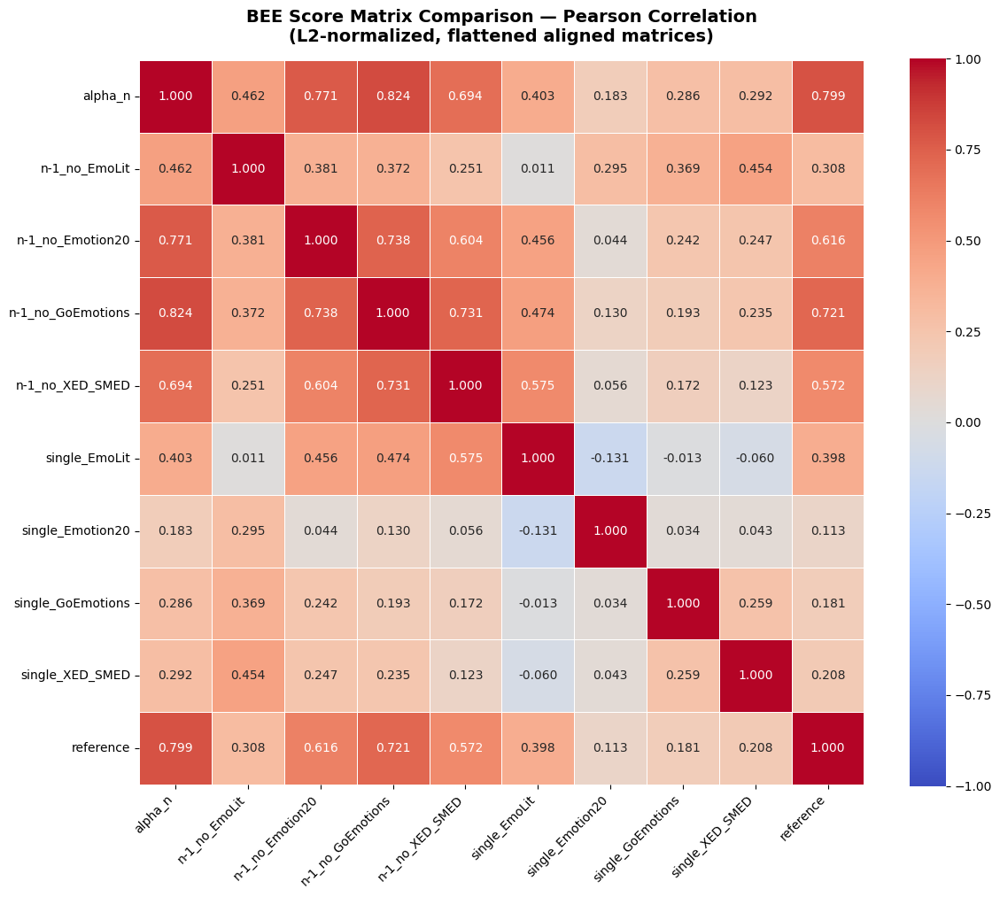

Saved: bee_pearson_global.png


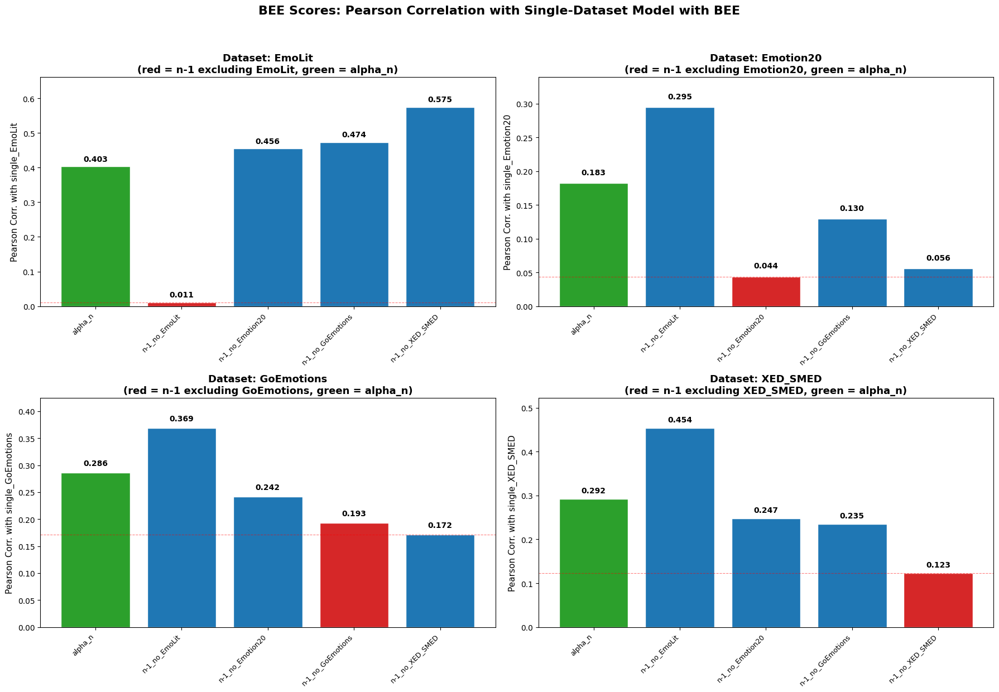

Saved: bee_barplot_pearson_vs_single.png

Summary: Is n-1_no_X the minimum BEE Pearson corr. with single_X?

  EmoLit (compared to single_EmoLit):
    alpha_n                   0.4032
    n-1_no_EmoLit             0.0113 ◄──  (EXCLUDED, MIN)
    n-1_no_Emotion20          0.4556
    n-1_no_GoEmotions         0.4736
    n-1_no_XED_SMED           0.5749
  Hypothesis supported: YES

  Emotion20 (compared to single_Emotion20):
    alpha_n                   0.1826
    n-1_no_EmoLit             0.2951
    n-1_no_Emotion20          0.0439 ◄──  (EXCLUDED, MIN)
    n-1_no_GoEmotions         0.1295
    n-1_no_XED_SMED           0.0558
  Hypothesis supported: YES

  GoEmotions (compared to single_GoEmotions):
    alpha_n                   0.2860
    n-1_no_EmoLit             0.3691
    n-1_no_Emotion20          0.2421
    n-1_no_GoEmotions         0.1928 ◄──  (EXCLUDED)
    n-1_no_XED_SMED           0.1716 ◄──  (MIN)
  Hypothesis supported: NO

  XED_SMED (compared to single_XED_SMED):
    alpha_n

In [41]:
# ══════════════════════════════════════════════════════════════════════════════
# Bar Plots: Pearson Correlation of BEE Scores with Single-Dataset Models
#
# For each dataset, compute Pearson correlation between the single-dataset
# model's BEE matrix and: alpha_n, reference, and all N-1 models.
# The N-1 model excluding that dataset (red) should show the lowest
# correlation with the single-dataset model.
# ══════════════════════════════════════════════════════════════════════════════

from scipy.stats import pearsonr

# ── 1. Flatten and L2-normalize BEE aligned matrices ────────────────────────

def l2_normalize(v):
    norm = np.linalg.norm(v)
    return v / norm if norm > 1e-10 else v

bee_flattened = {}
for k in aligned_matrices:
    bee_flattened[k] = l2_normalize(aligned_matrices[k].flatten())

bee_model_keys = list(aligned_matrices.keys())
n_bee_models = len(bee_model_keys)

# ── 2. Compute pairwise Pearson correlation on BEE matrices ──────────────────

bee_pearson_matrix = np.zeros((n_bee_models, n_bee_models))
for i, ki in enumerate(bee_model_keys):
    for j, kj in enumerate(bee_model_keys):
        bee_pearson_matrix[i, j], _ = pearsonr(bee_flattened[ki], bee_flattened[kj])

print("Pairwise Pearson Correlation (BEE scores, L2-normalized):")
bee_pearson_df = pd.DataFrame(bee_pearson_matrix, index=bee_model_keys, columns=bee_model_keys)
print(bee_pearson_df.to_string(float_format="%.4f"))


# ── 3. Global heatmap ───────────────────────────────────────────────────────

fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(bee_pearson_df, annot=True, fmt=".3f", cmap="coolwarm", center=0,
            vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
            square=True, ax=ax)
ax.set_title("BEE Score Matrix Comparison — Pearson Correlation\n"
             "(L2-normalized, flattened aligned matrices)",
             fontsize=14, fontweight="bold", pad=15)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")
plt.tight_layout()
plt.savefig("bee_pearson_global.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved: bee_pearson_global.png")


# ── 4. Bar plots: Pearson with single-dataset model ─────────────────────────

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

for ds_idx, (ds_name, n1_key, single_key) in enumerate(zip(DATASET_NAMES, N1_KEYS, SINGLE_KEYS)):
    row, col = divmod(ds_idx, 2)
    ax = axes[row][col]

    if single_key not in bee_model_keys:
        ax.set_title(f"{ds_name} — single model not available")
        continue

    single_idx = bee_model_keys.index(single_key)

    # Models to compare: alpha_n, reference (if available), all N-1
    # bar_models = ["alpha_n"] + (["reference"] if "reference" in bee_model_keys else []) + N1_KEYS
    bar_models = ["alpha_n"] +  N1_KEYS

    bar_labels = []
    bar_values = []
    bar_colors = []

    for bm in bar_models:
        if bm not in bee_model_keys:
            continue
        bm_idx = bee_model_keys.index(bm)
        corr = bee_pearson_matrix[single_idx, bm_idx]
        bar_labels.append(bm)
        bar_values.append(corr)

        if bm == n1_key:
            bar_colors.append("#d62728")   # red — excluded
        elif bm == "reference":
            bar_colors.append("#7f7f7f")   # grey
        elif bm == "alpha_n":
            bar_colors.append("#2ca02c")   # green
        else:
            bar_colors.append("#1f77b4")   # blue

    bars = ax.bar(range(len(bar_labels)), bar_values, color=bar_colors, edgecolor="white")

    for bar_obj, val in zip(bars, bar_values):
        ax.text(bar_obj.get_x() + bar_obj.get_width() / 2, bar_obj.get_height() + 0.01,
                f"{val:.3f}", ha="center", va="bottom", fontsize=10, fontweight="bold")

    ax.set_xticks(range(len(bar_labels)))
    ax.set_xticklabels(bar_labels, rotation=45, ha="right", fontsize=9)
    ax.set_ylabel(f"Pearson Corr. with {single_key}", fontsize=11)
    ax.set_title(f"Dataset: {ds_name}\n(red = n-1 excluding {ds_name}, green = alpha_n)",
                 fontsize=13, fontweight="bold")
    ax.set_ylim(0, max(bar_values) * 1.15)

    # Dashed red line at minimum N-1 correlation
    n1_vals = [v for v, l in zip(bar_values, bar_labels) if l in N1_KEYS]
    if n1_vals:
        ax.axhline(y=min(n1_vals), color="red", linestyle="--", linewidth=0.8, alpha=0.5)

fig.suptitle("BEE Scores: Pearson Correlation with Single-Dataset Model with BEE",
             fontsize=16, fontweight="bold", y=1.03)
plt.tight_layout()
plt.savefig("bee_barplot_pearson_vs_single.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved: bee_barplot_pearson_vs_single.png")


# ── 5. Summary table ────────────────────────────────────────────────────────

print("\n" + "=" * 70)
print("Summary: Is n-1_no_X the minimum BEE Pearson corr. with single_X?")
print("=" * 70)

for ds_name, n1_key, single_key in zip(DATASET_NAMES, N1_KEYS, SINGLE_KEYS):
    if single_key not in bee_model_keys:
        print(f"\n  {ds_name}: single model not available")
        continue

    single_idx = bee_model_keys.index(single_key)

    # compare_models = ["alpha_n"] + (["reference"] if "reference" in bee_model_keys else []) + N1_KEYS
    compare_models = ["alpha_n"] + N1_KEYS
    all_corrs = {}
    for bm in compare_models:
        if bm in bee_model_keys:
            bm_idx = bee_model_keys.index(bm)
            all_corrs[bm] = bee_pearson_matrix[single_idx, bm_idx]

    n1_corrs = {k: v for k, v in all_corrs.items() if k in N1_KEYS}
    min_model = min(n1_corrs, key=n1_corrs.get)
    is_minimum = (min_model == n1_key)

    print(f"\n  {ds_name} (compared to {single_key}):")
    for bm, corr in all_corrs.items():
        tags = []
        if bm == n1_key:
            tags.append("EXCLUDED")
        if bm in N1_KEYS and bm == min_model:
            tags.append("MIN")
        tag_str = f"  ({', '.join(tags)})" if tags else ""
        marker = " ◄──" if tags else ""
        print(f"    {bm:<25} {corr:.4f}{marker}{tag_str}")
    print(f"  Hypothesis supported: {'YES' if is_minimum else 'NO'}")


## Logit-Based Matrix Comparison: Dataset Membership Hypothesis

For each model, pass all union keywords through the model and collect raw output logits into a matrix [keywords × classes]. Then compare these matrices pairwise using **cosine similarity** and **Pearson correlation**.

**Hypothesis:** A model trained on dataset A will produce a logit matrix more similar to other models also trained on A than to models not trained on A.

Includes:
- Global comparison (full flattened logit matrices)
- Per-class comparison (one emotion column at a time)
- Within-dataset vs cross-dataset similarity test

Computing logit matrix for: alpha_n


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (535, 9)
Computing logit matrix for: reference


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (535, 9)
Computing logit matrix for: n-1_no_EmoLit


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (535, 9)
Computing logit matrix for: n-1_no_Emotion20


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (535, 9)
Computing logit matrix for: n-1_no_GoEmotions


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (535, 9)
Computing logit matrix for: n-1_no_XED_SMED


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (535, 9)
Computing logit matrix for: single_EmoLit


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (535, 9)
Computing logit matrix for: single_Emotion20


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (535, 9)
Computing logit matrix for: single_GoEmotions


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (535, 9)
Computing logit matrix for: single_XED_SMED


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (535, 9)
✓ Logit matrices computed for 10 models.
  alpha_n: flattened (535, 9) -> (4815,), L2 norm after normalization: 1.0000
  reference: flattened (535, 9) -> (4815,), L2 norm after normalization: 1.0000
  n-1_no_EmoLit: flattened (535, 9) -> (4815,), L2 norm after normalization: 1.0000
  n-1_no_Emotion20: flattened (535, 9) -> (4815,), L2 norm after normalization: 1.0000
  n-1_no_GoEmotions: flattened (535, 9) -> (4815,), L2 norm after normalization: 1.0000
  n-1_no_XED_SMED: flattened (535, 9) -> (4815,), L2 norm after normalization: 1.0000
  single_EmoLit: flattened (535, 9) -> (4815,), L2 norm after normalization: 1.0000
  single_Emotion20: flattened (535, 9) -> (4815,), L2 norm after normalization: 1.0000
  single_GoEmotions: flattened (535, 9) -> (4815,), L2 norm after normalization: 1.0000
  single_XED_SMED: flattened (535, 9) -> (4815,), L2 norm after normalization: 1.0000
Pairwise Cosine Similarity (on L2-normalized flattened logit matrices):
                   al

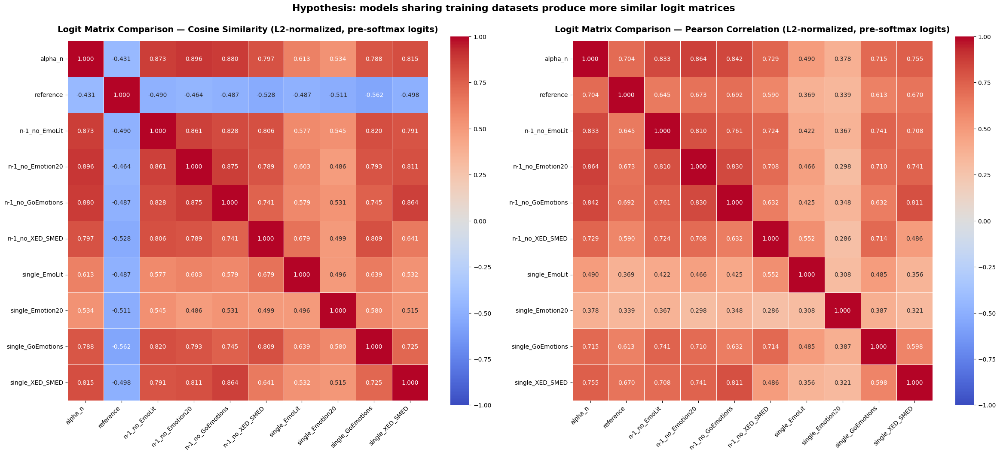

Saved: logit_matrix_comparison_global.png


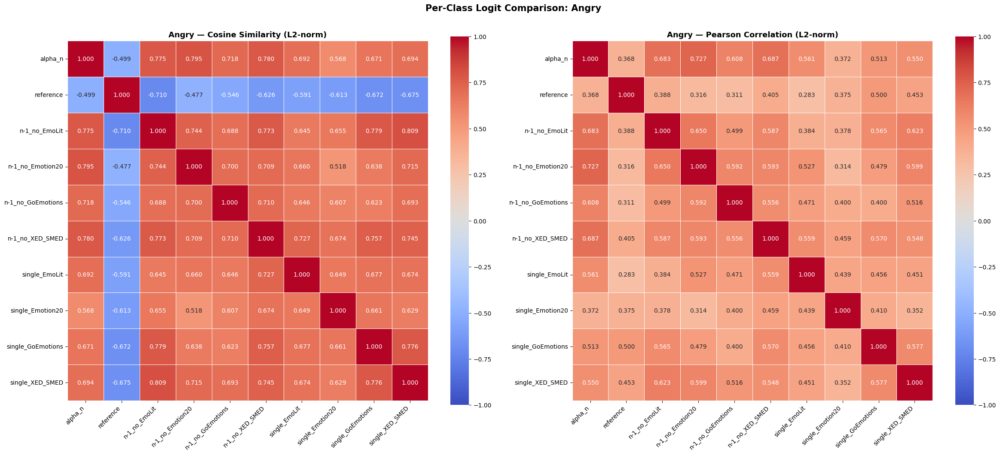

Saved: logit_comparison_Angry.png


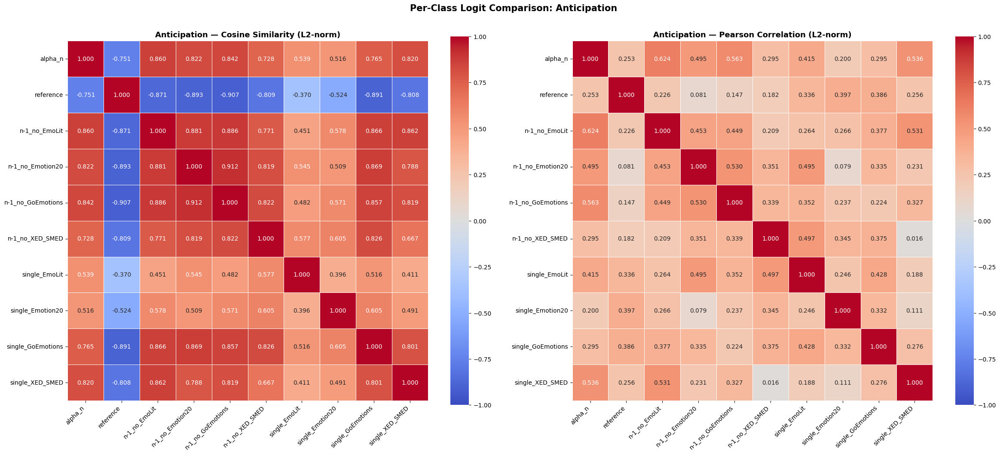

Saved: logit_comparison_Anticipation.png


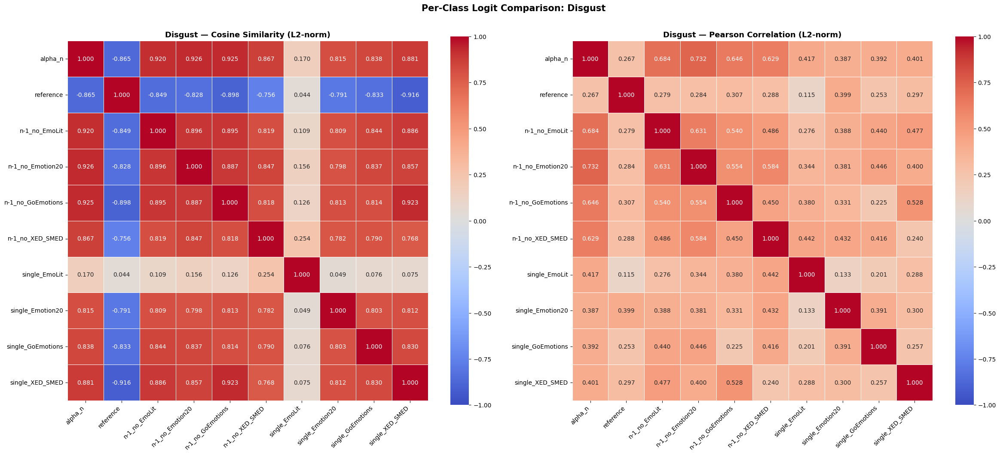

Saved: logit_comparison_Disgust.png


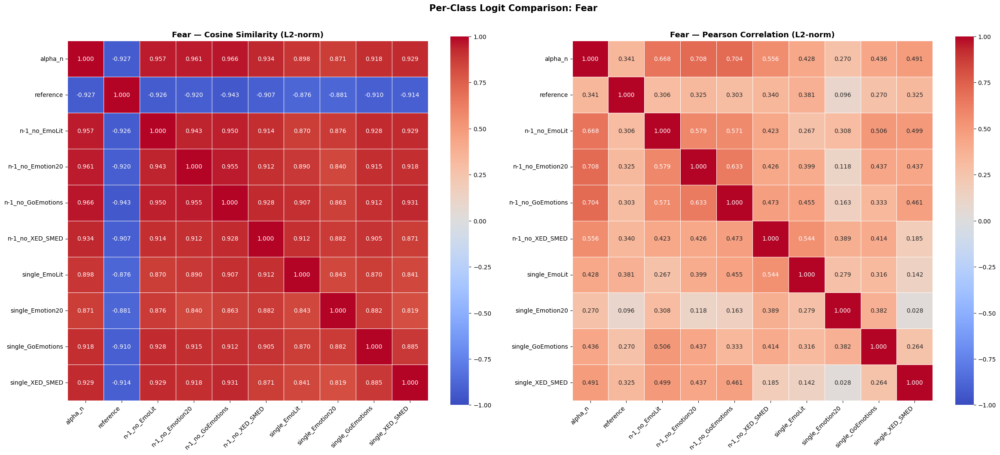

Saved: logit_comparison_Fear.png


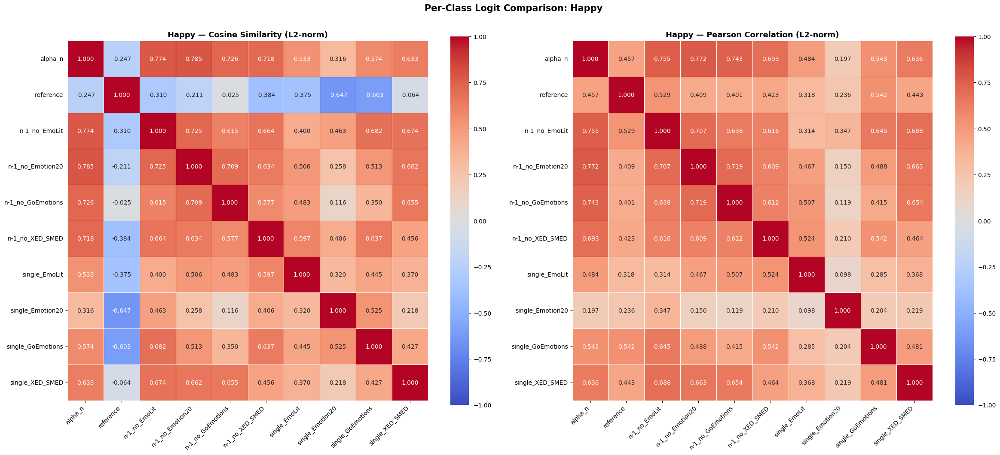

Saved: logit_comparison_Happy.png


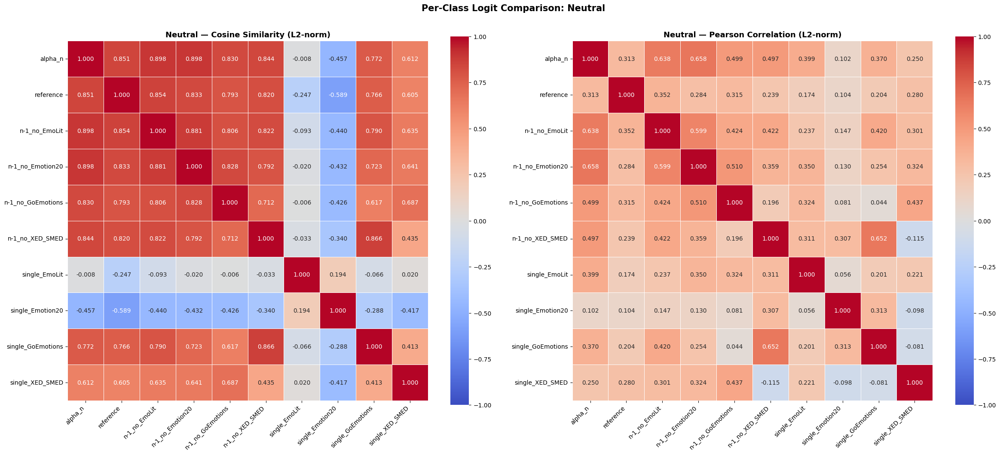

Saved: logit_comparison_Neutral.png


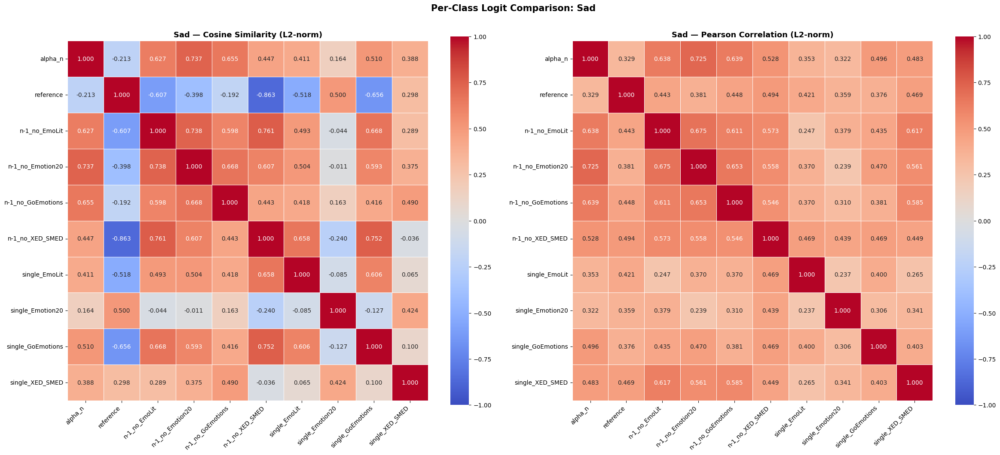

Saved: logit_comparison_Sad.png


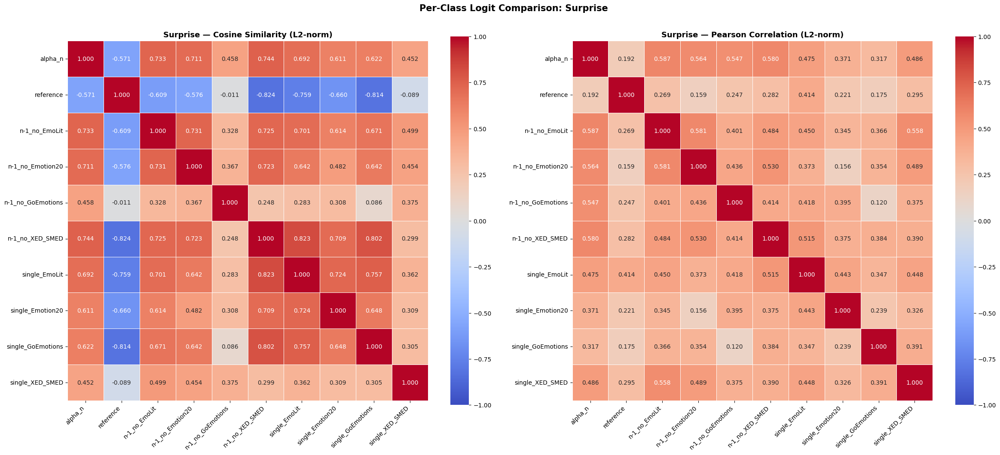

Saved: logit_comparison_Surprise.png


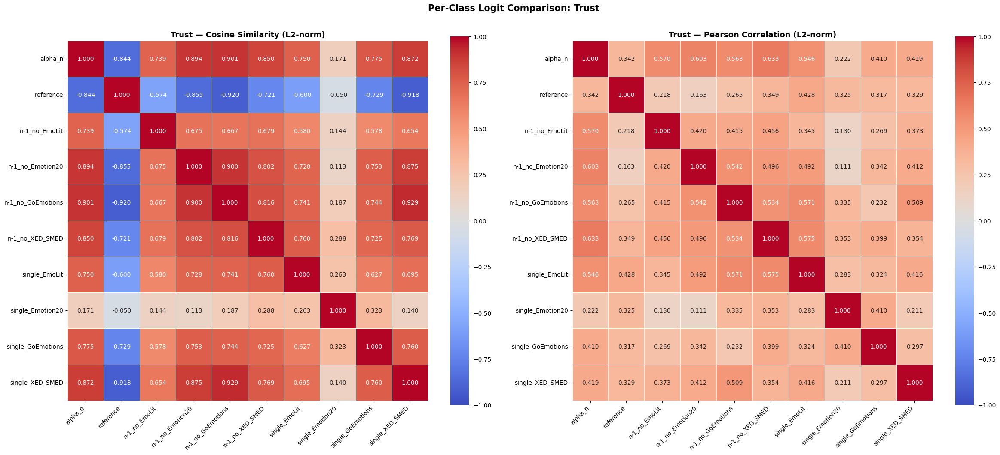

Saved: logit_comparison_Trust.png
Hypothesis Test: Within-dataset vs Cross-dataset Similarity
(using L2-normalized, pre-softmax logit matrices)
Dataset         | Metric     | Within (mean)   | Cross (mean)    |    Delta |  Supports?
-------------------------------------------------------------------------------------
EmoLit          | Cosine     | 0.7452          | 0.6964          |  +0.0488 |        YES
EmoLit          | Pearson    | 0.6538          | 0.5787          |  +0.0751 |        YES
Emotion20       | Cosine     | 0.7034          | 0.7110          |  -0.0077 |         NO
Emotion20       | Pearson    | 0.5900          | 0.5988          |  -0.0088 |         NO
GoEmotions      | Cosine     | 0.8232          | 0.6803          |  +0.1429 |        YES
GoEmotions      | Pearson    | 0.7548          | 0.5557          |  +0.1991 |        YES
XED_SMED        | Cosine     | 0.8494          | 0.6580          |  +0.1913 |        YES
XED_SMED        | Pearson    | 0.7955          | 0.5273   

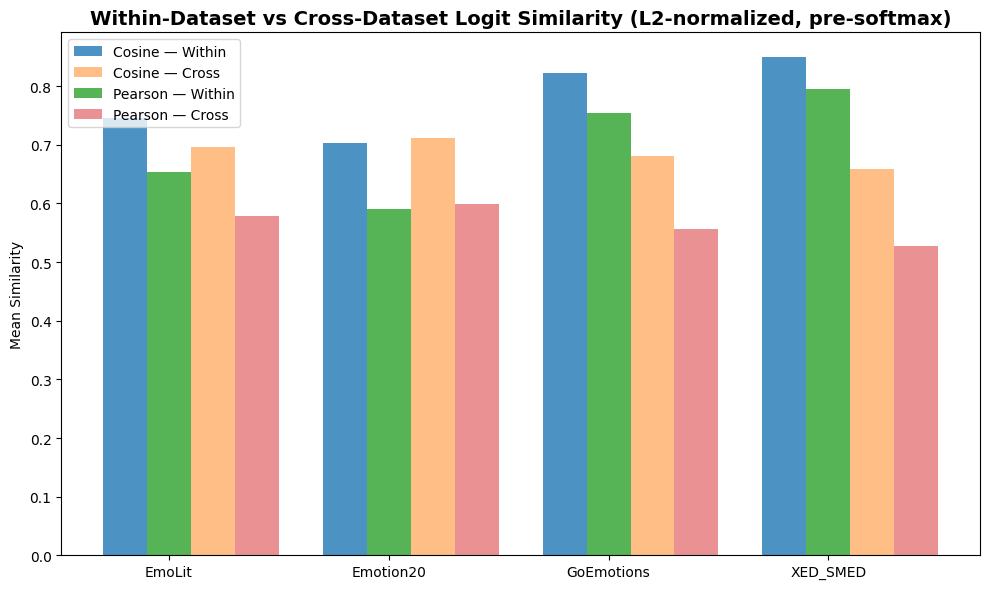

Saved: logit_hypothesis_test.png


In [42]:
# ══════════════════════════════════════════════════════════════════════════════
# Logit-Based Matrix Comparison across Model Variants
#
# For each model, pass all union keywords through the model and collect the
# raw output logits (pre-softmax) into a matrix of shape [num_keywords, num_classes].
# Flatten and L2-normalize each matrix, then compare pairwise using cosine
# similarity and Pearson correlation.
#
# Hypothesis: A model trained on dataset A should produce logit matrices more
# similar to other models also trained on A than to models not trained on A.
# ══════════════════════════════════════════════════════════════════════════════

from scipy.stats import pearsonr

# ── 1. Compute logit matrices for all models ────────────────────────────────

def compute_logit_matrix(model_path, keywords):
    """
    Pass each keyword through the model and collect the raw logits (pre-softmax).
    Returns: logit_matrix [num_keywords, num_classes]
    """
    tokenizer = AutoTokenizer.from_pretrained(model_path)
    tokenizer.pad_token = tokenizer.eos_token
    model = AutoModelForSequenceClassification.from_pretrained(
        model_path, torch_dtype=torch.float32
    ).to(device).eval()

    num_classes = model.config.num_labels
    logit_matrix = np.zeros((len(keywords), num_classes))

    batch_size = 64
    for start in range(0, len(keywords), batch_size):
        batch = keywords[start:start + batch_size]
        inputs = tokenizer(batch, padding=True, truncation=True, return_tensors="pt")
        inputs = {k: v.to(model.device) for k, v in inputs.items()}
        with torch.no_grad():
            outputs = model(**inputs)
            logits = outputs.logits.cpu().numpy()  # [batch, num_classes] — raw, pre-softmax
        logit_matrix[start:start + len(batch)] = logits

    del model, tokenizer
    gc.collect()
    torch.cuda.empty_cache()
    return logit_matrix


# Models to process: all trained + reference
ALL_KEYS = ["alpha_n", "reference"] + N1_KEYS + SINGLE_KEYS

logit_matrices = {}
for config_key in ALL_KEYS:
    model_path = MODEL_PATHS.get(config_key)
    if model_path is None or not os.path.isdir(model_path):
        print(f"  SKIP {config_key}: model not found")
        continue
    print(f"Computing logit matrix for: {config_key}")
    logit_matrices[config_key] = compute_logit_matrix(model_path, all_keywords_union)
    print(f"  Shape: {logit_matrices[config_key].shape}")

print(f"✓ Logit matrices computed for {len(logit_matrices)} models.")


# ── 2. Flatten + L2-normalize, then pairwise comparison ─────────────────────

model_keys = list(logit_matrices.keys())
n_models = len(model_keys)

def l2_normalize(v):
    norm = np.linalg.norm(v)
    return v / norm if norm > 1e-10 else v

# Flatten each logit matrix and L2-normalize the resulting vector
flattened = {}
for k in model_keys:
    flat = logit_matrices[k].flatten()
    flattened[k] = l2_normalize(flat)
    print(f"  {k}: flattened {logit_matrices[k].shape} -> {flat.shape}, "
          f"L2 norm after normalization: {np.linalg.norm(flattened[k]):.4f}")

# Cosine similarity matrix
cos_sim_matrix = np.zeros((n_models, n_models))
for i, ki in enumerate(model_keys):
    for j, kj in enumerate(model_keys):
        cos_sim_matrix[i, j] = sklearn_cosine_sim(
            flattened[ki].reshape(1, -1), flattened[kj].reshape(1, -1)
        )[0, 0]

# Pearson correlation matrix
pearson_matrix = np.zeros((n_models, n_models))
for i, ki in enumerate(model_keys):
    for j, kj in enumerate(model_keys):
        pearson_matrix[i, j], _ = pearsonr(flattened[ki], flattened[kj])

print("Pairwise Cosine Similarity (on L2-normalized flattened logit matrices):")
cos_df = pd.DataFrame(cos_sim_matrix, index=model_keys, columns=model_keys)
print(cos_df.to_string(float_format="%.4f"))

print("Pairwise Pearson Correlation (on L2-normalized flattened logit matrices):")
pear_df = pd.DataFrame(pearson_matrix, index=model_keys, columns=model_keys)
print(pear_df.to_string(float_format="%.4f"))


# ── 3. Visualize: Cosine Similarity & Pearson Heatmaps ──────────────────────

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 10))

sns.heatmap(cos_df, annot=True, fmt=".3f", cmap="coolwarm", center=0,
            vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
            square=True, ax=ax1)
ax1.set_title("Logit Matrix Comparison — Cosine Similarity (L2-normalized, pre-softmax logits)",
              fontsize=14, fontweight="bold", pad=15)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha="right")

sns.heatmap(pear_df, annot=True, fmt=".3f", cmap="coolwarm", center=0,
            vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
            square=True, ax=ax2)
ax2.set_title("Logit Matrix Comparison — Pearson Correlation (L2-normalized, pre-softmax logits)",
              fontsize=14, fontweight="bold", pad=15)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha="right")

fig.suptitle("Hypothesis: models sharing training datasets produce more similar logit matrices",
             fontsize=16, fontweight="bold", y=1.02)
plt.tight_layout()
plt.savefig("logit_matrix_comparison_global.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved: logit_matrix_comparison_global.png")


# ── 4. Per-class comparison ─────────────────────────────────────────────────
# Compare the logit columns (one emotion at a time) across models
# Each column is also L2-normalized before comparison

for class_idx, class_name in ID2LABEL.items():
    cos_class = np.zeros((n_models, n_models))
    pear_class = np.zeros((n_models, n_models))

    # L2-normalize each model's column for this class
    cols_normed = {}
    for k in model_keys:
        cols_normed[k] = l2_normalize(logit_matrices[k][:, class_idx])

    for i, ki in enumerate(model_keys):
        for j, kj in enumerate(model_keys):
            cos_class[i, j] = sklearn_cosine_sim(
                cols_normed[ki].reshape(1, -1), cols_normed[kj].reshape(1, -1)
            )[0, 0]
            if np.std(cols_normed[ki]) > 1e-10 and np.std(cols_normed[kj]) > 1e-10:
                pear_class[i, j], _ = pearsonr(cols_normed[ki], cols_normed[kj])
            else:
                pear_class[i, j] = 0.0

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 10))

    sns.heatmap(pd.DataFrame(cos_class, index=model_keys, columns=model_keys),
                annot=True, fmt=".3f", cmap="coolwarm", center=0,
                vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
                square=True, ax=ax1)
    ax1.set_title(f"{class_name} — Cosine Similarity (L2-norm)", fontsize=13, fontweight="bold")
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha="right")

    sns.heatmap(pd.DataFrame(pear_class, index=model_keys, columns=model_keys),
                annot=True, fmt=".3f", cmap="coolwarm", center=0,
                vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
                square=True, ax=ax2)
    ax2.set_title(f"{class_name} — Pearson Correlation (L2-norm)", fontsize=13, fontweight="bold")
    ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha="right")

    fig.suptitle(f"Per-Class Logit Comparison: {class_name}",
                 fontsize=15, fontweight="bold", y=1.02)
    plt.tight_layout()
    plt.savefig(f"logit_comparison_{class_name}.png", dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: logit_comparison_{class_name}.png")


# ── 5. Hypothesis test summary ──────────────────────────────────────────────
# For each dataset, compare:
#   - WITHIN: similarity between models that include that dataset
#   - WITHOUT: similarity between a model with the dataset and one without

DATASET_MEMBERSHIP = {
    "EmoLit":     {"includes": ["alpha_n", "n-1_no_Emotion20", "n-1_no_GoEmotions", "n-1_no_XED_SMED", "single_EmoLit"],
                   "excludes": ["n-1_no_EmoLit", "single_Emotion20", "single_GoEmotions", "single_XED_SMED"]},
    "Emotion20":  {"includes": ["alpha_n", "n-1_no_EmoLit", "n-1_no_GoEmotions", "n-1_no_XED_SMED", "single_Emotion20"],
                   "excludes": ["n-1_no_Emotion20", "single_EmoLit", "single_GoEmotions", "single_XED_SMED"]},
    "GoEmotions": {"includes": ["alpha_n", "n-1_no_EmoLit", "n-1_no_Emotion20", "n-1_no_XED_SMED", "single_GoEmotions"],
                   "excludes": ["n-1_no_GoEmotions", "single_EmoLit", "single_Emotion20", "single_XED_SMED"]},
    "XED_SMED":   {"includes": ["alpha_n", "n-1_no_EmoLit", "n-1_no_Emotion20", "n-1_no_GoEmotions", "single_XED_SMED"],
                   "excludes": ["n-1_no_XED_SMED", "single_EmoLit", "single_Emotion20", "single_GoEmotions"]},
}

print("=" * 80)
print("Hypothesis Test: Within-dataset vs Cross-dataset Similarity")
print("(using L2-normalized, pre-softmax logit matrices)")
print("=" * 80)
print(f"{'Dataset':<15} | {'Metric':<10} | {'Within (mean)':<15} | {'Cross (mean)':<15} | {'Delta':>8} | {'Supports?':>10}")
print("-" * 85)

summary_rows = []
for ds_name, groups in DATASET_MEMBERSHIP.items():
    includes = [k for k in groups["includes"] if k in logit_matrices]
    excludes = [k for k in groups["excludes"] if k in logit_matrices]

    for metric_name, matrix in [("Cosine", cos_sim_matrix), ("Pearson", pearson_matrix)]:
        # Within: pairs among models that include this dataset
        within_scores = []
        for i, ki in enumerate(model_keys):
            for j, kj in enumerate(model_keys):
                if i < j and ki in includes and kj in includes:
                    within_scores.append(matrix[i, j])

        # Cross: pairs between include and exclude
        cross_scores = []
        for i, ki in enumerate(model_keys):
            for j, kj in enumerate(model_keys):
                if ki in includes and kj in excludes:
                    cross_scores.append(matrix[i, j])

        within_mean = np.mean(within_scores) if within_scores else 0
        cross_mean = np.mean(cross_scores) if cross_scores else 0
        delta = within_mean - cross_mean
        supports = "YES" if delta > 0 else "NO"

        print(f"{ds_name:<15} | {metric_name:<10} | {within_mean:<15.4f} | {cross_mean:<15.4f} | {delta:>+8.4f} | {supports:>10}")
        summary_rows.append({
            "Dataset": ds_name, "Metric": metric_name,
            "Within": within_mean, "Cross": cross_mean,
            "Delta": delta, "Supports": supports
        })

# Visualize the hypothesis test
summary_df_hyp = pd.DataFrame(summary_rows)
fig, ax = plt.subplots(figsize=(10, 6))
x = np.arange(len(DATASET_MEMBERSHIP))
width = 0.2

for idx, metric in enumerate(["Cosine", "Pearson"]):
    subset = summary_df_hyp[summary_df_hyp["Metric"] == metric]
    ax.bar(x + idx * width - width/2, subset["Within"].values, width,
           label=f"{metric} — Within", alpha=0.8)
    ax.bar(x + idx * width - width/2 + 2*width, subset["Cross"].values, width,
           label=f"{metric} — Cross", alpha=0.5)

ax.set_xticks(x + width/2)
ax.set_xticklabels(DATASET_MEMBERSHIP.keys())
ax.set_ylabel("Mean Similarity")
ax.set_title("Within-Dataset vs Cross-Dataset Logit Similarity (L2-normalized, pre-softmax)",
             fontsize=14, fontweight="bold")
ax.legend()
ax.axhline(y=0, color="black", linewidth=0.5)
plt.tight_layout()
plt.savefig("logit_hypothesis_test.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved: logit_hypothesis_test.png")


## LOGITS Bar Plots: Pearson Correlation with Single-Dataset Models

For each dataset, plot the Pearson correlation of its **single-dataset model** with: alpha_n, reference, and all N-1 models. The bar for the N-1 model that **excludes** that dataset (red) should be the lowest, confirming that removing a dataset makes the model least similar to a model trained only on that dataset.

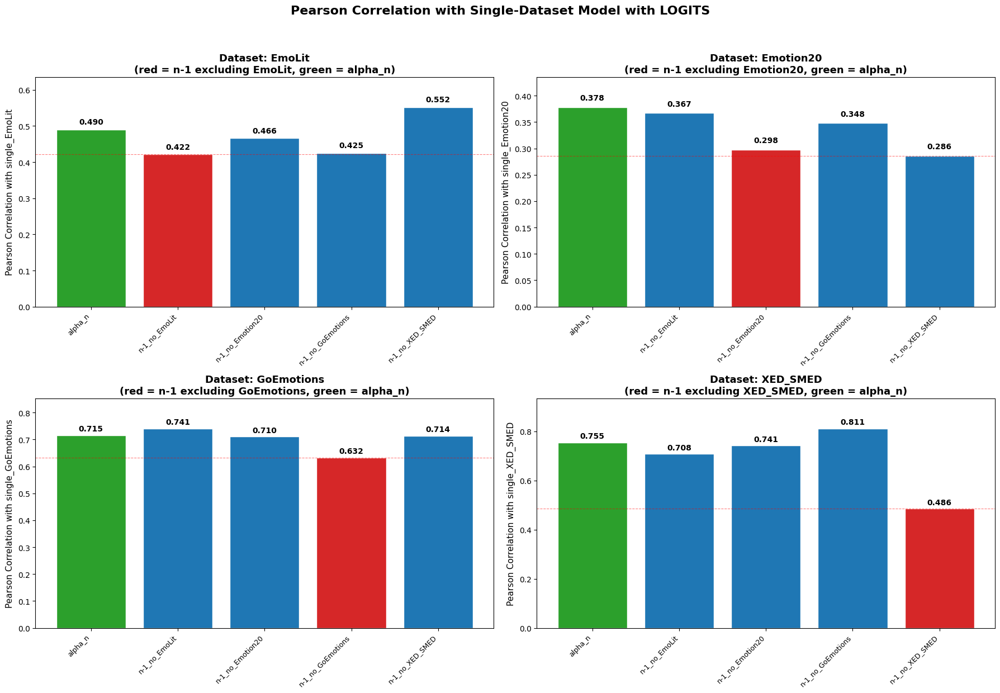

Saved: logit_barplot_pearson_vs_single.png
Summary: Is n-1_no_X the minimum Pearson correlation with single_X?
EmoLit (compared to single_EmoLit):
    alpha_n                   0.4901
    reference                 0.3686
    n-1_no_EmoLit             0.4216 ◄──  (EXCLUDED, MIN)
    n-1_no_Emotion20          0.4659
    n-1_no_GoEmotions         0.4250
    n-1_no_XED_SMED           0.5522
  Hypothesis supported: YES
Emotion20 (compared to single_Emotion20):
    alpha_n                   0.3783
    reference                 0.3388
    n-1_no_EmoLit             0.3670
    n-1_no_Emotion20          0.2978 ◄──  (EXCLUDED)
    n-1_no_GoEmotions         0.3481
    n-1_no_XED_SMED           0.2860 ◄──  (MIN)
  Hypothesis supported: NO
GoEmotions (compared to single_GoEmotions):
    alpha_n                   0.7148
    reference                 0.6128
    n-1_no_EmoLit             0.7408
    n-1_no_Emotion20          0.7103
    n-1_no_GoEmotions         0.6318 ◄──  (EXCLUDED, MIN)
    n-1_no_XED

In [54]:
# ══════════════════════════════════════════════════════════════════════════════
# Bar Plots: Pearson Correlation with single-dataset model per Dataset
#
# For each dataset, show the Pearson correlation of that dataset's single model
# with: alpha_n, reference, and all N-1 models.
# Hypothesis: the bar for n-1_no_X should be the lowest (minimum correlation
# when dataset X is removed), because removing dataset X makes the model
# least similar to a model trained only on X.
# ══════════════════════════════════════════════════════════════════════════════

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

for ds_idx, (ds_name, n1_key, single_key) in enumerate(zip(DATASET_NAMES, N1_KEYS, SINGLE_KEYS)):
    row, col = divmod(ds_idx, 2)
    ax = axes[row][col]

    if single_key not in model_keys:
        ax.set_title(f"{ds_name} — single model not available")
        continue

    single_idx = model_keys.index(single_key)

    # Models to compare: alpha_n, reference, all N-1
    # bar_models = ["alpha_n", "reference"] + N1_KEYS
    bar_models = ["alpha_n"] + N1_KEYS

    bar_labels = []
    bar_values = []
    bar_colors = []

    for bm in bar_models:
        if bm not in model_keys:
            continue
        bm_idx = model_keys.index(bm)
        corr = pearson_matrix[single_idx, bm_idx]
        bar_labels.append(bm)
        bar_values.append(corr)

        if bm == n1_key:
            bar_colors.append("#d62728")  # red for the N-1 model excluding this dataset
        elif bm == "reference":
            bar_colors.append("#7f7f7f")  # grey for reference
        elif bm == "alpha_n":
            bar_colors.append("#2ca02c")  # green for alpha_n
        else:
            bar_colors.append("#1f77b4")  # blue for other N-1 models

    bars = ax.bar(range(len(bar_labels)), bar_values, color=bar_colors, edgecolor="white")

    # Add value labels on bars
    for bar_obj, val in zip(bars, bar_values):
        ax.text(bar_obj.get_x() + bar_obj.get_width() / 2, bar_obj.get_height() + 0.01,
                f"{val:.3f}", ha="center", va="bottom", fontsize=10, fontweight="bold")

    ax.set_xticks(range(len(bar_labels)))
    ax.set_xticklabels(bar_labels, rotation=45, ha="right", fontsize=9)
    ax.set_ylabel(f"Pearson Correlation with {single_key}", fontsize=11)
    ax.set_title(f"Dataset: {ds_name}\n(red = n-1 excluding {ds_name}, green = alpha_n)",
                 fontsize=13, fontweight="bold")
    ax.set_ylim(0, max(bar_values) * 1.15)

    # Dashed red line at the minimum N-1 correlation
    n1_values = [v for v, l in zip(bar_values, bar_labels) if l in N1_KEYS]
    if n1_values:
        ax.axhline(y=min(n1_values), color="red", linestyle="--", linewidth=0.8, alpha=0.5)

fig.suptitle("Pearson Correlation with Single-Dataset Model with LOGITS",
             fontsize=16, fontweight="bold", y=1.03)
plt.tight_layout()
plt.savefig("logit_barplot_pearson_vs_single.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved: logit_barplot_pearson_vs_single.png")

# ── Print summary table ─────────────────────────────────────────────────────

print("=" * 70)
print("Summary: Is n-1_no_X the minimum Pearson correlation with single_X?")
print("=" * 70)

for ds_name, n1_key, single_key in zip(DATASET_NAMES, N1_KEYS, SINGLE_KEYS):
    if single_key not in model_keys:
        print(f"{ds_name}: single model not available")
        continue

    single_idx = model_keys.index(single_key)

    # Collect correlations for all comparison models
    compare_models = ["alpha_n", "reference"] + N1_KEYS
    all_corrs = {}
    for bm in compare_models:
        if bm in model_keys:
            bm_idx = model_keys.index(bm)
            all_corrs[bm] = pearson_matrix[single_idx, bm_idx]

    # Find minimum among N-1 models only (for hypothesis test)
    n1_corrs = {k: v for k, v in all_corrs.items() if k in N1_KEYS}
    min_model = min(n1_corrs, key=n1_corrs.get)
    is_minimum = (min_model == n1_key)

    print(f"{ds_name} (compared to {single_key}):")
    for bm, corr in all_corrs.items():
        tags = []
        if bm == n1_key:
            tags.append("EXCLUDED")
        if bm in N1_KEYS and bm == min_model:
            tags.append("MIN")
        tag_str = f"  ({', '.join(tags)})" if tags else ""
        marker = " ◄──" if tags else ""
        print(f"    {bm:<25} {corr:.4f}{marker}{tag_str}")
    print(f"  Hypothesis supported: {'YES' if is_minimum else 'NO'}")


## Normalized Cross-Correlation on Soft-Softmax Logits (T=3.0)

Three metrics computed after applying soft-softmax (T=3.0), flattening, and L2-normalizing:

1. **Cosine Similarity** — NCC without mean subtraction: Σ(xi·yi) / (‖x‖·‖y‖)
2. **Pearson Correlation** (scipy.stats.pearsonr) — NCC with mean subtraction
3. **np.corrcoef** — NCC with mean subtraction (numpy implementation)

Pearson and corrcoef should produce identical results, serving as a sanity check.

  alpha_n: softmax(T=3.0) applied, shape (535, 9), row sums ≈ 1.0000
  reference: softmax(T=3.0) applied, shape (535, 9), row sums ≈ 1.0000
  n-1_no_EmoLit: softmax(T=3.0) applied, shape (535, 9), row sums ≈ 1.0000
  n-1_no_Emotion20: softmax(T=3.0) applied, shape (535, 9), row sums ≈ 1.0000
  n-1_no_GoEmotions: softmax(T=3.0) applied, shape (535, 9), row sums ≈ 1.0000
  n-1_no_XED_SMED: softmax(T=3.0) applied, shape (535, 9), row sums ≈ 1.0000
  single_EmoLit: softmax(T=3.0) applied, shape (535, 9), row sums ≈ 1.0000
  single_Emotion20: softmax(T=3.0) applied, shape (535, 9), row sums ≈ 1.0000
  single_GoEmotions: softmax(T=3.0) applied, shape (535, 9), row sums ≈ 1.0000
  single_XED_SMED: softmax(T=3.0) applied, shape (535, 9), row sums ≈ 1.0000

✓ Soft-softmax (T=3.0) applied to 10 models.

1. Cosine Similarity (NCC no mean sub.), soft-softmax T=3.0:
                   alpha_n  reference  n-1_no_EmoLit  n-1_no_Emotion20  n-1_no_GoEmotions  n-1_no_XED_SMED  single_EmoLit  single_Emot

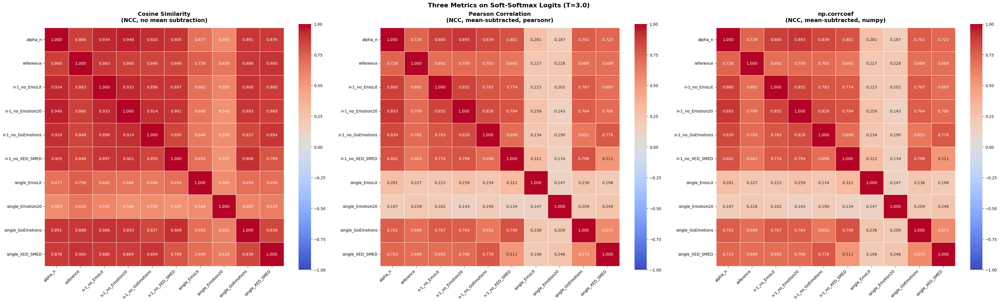

Saved: ncc_all_three_global_T3.0.png


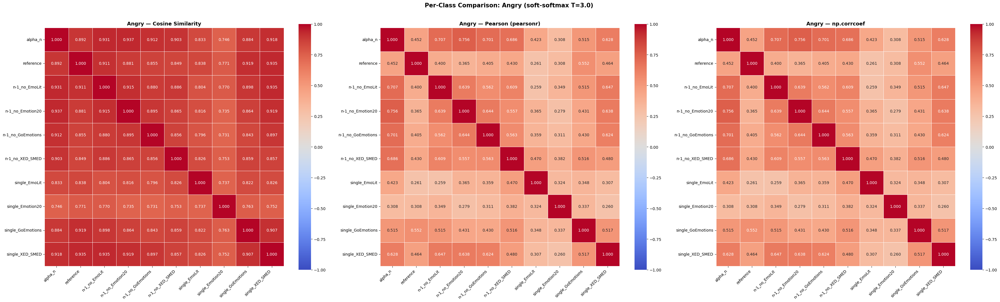

Saved: ncc_perclass_Angry_T3.0.png


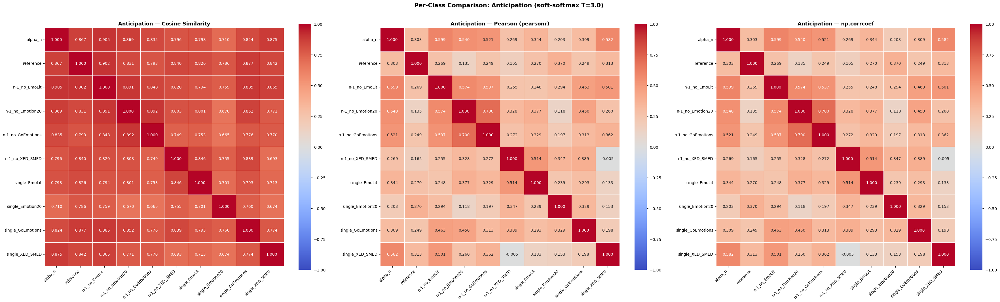

Saved: ncc_perclass_Anticipation_T3.0.png


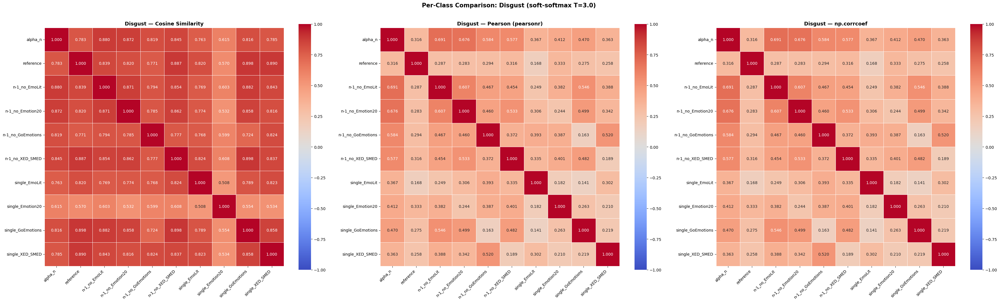

Saved: ncc_perclass_Disgust_T3.0.png


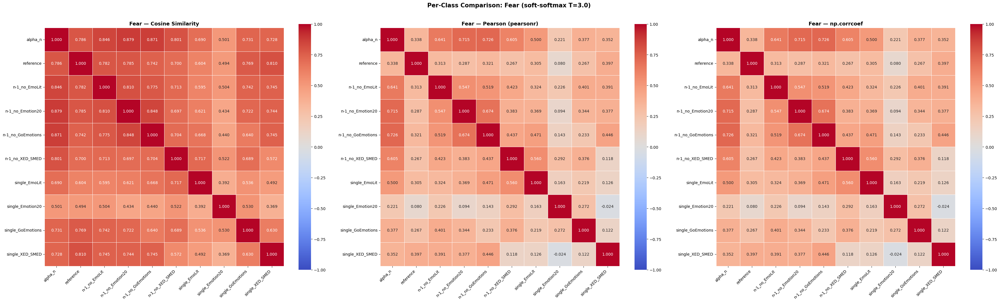

Saved: ncc_perclass_Fear_T3.0.png


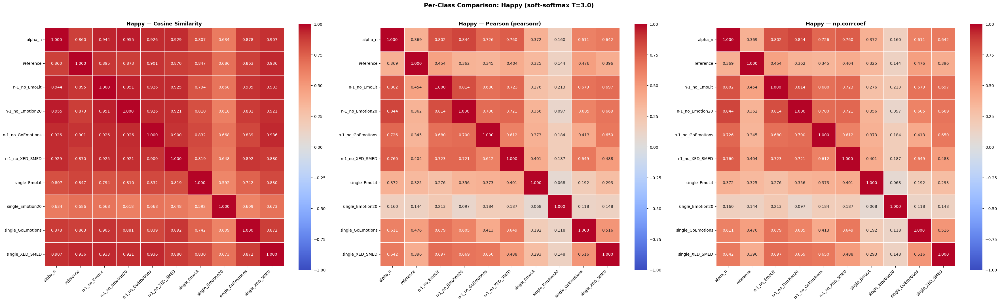

Saved: ncc_perclass_Happy_T3.0.png


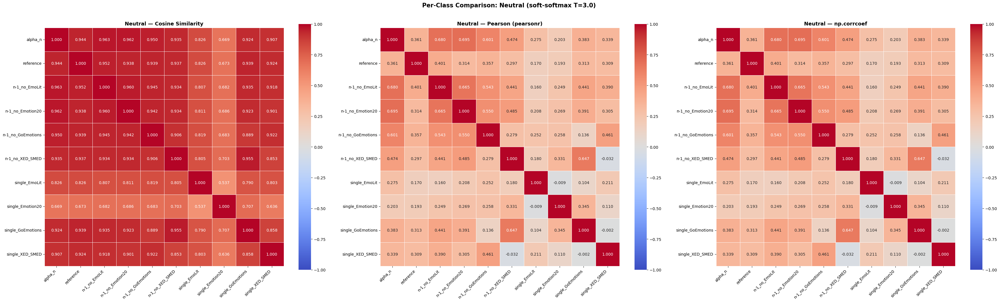

Saved: ncc_perclass_Neutral_T3.0.png


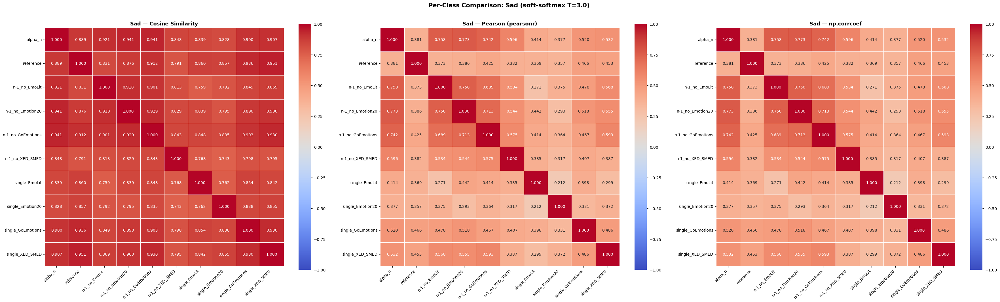

Saved: ncc_perclass_Sad_T3.0.png


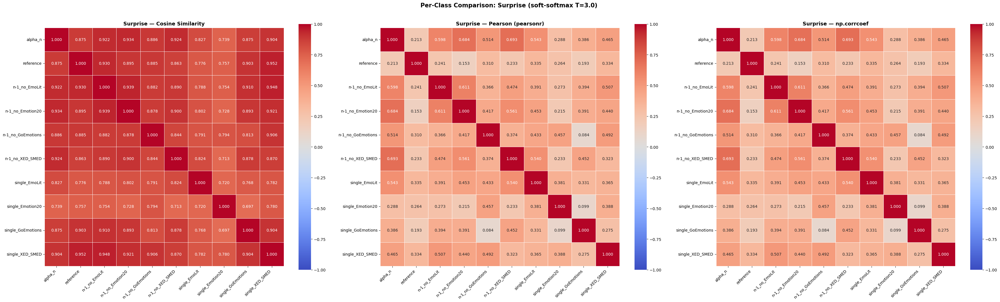

Saved: ncc_perclass_Surprise_T3.0.png


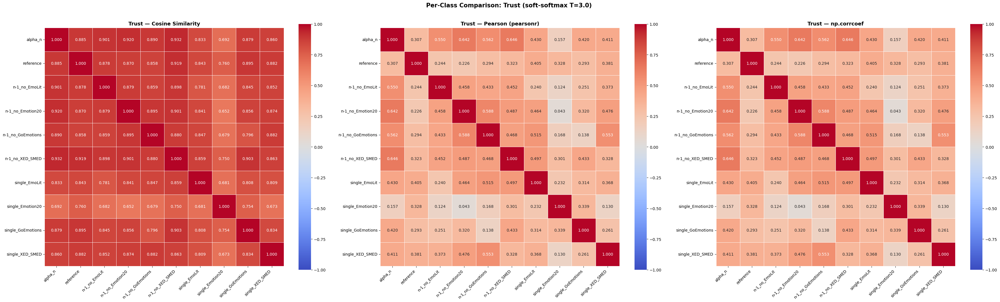

Saved: ncc_perclass_Trust_T3.0.png


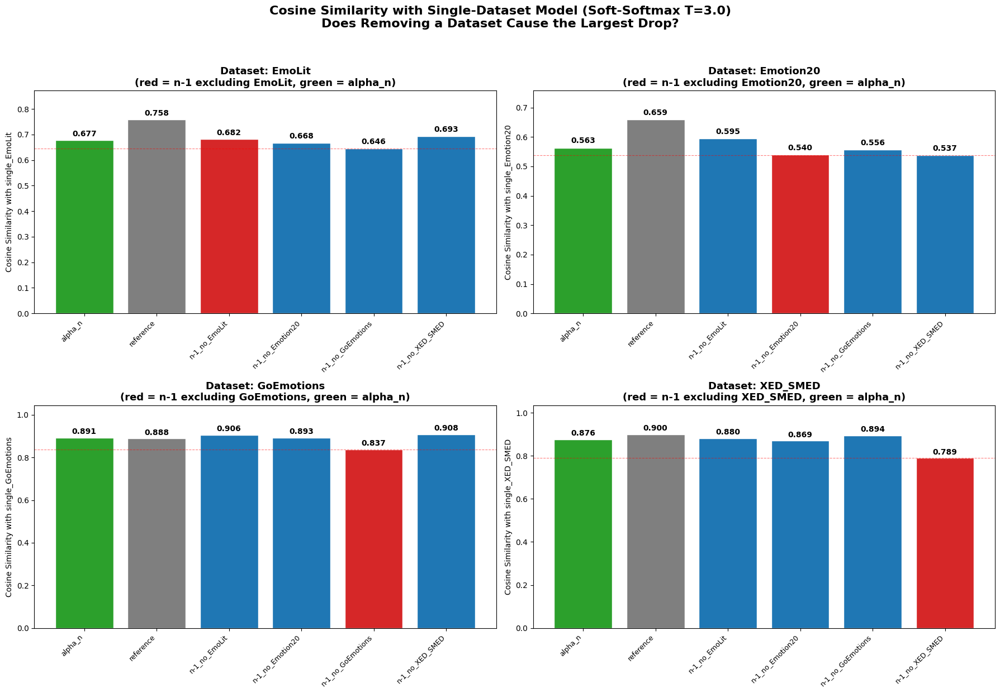

Saved: barplot_Cosine_Similarity_T3.0.png


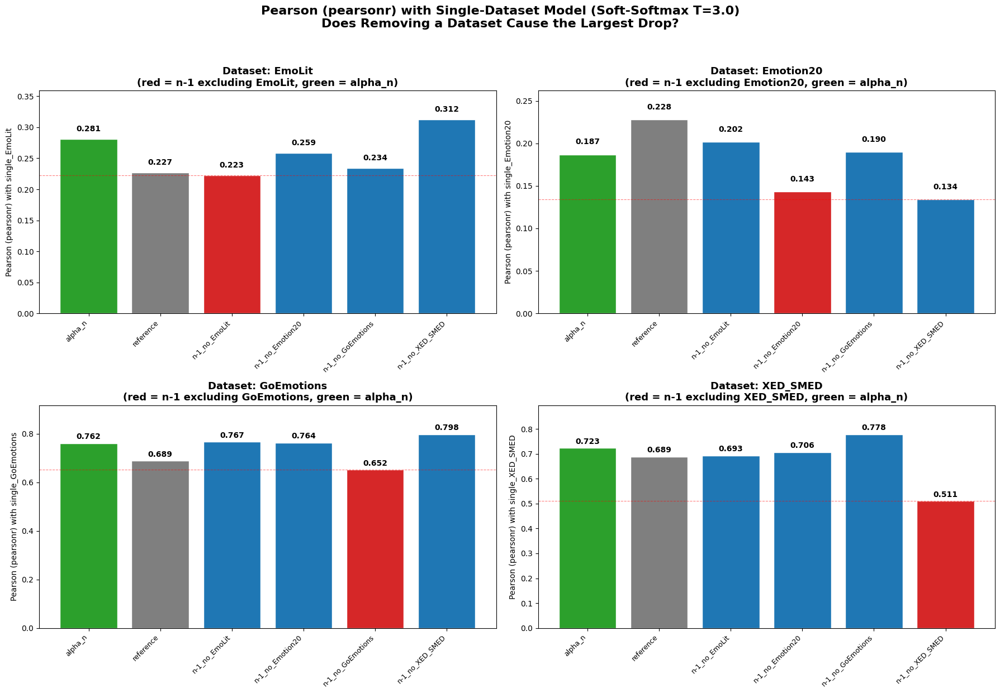

Saved: barplot_Pearson_pearsonr_T3.0.png


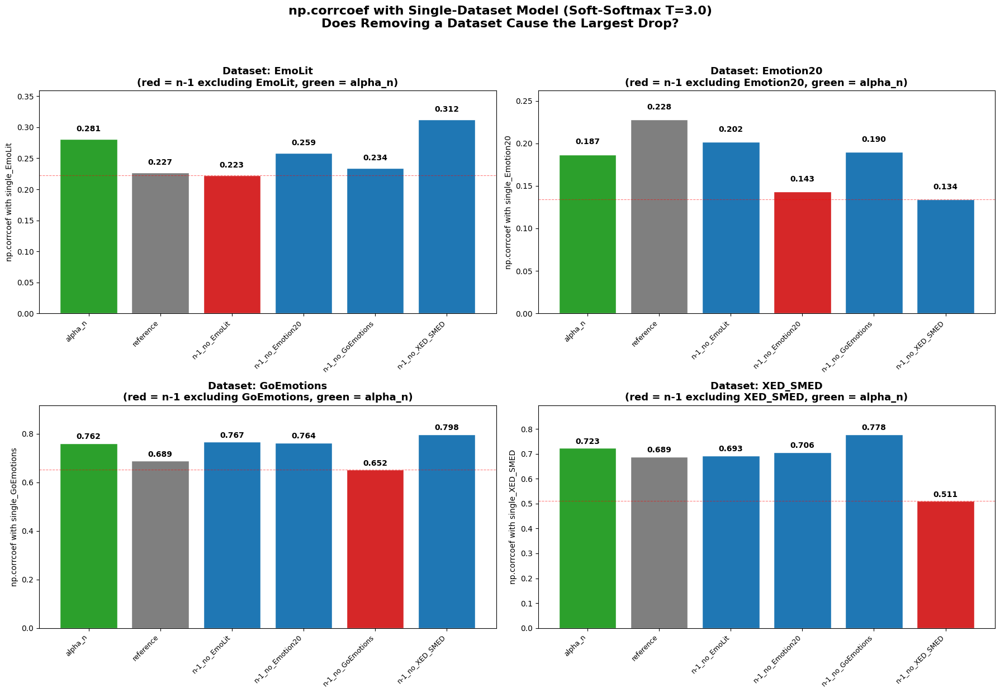

Saved: barplot_npcorrcoef_T3.0.png

Summary: Is n-1_no_X the minimum Cosine Similarity with single_X?
(Soft-Softmax T=3.0, L2-normalized)

  EmoLit (compared to single_EmoLit):
    alpha_n                   0.6773
    reference                 0.7577
    n-1_no_EmoLit             0.6817 ◄──  (EXCLUDED)
    n-1_no_Emotion20          0.6676
    n-1_no_GoEmotions         0.6459 ◄──  (MIN)
    n-1_no_XED_SMED           0.6931
  Hypothesis supported: NO

  Emotion20 (compared to single_Emotion20):
    alpha_n                   0.5632
    reference                 0.6586
    n-1_no_EmoLit             0.5947
    n-1_no_Emotion20          0.5400 ◄──  (EXCLUDED)
    n-1_no_GoEmotions         0.5561
    n-1_no_XED_SMED           0.5370 ◄──  (MIN)
  Hypothesis supported: NO

  GoEmotions (compared to single_GoEmotions):
    alpha_n                   0.8915
    reference                 0.8881
    n-1_no_EmoLit             0.9059
    n-1_no_Emotion20          0.8926
    n-1_no_GoEmotions         0

In [44]:
# ══════════════════════════════════════════════════════════════════════════════
# Normalized Cross-Correlation on Soft-Softmax Logits (T=3.0)
#
# Three metrics computed after applying soft-softmax:
#   1. Cosine Similarity       = Σ(xi·yi) / (||x||·||y||)       [no mean sub.]
#   2. Pearson Correlation      = scipy pearsonr                  [mean-subtracted]
#   3. np.corrcoef              = numpy correlation coefficient   [mean-subtracted]
#
# Pearson and corrcoef should produce identical results (both are NCC with
# mean subtraction). Cosine similarity is NCC without mean subtraction.
# ══════════════════════════════════════════════════════════════════════════════

from scipy.special import softmax as scipy_softmax
from scipy.stats import pearsonr

TEMPERATURE = 3.0

# ── 1. Apply soft softmax to all logit matrices ─────────────────────────────

softmax_matrices = {}
for k in model_keys:
    softmax_matrices[k] = scipy_softmax(logit_matrices[k] / TEMPERATURE, axis=1)
    print(f"  {k}: softmax(T={TEMPERATURE}) applied, "
          f"shape {softmax_matrices[k].shape}, "
          f"row sums ≈ {softmax_matrices[k].sum(axis=1).mean():.4f}")

print(f"\n✓ Soft-softmax (T={TEMPERATURE}) applied to {len(softmax_matrices)} models.")


# ── 2. Flatten, L2-normalize, compute all three metrics ─────────────────────

def l2_normalize(v):
    norm = np.linalg.norm(v)
    return v / norm if norm > 1e-10 else v

flattened_soft = {}
for k in model_keys:
    flattened_soft[k] = l2_normalize(softmax_matrices[k].flatten())

# Metric 1: Cosine Similarity (NCC without mean subtraction)
cosine_matrix = np.zeros((n_models, n_models))
for i, ki in enumerate(model_keys):
    for j, kj in enumerate(model_keys):
        cosine_matrix[i, j] = sklearn_cosine_sim(
            flattened_soft[ki].reshape(1, -1), flattened_soft[kj].reshape(1, -1)
        )[0, 0]

# Metric 2: Pearson Correlation (scipy.stats.pearsonr)
pearson_soft_matrix = np.zeros((n_models, n_models))
for i, ki in enumerate(model_keys):
    for j, kj in enumerate(model_keys):
        pearson_soft_matrix[i, j], _ = pearsonr(flattened_soft[ki], flattened_soft[kj])

# Metric 3: np.corrcoef
corrcoef_matrix = np.zeros((n_models, n_models))
for i, ki in enumerate(model_keys):
    for j, kj in enumerate(model_keys):
        corrcoef_matrix[i, j] = np.corrcoef(flattened_soft[ki], flattened_soft[kj])[0, 1]

# Print all three
cosine_df = pd.DataFrame(cosine_matrix, index=model_keys, columns=model_keys)
pearson_soft_df = pd.DataFrame(pearson_soft_matrix, index=model_keys, columns=model_keys)
corrcoef_df = pd.DataFrame(corrcoef_matrix, index=model_keys, columns=model_keys)

print(f"\n1. Cosine Similarity (NCC no mean sub.), soft-softmax T={TEMPERATURE}:")
print(cosine_df.to_string(float_format="%.4f"))

print(f"\n2. Pearson Correlation (pearsonr), soft-softmax T={TEMPERATURE}:")
print(pearson_soft_df.to_string(float_format="%.4f"))

print(f"\n3. np.corrcoef, soft-softmax T={TEMPERATURE}:")
print(corrcoef_df.to_string(float_format="%.4f"))

# Verify Pearson ≈ corrcoef
max_diff = np.max(np.abs(pearson_soft_matrix - corrcoef_matrix))
print(f"\nMax difference between pearsonr and corrcoef: {max_diff:.2e} (should be ~0)")


# ── 3. Global heatmaps — all three ──────────────────────────────────────────

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(36, 10))

sns.heatmap(cosine_df, annot=True, fmt=".3f", cmap="coolwarm", center=0,
            vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
            square=True, ax=ax1)
ax1.set_title(f"Cosine Similarity\n(NCC, no mean subtraction)",
              fontsize=14, fontweight="bold", pad=15)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha="right")

sns.heatmap(pearson_soft_df, annot=True, fmt=".3f", cmap="coolwarm", center=0,
            vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
            square=True, ax=ax2)
ax2.set_title(f"Pearson Correlation\n(NCC, mean-subtracted, pearsonr)",
              fontsize=14, fontweight="bold", pad=15)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha="right")

sns.heatmap(corrcoef_df, annot=True, fmt=".3f", cmap="coolwarm", center=0,
            vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
            square=True, ax=ax3)
ax3.set_title(f"np.corrcoef\n(NCC, mean-subtracted, numpy)",
              fontsize=14, fontweight="bold", pad=15)
ax3.set_xticklabels(ax3.get_xticklabels(), rotation=45, ha="right")

fig.suptitle(f"Three Metrics on Soft-Softmax Logits (T={TEMPERATURE})",
             fontsize=16, fontweight="bold", y=1.02)
plt.tight_layout()
plt.savefig(f"ncc_all_three_global_T{TEMPERATURE}.png", dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved: ncc_all_three_global_T{TEMPERATURE}.png")


# ── 4. Per-class heatmaps ───────────────────────────────────────────────────

for class_idx, class_name in ID2LABEL.items():
    cos_class = np.zeros((n_models, n_models))
    pear_class = np.zeros((n_models, n_models))
    corr_class = np.zeros((n_models, n_models))

    cols_normed = {}
    for k in model_keys:
        cols_normed[k] = l2_normalize(softmax_matrices[k][:, class_idx])

    for i, ki in enumerate(model_keys):
        for j, kj in enumerate(model_keys):
            cos_class[i, j] = sklearn_cosine_sim(
                cols_normed[ki].reshape(1, -1), cols_normed[kj].reshape(1, -1)
            )[0, 0]
            if np.std(cols_normed[ki]) > 1e-10 and np.std(cols_normed[kj]) > 1e-10:
                pear_class[i, j], _ = pearsonr(cols_normed[ki], cols_normed[kj])
                corr_class[i, j] = np.corrcoef(cols_normed[ki], cols_normed[kj])[0, 1]
            else:
                pear_class[i, j] = 0.0
                corr_class[i, j] = 0.0

    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(36, 10))

    sns.heatmap(pd.DataFrame(cos_class, index=model_keys, columns=model_keys),
                annot=True, fmt=".3f", cmap="coolwarm", center=0,
                vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
                square=True, ax=ax1)
    ax1.set_title(f"{class_name} — Cosine Similarity", fontsize=13, fontweight="bold")
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha="right")

    sns.heatmap(pd.DataFrame(pear_class, index=model_keys, columns=model_keys),
                annot=True, fmt=".3f", cmap="coolwarm", center=0,
                vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
                square=True, ax=ax2)
    ax2.set_title(f"{class_name} — Pearson (pearsonr)", fontsize=13, fontweight="bold")
    ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha="right")

    sns.heatmap(pd.DataFrame(corr_class, index=model_keys, columns=model_keys),
                annot=True, fmt=".3f", cmap="coolwarm", center=0,
                vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
                square=True, ax=ax3)
    ax3.set_title(f"{class_name} — np.corrcoef", fontsize=13, fontweight="bold")
    ax3.set_xticklabels(ax3.get_xticklabels(), rotation=45, ha="right")

    fig.suptitle(f"Per-Class Comparison: {class_name} (soft-softmax T={TEMPERATURE})",
                 fontsize=15, fontweight="bold", y=1.02)
    plt.tight_layout()
    plt.savefig(f"ncc_perclass_{class_name}_T{TEMPERATURE}.png", dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: ncc_perclass_{class_name}_T{TEMPERATURE}.png")


# ── 5. Bar plots: all three metrics with single-dataset model ────────────────

ALL_METRICS = [
    ("Cosine Similarity", cosine_matrix),
    ("Pearson (pearsonr)", pearson_soft_matrix),
    ("np.corrcoef", corrcoef_matrix),
]

for ncc_name, ncc_matrix in ALL_METRICS:
    fig, axes = plt.subplots(2, 2, figsize=(18, 12))

    for ds_idx, (ds_name, n1_key, single_key) in enumerate(zip(DATASET_NAMES, N1_KEYS, SINGLE_KEYS)):
        row, col = divmod(ds_idx, 2)
        ax = axes[row][col]

        if single_key not in model_keys:
            ax.set_title(f"{ds_name} — single model not available")
            continue

        single_idx = model_keys.index(single_key)
        bar_models = ["alpha_n", "reference"] + N1_KEYS

        bar_labels = []
        bar_values = []
        bar_colors = []

        for bm in bar_models:
            if bm not in model_keys:
                continue
            bm_idx = model_keys.index(bm)
            corr = ncc_matrix[single_idx, bm_idx]
            bar_labels.append(bm)
            bar_values.append(corr)

            if bm == n1_key:
                bar_colors.append("#d62728")
            elif bm == "reference":
                bar_colors.append("#7f7f7f")
            elif bm == "alpha_n":
                bar_colors.append("#2ca02c")
            else:
                bar_colors.append("#1f77b4")

        bars = ax.bar(range(len(bar_labels)), bar_values, color=bar_colors, edgecolor="white")

        for bar_obj, val in zip(bars, bar_values):
            ax.text(bar_obj.get_x() + bar_obj.get_width() / 2, bar_obj.get_height() + 0.01,
                    f"{val:.3f}", ha="center", va="bottom", fontsize=10, fontweight="bold")

        ax.set_xticks(range(len(bar_labels)))
        ax.set_xticklabels(bar_labels, rotation=45, ha="right", fontsize=9)
        ax.set_ylabel(f"{ncc_name} with {single_key}", fontsize=10)
        ax.set_title(f"Dataset: {ds_name}\n(red = n-1 excluding {ds_name}, green = alpha_n)",
                     fontsize=13, fontweight="bold")
        ax.set_ylim(0, max(bar_values) * 1.15)

        # Dashed red line at minimum N-1 correlation
        n1_vals = [v for v, l in zip(bar_values, bar_labels) if l in N1_KEYS]
        if n1_vals:
            ax.axhline(y=min(n1_vals), color="red", linestyle="--", linewidth=0.8, alpha=0.5)

    fig.suptitle(f"{ncc_name} with Single-Dataset Model (Soft-Softmax T={TEMPERATURE})\n"
                 f"Does Removing a Dataset Cause the Largest Drop?",
                 fontsize=16, fontweight="bold", y=1.03)
    plt.tight_layout()
    safe_name = ncc_name.replace(" ", "_").replace("(", "").replace(")", "").replace(".", "")
    plt.savefig(f"barplot_{safe_name}_T{TEMPERATURE}.png", dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: barplot_{safe_name}_T{TEMPERATURE}.png")


# ── 6. Summary tables ───────────────────────────────────────────────────────

for ncc_name, ncc_matrix in ALL_METRICS:
    print("\n" + "=" * 70)
    print(f"Summary: Is n-1_no_X the minimum {ncc_name} with single_X?")
    print(f"(Soft-Softmax T={TEMPERATURE}, L2-normalized)")
    print("=" * 70)

    for ds_name, n1_key, single_key in zip(DATASET_NAMES, N1_KEYS, SINGLE_KEYS):
        if single_key not in model_keys:
            print(f"\n  {ds_name}: single model not available")
            continue

        single_idx = model_keys.index(single_key)

        compare_models = ["alpha_n", "reference"] + N1_KEYS
        all_corrs = {}
        for bm in compare_models:
            if bm in model_keys:
                bm_idx = model_keys.index(bm)
                all_corrs[bm] = ncc_matrix[single_idx, bm_idx]

        n1_corrs = {k: v for k, v in all_corrs.items() if k in N1_KEYS}
        min_model = min(n1_corrs, key=n1_corrs.get)
        is_minimum = (min_model == n1_key)

        print(f"\n  {ds_name} (compared to {single_key}):")
        for bm, corr in all_corrs.items():
            tags = []
            if bm == n1_key:
                tags.append("EXCLUDED")
            if bm in N1_KEYS and bm == min_model:
                tags.append("MIN")
            tag_str = f"  ({', '.join(tags)})" if tags else ""
            marker = " ◄──" if tags else ""
            print(f"    {bm:<25} {corr:.4f}{marker}{tag_str}")
        print(f"  Hypothesis supported: {'YES' if is_minimum else 'NO'}")


## LOGITS Class-Level Logit Diagnostic: a_1 vs a_n\\1 per Emotion

Same structure as the BEE class-level diagnostic, but using **raw logit matrices** instead of BEE scores:
- **a_1(i)** = logit column from single-dataset model i
- **a_n\\1(j)** = alpha_n logit column − N-1(j) logit column (dataset j's contribution in logit space)

Computed with all three metrics: Cosine Similarity, Pearson, and np.corrcoef.
Diagonal dominance means a dataset's single-model logit fingerprint matches its leave-one-out contribution.

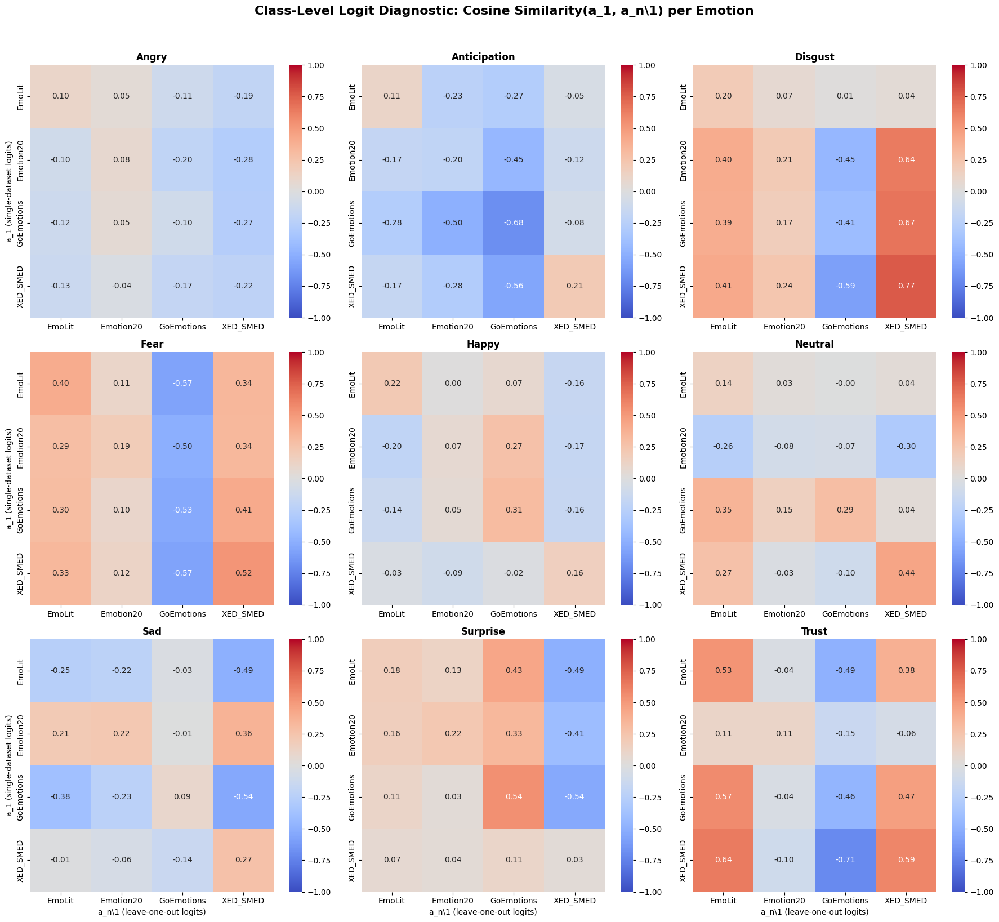

Saved: logit_class_diagnostic_Cosine_Similarity.png

CLASS           |  DIAG MEAN |  OFF-DIAG MEAN |  DOMINANT?
------------------------------------------------------------
Angry           |    -0.0351 |        -0.1265 |        YES
Anticipation    |    -0.1396 |        -0.2631 |        YES
Disgust         |     0.1921 |         0.1683 |        YES
Fear            |     0.1431 |         0.0574 |        YES
Happy           |     0.1883 |        -0.0481 |        YES
Neutral         |     0.1972 |         0.0094 |        YES
Sad             |     0.0815 |        -0.1289 |        YES
Surprise        |     0.2438 |        -0.0020 |        YES
Trust           |     0.1921 |         0.0480 |        YES
------------------------------------------------------------
GLOBAL          |     0.1182 |        -0.0317 |        YES



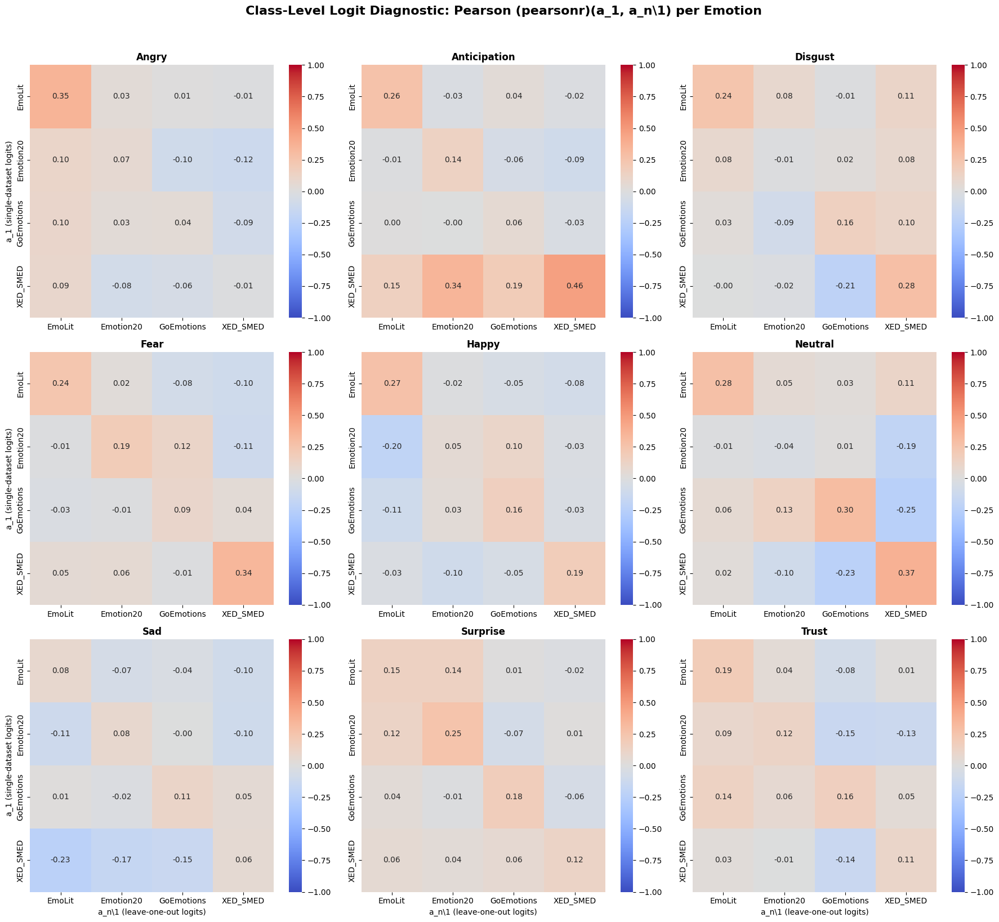

Saved: logit_class_diagnostic_Pearson_pearsonr.png

CLASS           |  DIAG MEAN |  OFF-DIAG MEAN |  DOMINANT?
------------------------------------------------------------
Angry           |     0.1132 |        -0.0084 |        YES
Anticipation    |     0.2291 |         0.0391 |        YES
Disgust         |     0.1681 |         0.0133 |        YES
Fear            |     0.2160 |        -0.0058 |        YES
Happy           |     0.1679 |        -0.0453 |        YES
Neutral         |     0.2267 |        -0.0302 |        YES
Sad             |     0.0834 |        -0.0774 |        YES
Surprise        |     0.1755 |         0.0263 |        YES
Trust           |     0.1440 |        -0.0076 |        YES
------------------------------------------------------------
GLOBAL          |     0.1693 |        -0.0107 |        YES



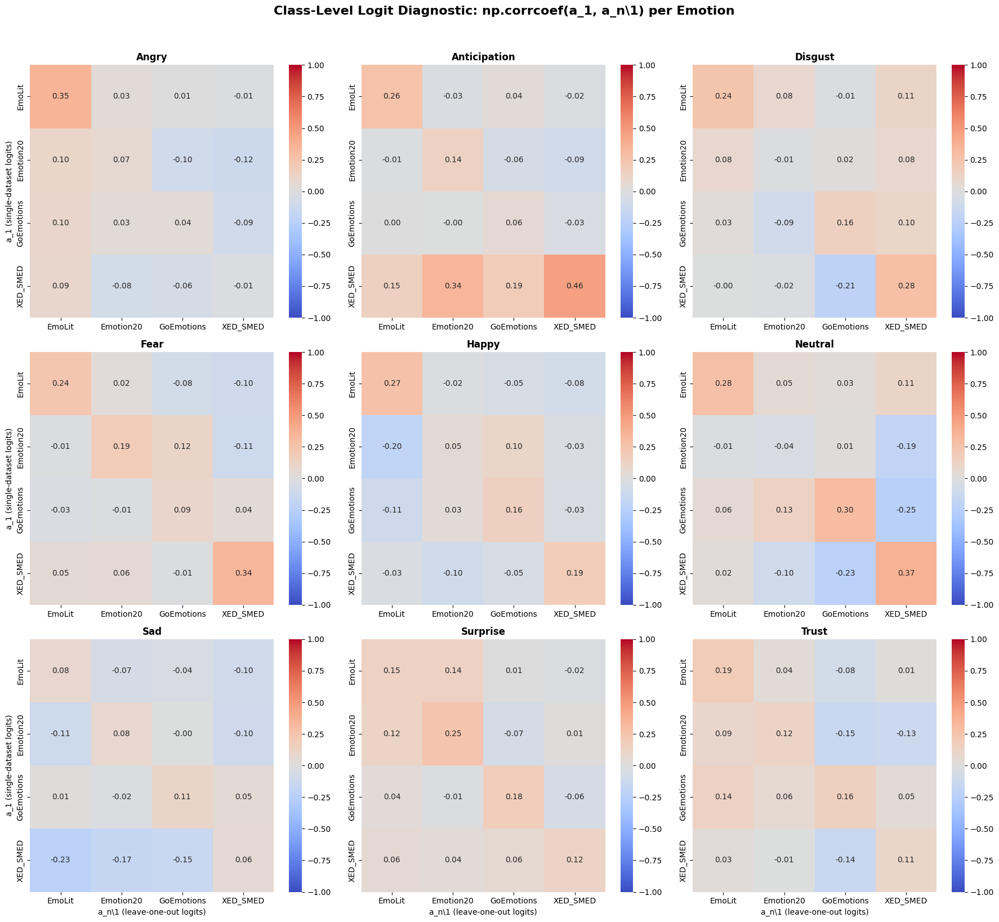

Saved: logit_class_diagnostic_npcorrcoef.png

CLASS           |  DIAG MEAN |  OFF-DIAG MEAN |  DOMINANT?
------------------------------------------------------------
Angry           |     0.1132 |        -0.0084 |        YES
Anticipation    |     0.2291 |         0.0391 |        YES
Disgust         |     0.1681 |         0.0133 |        YES
Fear            |     0.2160 |        -0.0058 |        YES
Happy           |     0.1679 |        -0.0453 |        YES
Neutral         |     0.2267 |        -0.0302 |        YES
Sad             |     0.0834 |        -0.0774 |        YES
Surprise        |     0.1755 |         0.0263 |        YES
Trust           |     0.1440 |        -0.0076 |        YES
------------------------------------------------------------
GLOBAL          |     0.1693 |        -0.0107 |        YES



In [45]:
# ══════════════════════════════════════════════════════════════════════════════
# Class-Level Logit Diagnostic (one 4×4 matrix per emotion)
#
# Same structure as the BEE class-level diagnostic, but using logit matrices:
#   a_1(i)   = logit column from single-dataset model i
#   a_n\1(j) = alpha_n logit column − N-1(j) logit column
#            = contribution of dataset j in logit space
#
# Computed with: Cosine Similarity, Pearson, and np.corrcoef
# Diagonal should dominate if single-dataset fingerprint matches its
# leave-one-out contribution.
# ══════════════════════════════════════════════════════════════════════════════

alpha_n_logits = logit_matrices["alpha_n"]  # [535, 9]

# ── Compute for all three metrics ────────────────────────────────────────────

METRIC_FUNCS = {
    "Cosine Similarity": lambda x, y: sklearn_cosine_sim(x.reshape(1, -1), y.reshape(1, -1))[0, 0],
    "Pearson (pearsonr)": lambda x, y: pearsonr(x, y)[0] if np.std(x) > 1e-10 and np.std(y) > 1e-10 else 0.0,
    "np.corrcoef": lambda x, y: np.corrcoef(x, y)[0, 1] if np.std(x) > 1e-10 and np.std(y) > 1e-10 else 0.0,
}

for metric_name, metric_fn in METRIC_FUNCS.items():
    class_diagnostics_logit = {}

    for class_idx, class_name in ID2LABEL.items():
        D_class = np.zeros((4, 4))
        for i, name_i in enumerate(DATASET_NAMES):
            for j, name_j in enumerate(DATASET_NAMES):
                # a_1: logit column for this class from single-dataset model i
                vec_1 = logit_matrices[SINGLE_KEYS[i]][:, class_idx]
                # a_n\1: alpha_n logit column minus N-1(j) logit column
                vec_n1 = alpha_n_logits[:, class_idx] - logit_matrices[N1_KEYS[j]][:, class_idx]

                if np.linalg.norm(vec_1) < 1e-10 or np.linalg.norm(vec_n1) < 1e-10:
                    D_class[i, j] = 0.0
                else:
                    D_class[i, j] = metric_fn(vec_1, vec_n1)

        class_diagnostics_logit[class_name] = D_class

    # ── Visualize ────────────────────────────────────────────────────────────
    fig, axes = plt.subplots(3, 3, figsize=(18, 16))
    for idx, (class_name, D_class) in enumerate(class_diagnostics_logit.items()):
        row, col = divmod(idx, 3)
        ax = axes[row][col]
        sns.heatmap(D_class, annot=True, fmt=".2f", cmap="coolwarm",
                    center=0, vmin=-1, vmax=1,
                    xticklabels=DATASET_NAMES, yticklabels=DATASET_NAMES, ax=ax)
        ax.set_title(class_name, fontsize=12, fontweight='bold')
        ax.set_ylabel("a_1 (single-dataset logits)" if col == 0 else "", fontsize=10)
        ax.set_xlabel("a_n\\1 (leave-one-out logits)" if row == 2 else "", fontsize=10)

    # Hide unused subplots
    for idx in range(len(class_diagnostics_logit), axes.size):
        row, col = divmod(idx, 3)
        axes[row][col].set_visible(False)

    fig.suptitle(f"Class-Level Logit Diagnostic: {metric_name}(a_1, a_n\\1) per Emotion",
                 fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    safe_name = metric_name.replace(" ", "_").replace("(", "").replace(")", "").replace(".", "")
    plt.savefig(f"logit_class_diagnostic_{safe_name}.png", dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: logit_class_diagnostic_{safe_name}.png")

    # ── Diagonal dominance summary ───────────────────────────────────────────
    print(f"\n{'CLASS':<15} | {'DIAG MEAN':>10} | {'OFF-DIAG MEAN':>14} | {'DOMINANT?':>10}")
    print("-" * 60)
    all_diag, all_offdiag = [], []
    for class_name, D_class in class_diagnostics_logit.items():
        diag = np.diag(D_class)
        mask = ~np.eye(4, dtype=bool)
        offdiag = D_class[mask]
        diag_mean = np.mean(diag)
        offdiag_mean = np.mean(offdiag)
        dominant = diag_mean > offdiag_mean
        all_diag.extend(diag)
        all_offdiag.extend(offdiag)
        print(f"{class_name:<15} | {diag_mean:>10.4f} | {offdiag_mean:>14.4f} | {'YES' if dominant else 'NO':>10}")

    print("-" * 60)
    print(f"{'GLOBAL':<15} | {np.mean(all_diag):>10.4f} | {np.mean(all_offdiag):>14.4f} | "
          f"{'YES' if np.mean(all_diag) > np.mean(all_offdiag) else 'NO':>10}")
    print()


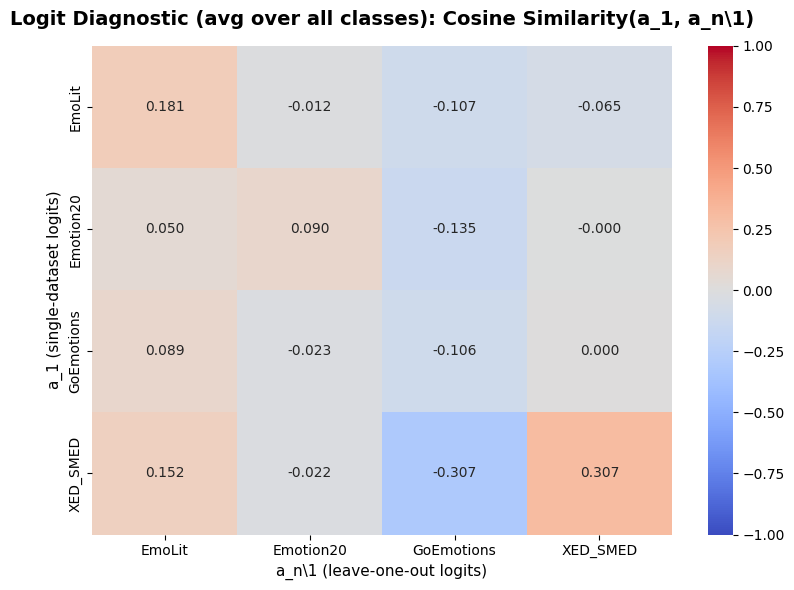

Saved: logit_class_diagnostic_avg_Cosine_Similarity.png

  Cosine Similarity — Averaged across all classes:
  Diagonal mean:     0.1182
  Off-diagonal mean: -0.0317
  Diagonal dominant: YES



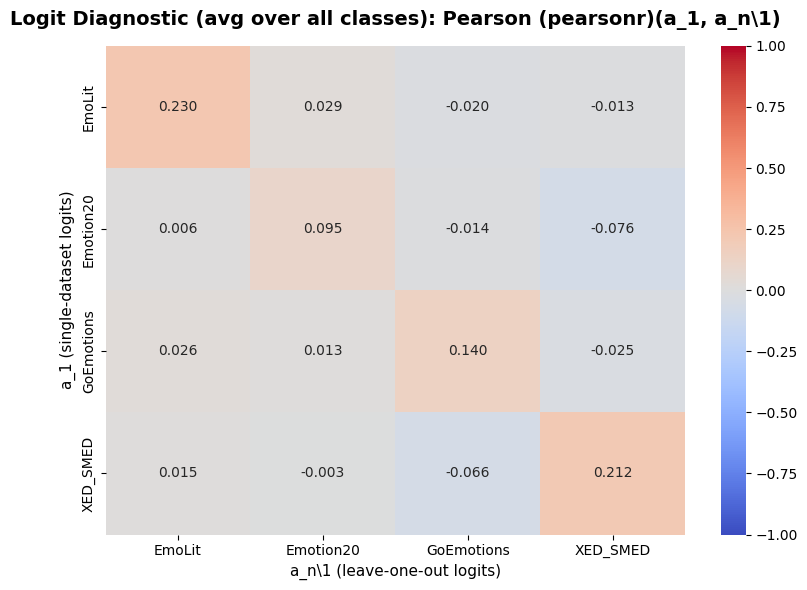

Saved: logit_class_diagnostic_avg_Pearson_pearsonr.png

  Pearson (pearsonr) — Averaged across all classes:
  Diagonal mean:     0.1693
  Off-diagonal mean: -0.0107
  Diagonal dominant: YES



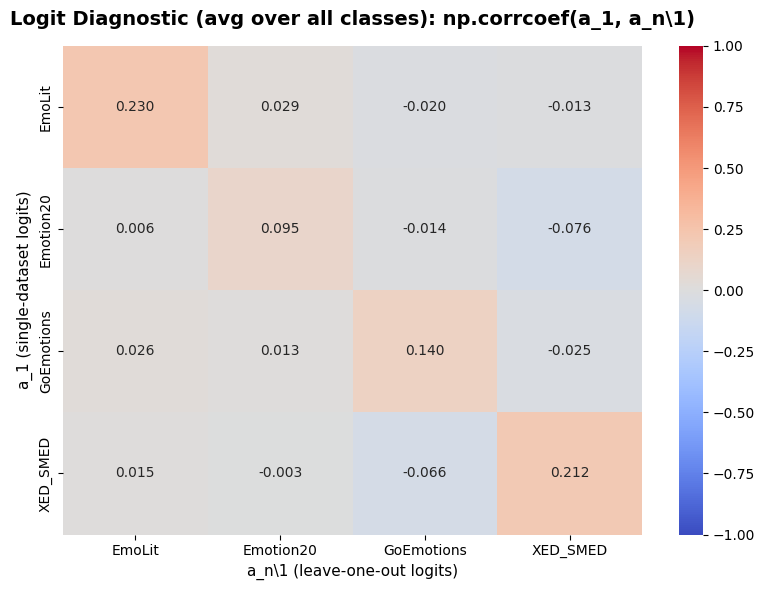

Saved: logit_class_diagnostic_avg_npcorrcoef.png

  np.corrcoef — Averaged across all classes:
  Diagonal mean:     0.1693
  Off-diagonal mean: -0.0107
  Diagonal dominant: YES



In [46]:
for metric_name, metric_fn in METRIC_FUNCS.items():
    class_diagnostics_logit = {}

    for class_idx, class_name in ID2LABEL.items():
        D_class = np.zeros((4, 4))
        for i, name_i in enumerate(DATASET_NAMES):
            for j, name_j in enumerate(DATASET_NAMES):
                vec_1 = logit_matrices[SINGLE_KEYS[i]][:, class_idx]
                vec_n1 = alpha_n_logits[:, class_idx] - logit_matrices[N1_KEYS[j]][:, class_idx]

                if np.linalg.norm(vec_1) < 1e-10 or np.linalg.norm(vec_n1) < 1e-10:
                    D_class[i, j] = 0.0
                else:
                    D_class[i, j] = metric_fn(vec_1, vec_n1)

        class_diagnostics_logit[class_name] = D_class

    # ── Average across all classes into a single 4×4 matrix ──────────────────
    avg_matrix = np.mean(list(class_diagnostics_logit.values()), axis=0)

    fig, ax = plt.subplots(figsize=(8, 6))
    sns.heatmap(avg_matrix, annot=True, fmt=".3f", cmap="coolwarm",
                center=0, vmin=-1, vmax=1,
                xticklabels=DATASET_NAMES, yticklabels=DATASET_NAMES, ax=ax)
    ax.set_ylabel("a_1 (single-dataset logits)", fontsize=11)
    ax.set_xlabel("a_n\\1 (leave-one-out logits)", fontsize=11)
    ax.set_title(f"Logit Diagnostic (avg over all classes): {metric_name}(a_1, a_n\\1)",
                 fontsize=14, fontweight='bold', pad=15)
    plt.tight_layout()
    safe_name = metric_name.replace(" ", "_").replace("(", "").replace(")", "").replace(".", "")
    plt.savefig(f"logit_class_diagnostic_avg_{safe_name}.png", dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: logit_class_diagnostic_avg_{safe_name}.png")

    # ── Diagonal dominance summary ───────────────────────────────────────────
    diag = np.diag(avg_matrix)
    offdiag = avg_matrix[~np.eye(4, dtype=bool)]
    print(f"\n  {metric_name} — Averaged across all classes:")
    print(f"  Diagonal mean:     {np.mean(diag):.4f}")
    print(f"  Off-diagonal mean: {np.mean(offdiag):.4f}")
    print(f"  Diagonal dominant: {'YES' if np.mean(diag) > np.mean(offdiag) else 'NO'}")
    print()

## Class-Level Logit Diagnostic — Normalized before Subtraction

Same diagnostic as above, but **soft-softmax (T=3.0) is applied to each model's logit matrix before subtraction**.
This puts all models into a comparable probability space [0,1] before computing:
- **a_1(i)** = soft-softmax column from single-dataset model i
- **a_n\\1(j)** = soft-softmax(alpha_n) − soft-softmax(N-1_j)

This avoids the scale mismatch problem of subtracting raw logits from different models.

Soft-softmax (T=3.0) applied to all logit matrices before subtraction.
  Shape: (535, 9), row sums ≈ 1.0000


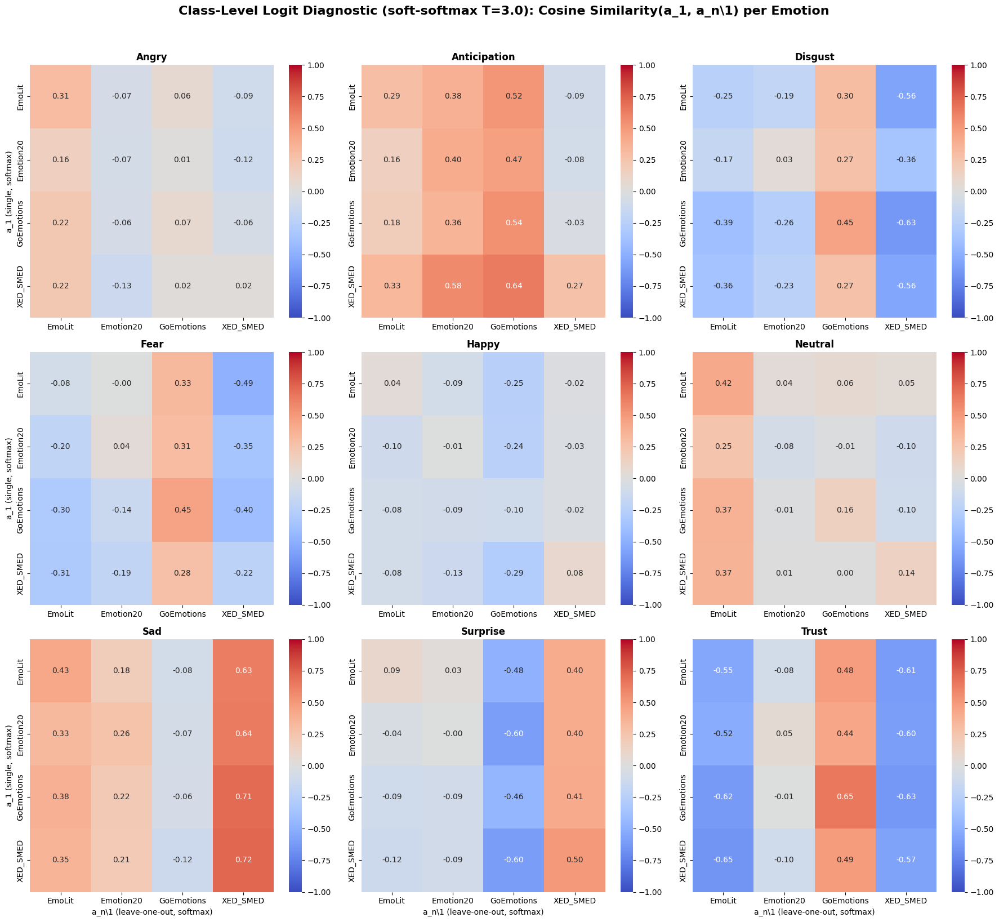

Saved: logit_class_diagnostic_softmax_Cosine_Similarity.png

  Cosine Similarity — Diagonal Dominance (soft-softmax T=3.0):
  CLASS           |  DIAG MEAN |  OFF-DIAG MEAN |  DOMINANT?
  ----------------------------------------------------------
  Angry           |     0.0825 |         0.0141 |        YES
  Anticipation    |     0.3769 |         0.2834 |        YES
  Disgust         |    -0.0802 |        -0.1929 |        YES
  Fear            |     0.0448 |        -0.1220 |        YES
  Happy           |     0.0044 |        -0.1180 |        YES
  Neutral         |     0.1597 |         0.0765 |        YES
  Sad             |     0.3378 |         0.2808 |        YES
  Surprise        |     0.0318 |        -0.0723 |        YES
  Trust           |    -0.1063 |        -0.2016 |        YES
  ----------------------------------------------------------
  GLOBAL          |     0.0946 |        -0.0058 |        YES



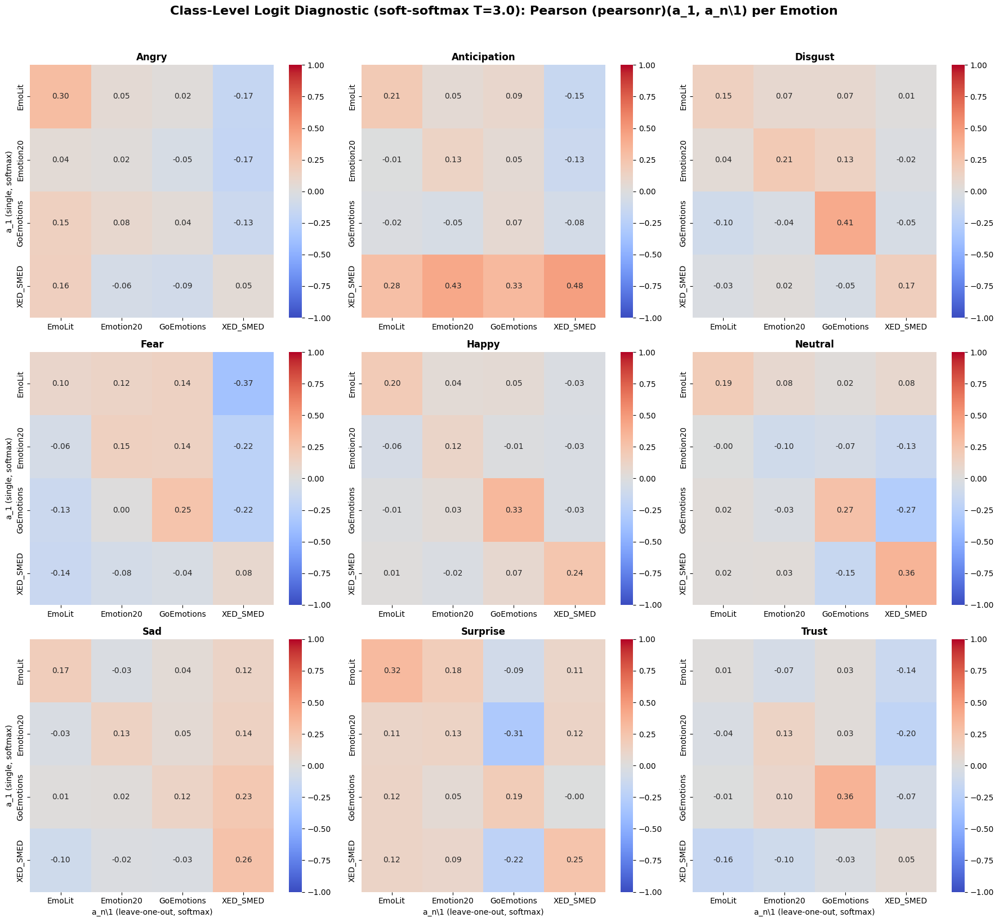

Saved: logit_class_diagnostic_softmax_Pearson_pearsonr.png

  Pearson (pearsonr) — Diagonal Dominance (soft-softmax T=3.0):
  CLASS           |  DIAG MEAN |  OFF-DIAG MEAN |  DOMINANT?
  ----------------------------------------------------------
  Angry           |     0.1013 |        -0.0140 |        YES
  Anticipation    |     0.2193 |         0.0658 |        YES
  Disgust         |     0.2347 |         0.0061 |        YES
  Fear            |     0.1456 |        -0.0714 |        YES
  Happy           |     0.2220 |         0.0008 |        YES
  Neutral         |     0.1802 |        -0.0337 |        YES
  Sad             |     0.1720 |         0.0331 |        YES
  Surprise        |     0.2232 |         0.0235 |        YES
  Trust           |     0.1391 |        -0.0543 |        YES
  ----------------------------------------------------------
  GLOBAL          |     0.1819 |        -0.0049 |        YES



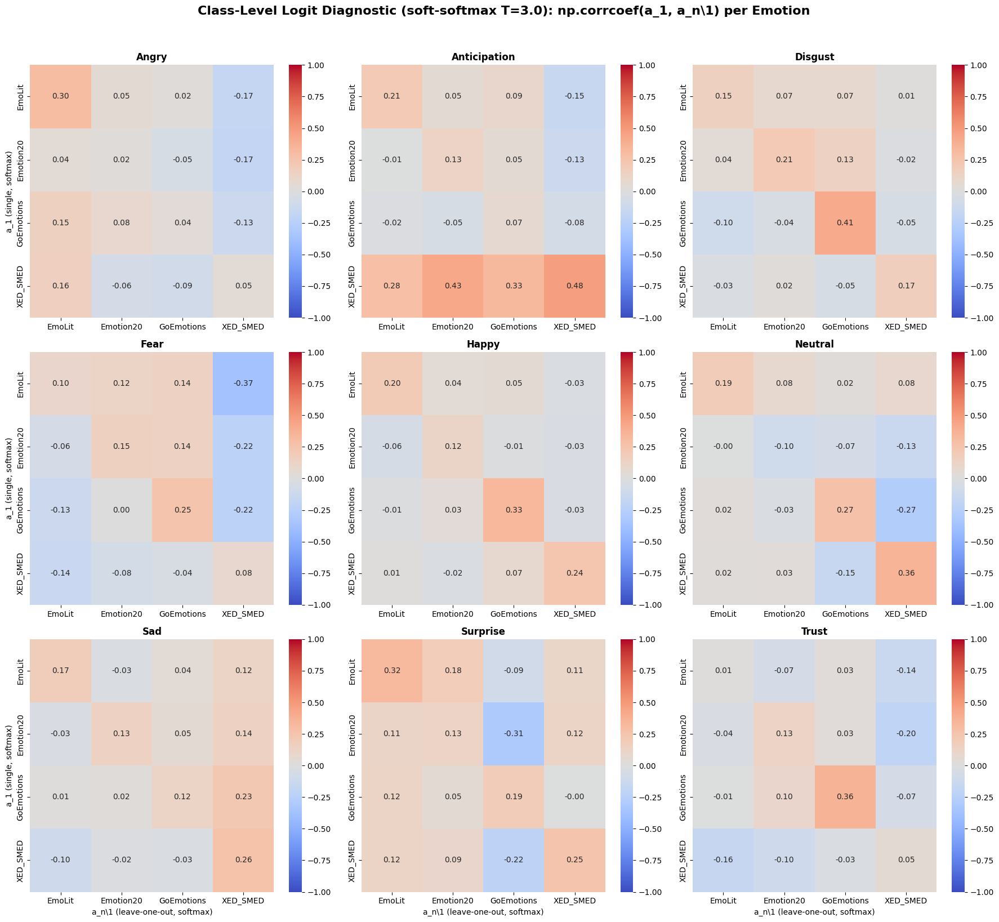

Saved: logit_class_diagnostic_softmax_npcorrcoef.png

  np.corrcoef — Diagonal Dominance (soft-softmax T=3.0):
  CLASS           |  DIAG MEAN |  OFF-DIAG MEAN |  DOMINANT?
  ----------------------------------------------------------
  Angry           |     0.1013 |        -0.0140 |        YES
  Anticipation    |     0.2193 |         0.0658 |        YES
  Disgust         |     0.2347 |         0.0061 |        YES
  Fear            |     0.1456 |        -0.0714 |        YES
  Happy           |     0.2220 |         0.0008 |        YES
  Neutral         |     0.1802 |        -0.0337 |        YES
  Sad             |     0.1720 |         0.0331 |        YES
  Surprise        |     0.2232 |         0.0235 |        YES
  Trust           |     0.1391 |        -0.0543 |        YES
  ----------------------------------------------------------
  GLOBAL          |     0.1819 |        -0.0049 |        YES



In [47]:
# ══════════════════════════════════════════════════════════════════════════════
# Class-Level Logit Diagnostic — Normalized before Subtraction
#
# Same structure as before, but apply soft-softmax (T=3.0) to each model's
# logit matrix BEFORE computing the subtraction a_n\1 = alpha_n − N-1.
# This puts all models into a comparable probability space before taking
# differences, avoiding scale mismatch between models.
# ══════════════════════════════════════════════════════════════════════════════

from scipy.special import softmax as scipy_softmax

TEMPERATURE = 3.0

# ── 1. Normalize all logit matrices with soft-softmax ────────────────────────

softmax_logits = {}
for k in logit_matrices:
    softmax_logits[k] = scipy_softmax(logit_matrices[k] / TEMPERATURE, axis=1)

alpha_n_soft = softmax_logits["alpha_n"]
print(f"Soft-softmax (T={TEMPERATURE}) applied to all logit matrices before subtraction.")
print(f"  Shape: {alpha_n_soft.shape}, row sums ≈ {alpha_n_soft.sum(axis=1).mean():.4f}")


# ── 2. Compute class-level diagnostic with all three metrics ─────────────────

METRIC_FUNCS = {
    "Cosine Similarity": lambda x, y: sklearn_cosine_sim(x.reshape(1, -1), y.reshape(1, -1))[0, 0],
    "Pearson (pearsonr)": lambda x, y: pearsonr(x, y)[0] if np.std(x) > 1e-10 and np.std(y) > 1e-10 else 0.0,
    "np.corrcoef": lambda x, y: np.corrcoef(x, y)[0, 1] if np.std(x) > 1e-10 and np.std(y) > 1e-10 else 0.0,
}

for metric_name, metric_fn in METRIC_FUNCS.items():
    class_diagnostics_norm = {}

    for class_idx, class_name in ID2LABEL.items():
        D_class = np.zeros((4, 4))
        for i, name_i in enumerate(DATASET_NAMES):
            for j, name_j in enumerate(DATASET_NAMES):
                # a_1: soft-softmax column for this class from single-dataset model i
                vec_1 = softmax_logits[SINGLE_KEYS[i]][:, class_idx]
                # a_n\1: alpha_n soft-softmax column minus N-1(j) soft-softmax column
                vec_n1 = alpha_n_soft[:, class_idx] - softmax_logits[N1_KEYS[j]][:, class_idx]

                if np.linalg.norm(vec_1) < 1e-10 or np.linalg.norm(vec_n1) < 1e-10:
                    D_class[i, j] = 0.0
                else:
                    D_class[i, j] = metric_fn(vec_1, vec_n1)

        class_diagnostics_norm[class_name] = D_class

    # ── Visualize ────────────────────────────────────────────────────────────
    fig, axes = plt.subplots(3, 3, figsize=(18, 16))
    for idx, (class_name, D_class) in enumerate(class_diagnostics_norm.items()):
        row, col = divmod(idx, 3)
        ax = axes[row][col]
        sns.heatmap(D_class, annot=True, fmt=".2f", cmap="coolwarm",
                    center=0, vmin=-1, vmax=1,
                    xticklabels=DATASET_NAMES, yticklabels=DATASET_NAMES, ax=ax)
        ax.set_title(class_name, fontsize=12, fontweight='bold')
        ax.set_ylabel("a_1 (single, softmax)" if col == 0 else "", fontsize=10)
        ax.set_xlabel("a_n\\1 (leave-one-out, softmax)" if row == 2 else "", fontsize=10)

    for idx in range(len(class_diagnostics_norm), axes.size):
        row, col = divmod(idx, 3)
        axes[row][col].set_visible(False)

    fig.suptitle(f"Class-Level Logit Diagnostic (soft-softmax T={TEMPERATURE}): "
                 f"{metric_name}(a_1, a_n\\1) per Emotion",
                 fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    safe_name = metric_name.replace(" ", "_").replace("(", "").replace(")", "").replace(".", "")
    plt.savefig(f"logit_class_diagnostic_softmax_{safe_name}.png", dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: logit_class_diagnostic_softmax_{safe_name}.png")

    # ── Diagonal dominance summary ───────────────────────────────────────────
    print(f"\n  {metric_name} — Diagonal Dominance (soft-softmax T={TEMPERATURE}):")
    print(f"  {'CLASS':<15} | {'DIAG MEAN':>10} | {'OFF-DIAG MEAN':>14} | {'DOMINANT?':>10}")
    print("  " + "-" * 58)
    all_diag, all_offdiag = [], []
    for class_name, D_class in class_diagnostics_norm.items():
        diag = np.diag(D_class)
        mask = ~np.eye(4, dtype=bool)
        offdiag = D_class[mask]
        diag_mean = np.mean(diag)
        offdiag_mean = np.mean(offdiag)
        dominant = diag_mean > offdiag_mean
        all_diag.extend(diag)
        all_offdiag.extend(offdiag)
        print(f"  {class_name:<15} | {diag_mean:>10.4f} | {offdiag_mean:>14.4f} | {'YES' if dominant else 'NO':>10}")

    print("  " + "-" * 58)
    print(f"  {'GLOBAL':<15} | {np.mean(all_diag):>10.4f} | {np.mean(all_offdiag):>14.4f} | "
          f"{'YES' if np.mean(all_diag) > np.mean(all_offdiag) else 'NO':>10}")
    print()


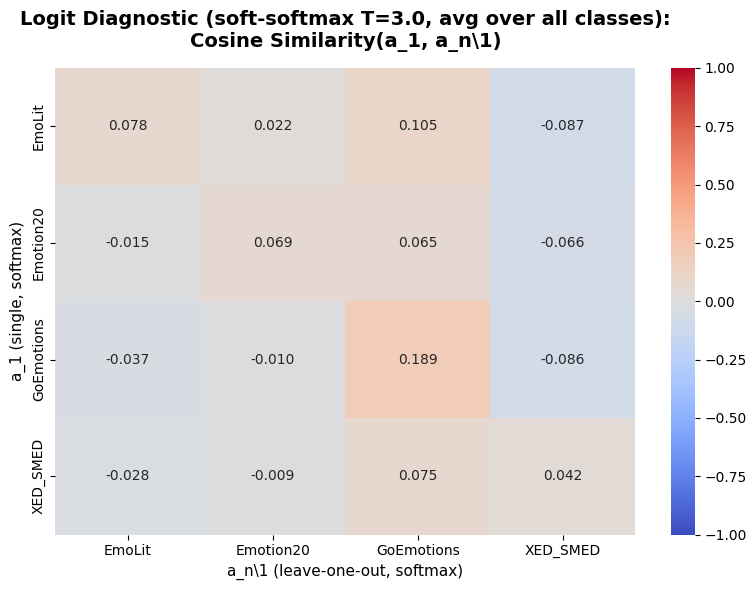

Saved: logit_class_diagnostic_softmax_avg_Cosine_Similarity.png

  Cosine Similarity — Averaged across all classes (soft-softmax T=3.0):
  Diagonal mean:     0.0946
  Off-diagonal mean: -0.0058
  Diagonal dominant: YES



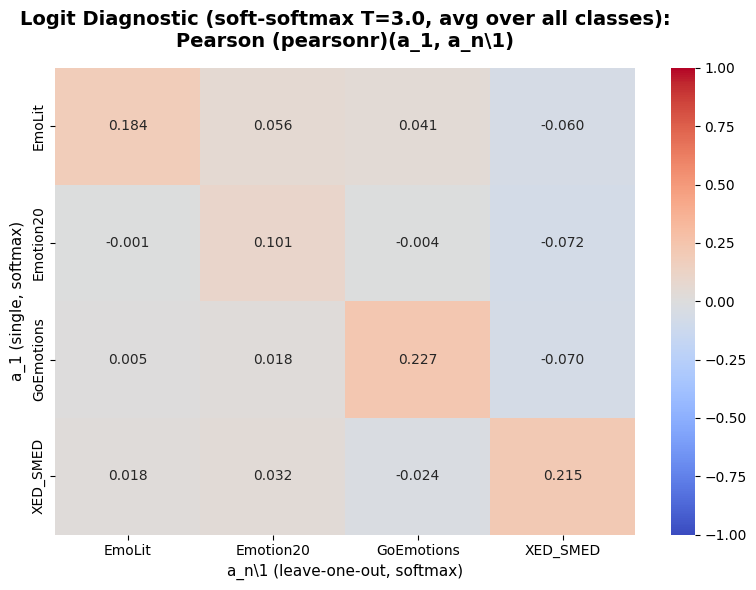

Saved: logit_class_diagnostic_softmax_avg_Pearson_pearsonr.png

  Pearson (pearsonr) — Averaged across all classes (soft-softmax T=3.0):
  Diagonal mean:     0.1819
  Off-diagonal mean: -0.0049
  Diagonal dominant: YES



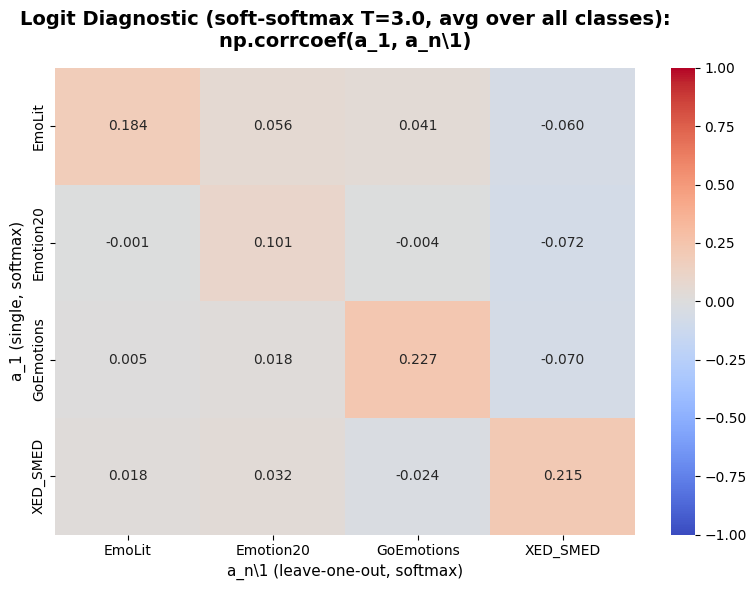

Saved: logit_class_diagnostic_softmax_avg_npcorrcoef.png

  np.corrcoef — Averaged across all classes (soft-softmax T=3.0):
  Diagonal mean:     0.1819
  Off-diagonal mean: -0.0049
  Diagonal dominant: YES



In [48]:
for metric_name, metric_fn in METRIC_FUNCS.items():
    class_diagnostics_norm = {}

    for class_idx, class_name in ID2LABEL.items():
        D_class = np.zeros((4, 4))
        for i, name_i in enumerate(DATASET_NAMES):
            for j, name_j in enumerate(DATASET_NAMES):
                vec_1 = softmax_logits[SINGLE_KEYS[i]][:, class_idx]
                vec_n1 = alpha_n_soft[:, class_idx] - softmax_logits[N1_KEYS[j]][:, class_idx]

                if np.linalg.norm(vec_1) < 1e-10 or np.linalg.norm(vec_n1) < 1e-10:
                    D_class[i, j] = 0.0
                else:
                    D_class[i, j] = metric_fn(vec_1, vec_n1)

        class_diagnostics_norm[class_name] = D_class

    # ── Average across all classes into a single 4×4 matrix ──────────────────
    avg_matrix = np.mean(list(class_diagnostics_norm.values()), axis=0)

    fig, ax = plt.subplots(figsize=(8, 6))
    sns.heatmap(avg_matrix, annot=True, fmt=".3f", cmap="coolwarm",
                center=0, vmin=-1, vmax=1,
                xticklabels=DATASET_NAMES, yticklabels=DATASET_NAMES, ax=ax)
    ax.set_ylabel("a_1 (single, softmax)", fontsize=11)
    ax.set_xlabel("a_n\\1 (leave-one-out, softmax)", fontsize=11)
    ax.set_title(f"Logit Diagnostic (soft-softmax T={TEMPERATURE}, avg over all classes):\n"
                 f"{metric_name}(a_1, a_n\\1)",
                 fontsize=14, fontweight='bold', pad=15)
    plt.tight_layout()
    safe_name = metric_name.replace(" ", "_").replace("(", "").replace(")", "").replace(".", "")
    plt.savefig(f"logit_class_diagnostic_softmax_avg_{safe_name}.png", dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: logit_class_diagnostic_softmax_avg_{safe_name}.png")

    # ── Diagonal dominance summary ───────────────────────────────────────────
    diag = np.diag(avg_matrix)
    offdiag = avg_matrix[~np.eye(4, dtype=bool)]
    print(f"\n  {metric_name} — Averaged across all classes (soft-softmax T={TEMPERATURE}):")
    print(f"  Diagonal mean:     {np.mean(diag):.4f}")
    print(f"  Off-diagonal mean: {np.mean(offdiag):.4f}")
    print(f"  Diagonal dominant: {'YES' if np.mean(diag) > np.mean(offdiag) else 'NO'}")
    print()

## Logit Comparison: Keywords + 500 Random Keyword Pairs
**bold text**
Expand the input set from 535 individual keywords to **535 keywords + 500 random pairs**.
Pass all through each model, collect logits, and compare pairwise.

This tests whether the similarity structure is robust to richer inputs,
or whether single keywords alone capture the full picture.

Original keywords: 535
Random pairs: 500
Total expanded inputs: 1035
  Example pairs: ['boss Friday', 'ive happen', 'girl crowd', 'beauty annoyed', 'star Guy']
Computing expanded logit matrix for: alpha_n


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (1035, 9)
Computing expanded logit matrix for: reference


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (1035, 9)
Computing expanded logit matrix for: n-1_no_EmoLit


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (1035, 9)
Computing expanded logit matrix for: n-1_no_Emotion20


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (1035, 9)
Computing expanded logit matrix for: n-1_no_GoEmotions


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (1035, 9)
Computing expanded logit matrix for: n-1_no_XED_SMED


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (1035, 9)
Computing expanded logit matrix for: single_EmoLit


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (1035, 9)
Computing expanded logit matrix for: single_Emotion20


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (1035, 9)
Computing expanded logit matrix for: single_GoEmotions


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (1035, 9)
Computing expanded logit matrix for: single_XED_SMED


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (1035, 9)

✓ Expanded logit matrices computed for 10 models.


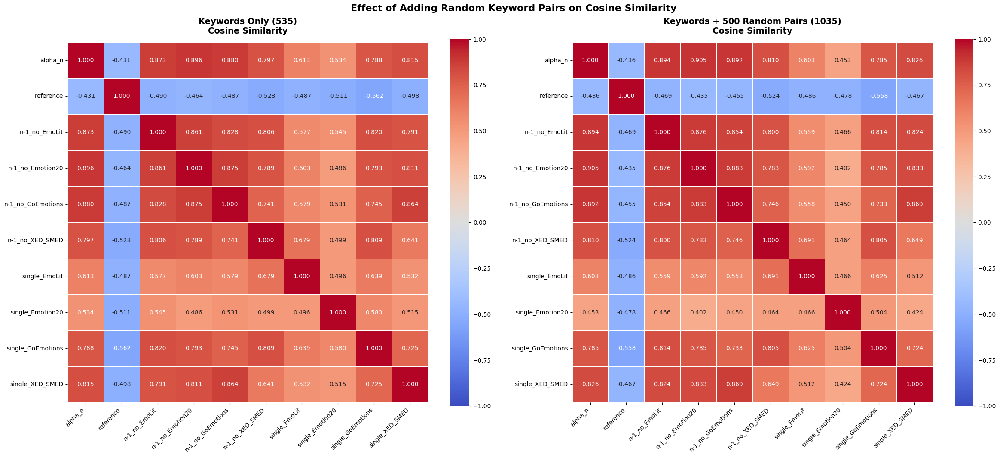

Saved: logit_expanded_vs_original_cosine.png


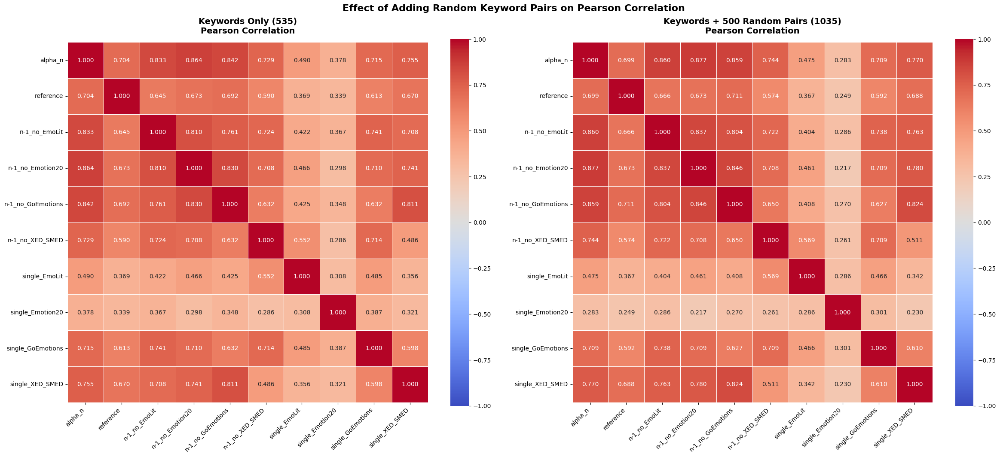

Saved: logit_expanded_vs_original_pearson.png

Difference (Expanded − Original):
  Cosine:  mean=-0.0070, max=0.0911
  Pearson: mean=-0.0078, max=0.0955

  Correlation of pairwise similarities (orig vs expanded):
    Cosine matrices:  r = 0.9978
    Pearson matrices: r = 0.9926


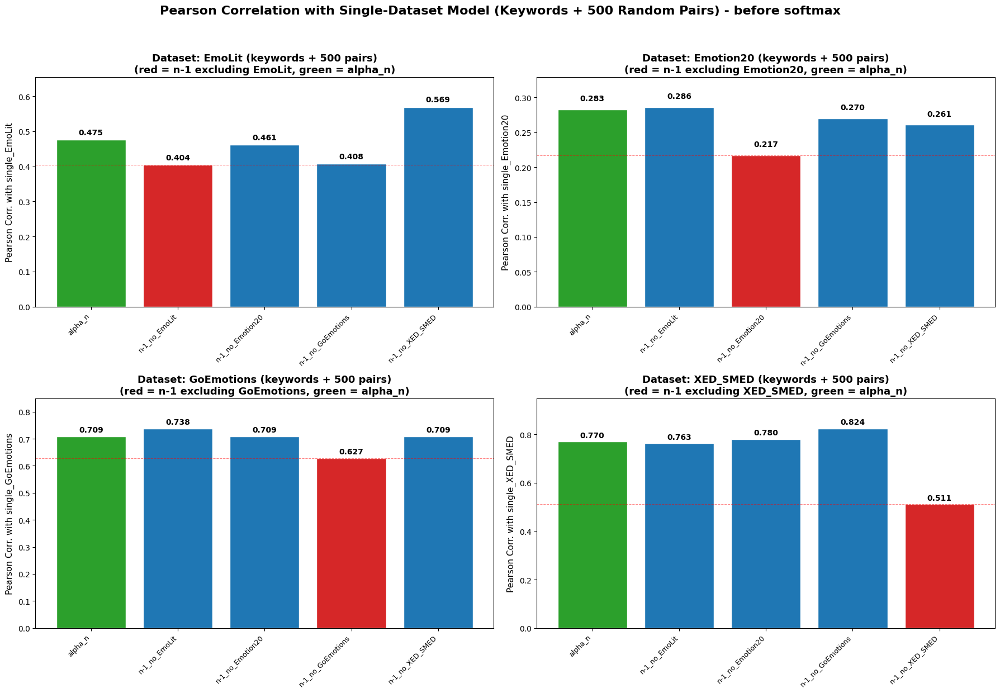

Saved: logit_barplot_expanded_500pairs.png

Summary: Keywords + 500 pairs — Is n-1_no_X the minimum?

  EmoLit (compared to single_EmoLit):
    alpha_n                   0.4753
    reference                 0.3668
    n-1_no_EmoLit             0.4041 ◄──  (EXCLUDED, MIN)
    n-1_no_Emotion20          0.4609
    n-1_no_GoEmotions         0.4077
    n-1_no_XED_SMED           0.5689
  Hypothesis supported: YES

  Emotion20 (compared to single_Emotion20):
    alpha_n                   0.2828
    reference                 0.2492
    n-1_no_EmoLit             0.2862
    n-1_no_Emotion20          0.2174 ◄──  (EXCLUDED, MIN)
    n-1_no_GoEmotions         0.2701
    n-1_no_XED_SMED           0.2609
  Hypothesis supported: YES

  GoEmotions (compared to single_GoEmotions):
    alpha_n                   0.7090
    reference                 0.5921
    n-1_no_EmoLit             0.7379
    n-1_no_Emotion20          0.7088
    n-1_no_GoEmotions         0.6274 ◄──  (EXCLUDED, MIN)
    n-1_no_XED_SMED 

In [55]:
# ══════════════════════════════════════════════════════════════════════════════
# Logit-Based Matrix Comparison — Keywords + Random Keyword Pairs
#
# Expand the input set: 535 union keywords + 500 random pairs of keywords.
# Pass all through each model, collect logits, flatten, L2-normalize,
# and compare pairwise. Then compare these results with the keyword-only
# logit matrices to see if adding pairs changes the similarity structure.
# ══════════════════════════════════════════════════════════════════════════════

import random
random.seed(SEED)

# ── 1. Generate 500 random keyword pairs ─────────────────────────────────────

N_PAIRS = 500
keyword_pairs = []
pair_set = set()  # avoid duplicates

while len(keyword_pairs) < N_PAIRS:
    kw1, kw2 = random.sample(all_keywords_union, 2)
    pair = f"{kw1} {kw2}"
    reverse_pair = f"{kw2} {kw1}"
    if pair not in pair_set and reverse_pair not in pair_set:
        pair_set.add(pair)
        keyword_pairs.append(pair)

expanded_inputs = all_keywords_union + keyword_pairs
print(f"Original keywords: {len(all_keywords_union)}")
print(f"Random pairs: {len(keyword_pairs)}")
print(f"Total expanded inputs: {len(expanded_inputs)}")
print(f"  Example pairs: {keyword_pairs[:5]}")


# ── 2. Compute expanded logit matrices for all models ────────────────────────

logit_matrices_expanded = {}
for config_key in ALL_KEYS:
    model_path = MODEL_PATHS.get(config_key)
    if model_path is None or not os.path.isdir(model_path):
        print(f"  SKIP {config_key}: model not found")
        continue
    print(f"Computing expanded logit matrix for: {config_key}")
    logit_matrices_expanded[config_key] = compute_logit_matrix(model_path, expanded_inputs)
    print(f"  Shape: {logit_matrices_expanded[config_key].shape}")

print(f"\n✓ Expanded logit matrices computed for {len(logit_matrices_expanded)} models.")


# ── 3. Flatten, L2-normalize, pairwise comparison ───────────────────────────

model_keys_exp = list(logit_matrices_expanded.keys())
n_models_exp = len(model_keys_exp)

flattened_exp = {}
for k in model_keys_exp:
    flattened_exp[k] = l2_normalize(logit_matrices_expanded[k].flatten())

# Cosine similarity
cos_sim_exp = np.zeros((n_models_exp, n_models_exp))
for i, ki in enumerate(model_keys_exp):
    for j, kj in enumerate(model_keys_exp):
        cos_sim_exp[i, j] = sklearn_cosine_sim(
            flattened_exp[ki].reshape(1, -1), flattened_exp[kj].reshape(1, -1)
        )[0, 0]

# Pearson correlation
pearson_exp = np.zeros((n_models_exp, n_models_exp))
for i, ki in enumerate(model_keys_exp):
    for j, kj in enumerate(model_keys_exp):
        pearson_exp[i, j], _ = pearsonr(flattened_exp[ki], flattened_exp[kj])

cos_exp_df = pd.DataFrame(cos_sim_exp, index=model_keys_exp, columns=model_keys_exp)
pear_exp_df = pd.DataFrame(pearson_exp, index=model_keys_exp, columns=model_keys_exp)


# ── 4. Visualize: Expanded vs Original side by side ─────────────────────────

# Cosine similarity comparison
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 10))

sns.heatmap(cos_df, annot=True, fmt=".3f", cmap="coolwarm", center=0,
            vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
            square=True, ax=ax1)
ax1.set_title("Keywords Only (535)\nCosine Similarity",
              fontsize=14, fontweight="bold", pad=15)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha="right")

sns.heatmap(cos_exp_df, annot=True, fmt=".3f", cmap="coolwarm", center=0,
            vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
            square=True, ax=ax2)
ax2.set_title(f"Keywords + {N_PAIRS} Random Pairs ({len(expanded_inputs)})\nCosine Similarity",
              fontsize=14, fontweight="bold", pad=15)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha="right")

fig.suptitle("Effect of Adding Random Keyword Pairs on Cosine Similarity",
             fontsize=16, fontweight="bold", y=1.02)
plt.tight_layout()
plt.savefig("logit_expanded_vs_original_cosine.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved: logit_expanded_vs_original_cosine.png")

# Pearson correlation comparison
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 10))

sns.heatmap(pear_df, annot=True, fmt=".3f", cmap="coolwarm", center=0,
            vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
            square=True, ax=ax1)
ax1.set_title("Keywords Only (535)\nPearson Correlation",
              fontsize=14, fontweight="bold", pad=15)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha="right")

sns.heatmap(pear_exp_df, annot=True, fmt=".3f", cmap="coolwarm", center=0,
            vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
            square=True, ax=ax2)
ax2.set_title(f"Keywords + {N_PAIRS} Random Pairs ({len(expanded_inputs)})\nPearson Correlation",
              fontsize=14, fontweight="bold", pad=15)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha="right")

fig.suptitle("Effect of Adding Random Keyword Pairs on Pearson Correlation",
             fontsize=16, fontweight="bold", y=1.02)
plt.tight_layout()
plt.savefig("logit_expanded_vs_original_pearson.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved: logit_expanded_vs_original_pearson.png")


# ── 5. Quantify the difference ──────────────────────────────────────────────

# Ensure same model order for comparison
common_keys = [k for k in model_keys if k in model_keys_exp]
common_idx_orig = [model_keys.index(k) for k in common_keys]
common_idx_exp = [model_keys_exp.index(k) for k in common_keys]

cos_orig_sub = cos_sim_matrix[np.ix_(common_idx_orig, common_idx_orig)]
cos_exp_sub = cos_sim_exp[np.ix_(common_idx_exp, common_idx_exp)]
pear_orig_sub = pearson_matrix[np.ix_(common_idx_orig, common_idx_orig)]
pear_exp_sub = pearson_exp[np.ix_(common_idx_exp, common_idx_exp)]

# Difference matrices
cos_diff = cos_exp_sub - cos_orig_sub
pear_diff = pear_exp_sub - pear_orig_sub

print(f"\nDifference (Expanded − Original):")
print(f"  Cosine:  mean={np.mean(cos_diff):.4f}, max={np.max(np.abs(cos_diff)):.4f}")
print(f"  Pearson: mean={np.mean(pear_diff):.4f}, max={np.max(np.abs(pear_diff)):.4f}")

# Correlation between original and expanded matrices (upper triangle)
mask = np.triu(np.ones_like(cos_orig_sub, dtype=bool), k=1)
cos_corr, _ = pearsonr(cos_orig_sub[mask], cos_exp_sub[mask])
pear_corr, _ = pearsonr(pear_orig_sub[mask], pear_exp_sub[mask])
print(f"\n  Correlation of pairwise similarities (orig vs expanded):")
print(f"    Cosine matrices:  r = {cos_corr:.4f}")
print(f"    Pearson matrices: r = {pear_corr:.4f}")


# ── 6. Bar plots with expanded inputs ───────────────────────────────────────

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

for ds_idx, (ds_name, n1_key, single_key) in enumerate(zip(DATASET_NAMES, N1_KEYS, SINGLE_KEYS)):
    row, col = divmod(ds_idx, 2)
    ax = axes[row][col]

    if single_key not in model_keys_exp:
        ax.set_title(f"{ds_name} — single model not available")
        continue

    single_idx = model_keys_exp.index(single_key)
    # bar_models = ["alpha_n", "reference"] + N1_KEYS
    bar_models = ["alpha_n"] + N1_KEYS

    bar_labels = []
    bar_values = []
    bar_colors = []

    for bm in bar_models:
        if bm not in model_keys_exp:
            continue
        bm_idx = model_keys_exp.index(bm)
        corr = pearson_exp[single_idx, bm_idx]
        bar_labels.append(bm)
        bar_values.append(corr)

        if bm == n1_key:
            bar_colors.append("#d62728")
        elif bm == "reference":
            bar_colors.append("#7f7f7f")
        elif bm == "alpha_n":
            bar_colors.append("#2ca02c")
        else:
            bar_colors.append("#1f77b4")

    bars = ax.bar(range(len(bar_labels)), bar_values, color=bar_colors, edgecolor="white")

    for bar_obj, val in zip(bars, bar_values):
        ax.text(bar_obj.get_x() + bar_obj.get_width() / 2, bar_obj.get_height() + 0.01,
                f"{val:.3f}", ha="center", va="bottom", fontsize=10, fontweight="bold")

    ax.set_xticks(range(len(bar_labels)))
    ax.set_xticklabels(bar_labels, rotation=45, ha="right", fontsize=9)
    ax.set_ylabel(f"Pearson Corr. with {single_key}", fontsize=11)
    ax.set_title(f"Dataset: {ds_name} (keywords + {N_PAIRS} pairs)\n"
                 f"(red = n-1 excluding {ds_name}, green = alpha_n)",
                 fontsize=13, fontweight="bold")
    ax.set_ylim(0, max(bar_values) * 1.15)

    n1_vals = [v for v, l in zip(bar_values, bar_labels) if l in N1_KEYS]
    if n1_vals:
        ax.axhline(y=min(n1_vals), color="red", linestyle="--", linewidth=0.8, alpha=0.5)

fig.suptitle(f"Pearson Correlation with Single-Dataset Model (Keywords + {N_PAIRS} Random Pairs) - before softmax",
             fontsize=16, fontweight="bold", y=1.03)
plt.tight_layout()
plt.savefig(f"logit_barplot_expanded_{N_PAIRS}pairs.png", dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved: logit_barplot_expanded_{N_PAIRS}pairs.png")


# ── 7. Summary table ────────────────────────────────────────────────────────

print("\n" + "=" * 70)
print(f"Summary: Keywords + {N_PAIRS} pairs — Is n-1_no_X the minimum?")
print("=" * 70)

for ds_name, n1_key, single_key in zip(DATASET_NAMES, N1_KEYS, SINGLE_KEYS):
    if single_key not in model_keys_exp:
        print(f"\n  {ds_name}: single model not available")
        continue

    single_idx = model_keys_exp.index(single_key)

    compare_models = ["alpha_n", "reference"] + N1_KEYS
    all_corrs = {}
    for bm in compare_models:
        if bm in model_keys_exp:
            bm_idx = model_keys_exp.index(bm)
            all_corrs[bm] = pearson_exp[single_idx, bm_idx]

    n1_corrs = {k: v for k, v in all_corrs.items() if k in N1_KEYS}
    min_model = min(n1_corrs, key=n1_corrs.get)
    is_minimum = (min_model == n1_key)

    print(f"\n  {ds_name} (compared to {single_key}):")
    for bm, corr in all_corrs.items():
        tags = []
        if bm == n1_key:
            tags.append("EXCLUDED")
        if bm in N1_KEYS and bm == min_model:
            tags.append("MIN")
        tag_str = f"  ({', '.join(tags)})" if tags else ""
        marker = " ◄──" if tags else ""
        print(f"    {bm:<25} {corr:.4f}{marker}{tag_str}")
    print(f"  Hypothesis supported: {'YES' if is_minimum else 'NO'}")


## Soft-Softmax Comparison: Keywords + 500 Random Keyword Pairs

Apply soft-softmax (T=3.0) to the expanded logit matrices (535 keywords + 500 pairs),
then compare side-by-side with the keyword-only soft-softmax results.

Soft-softmax (T=3.0) applied to expanded logit matrices.
  Shape: (1035, 9)


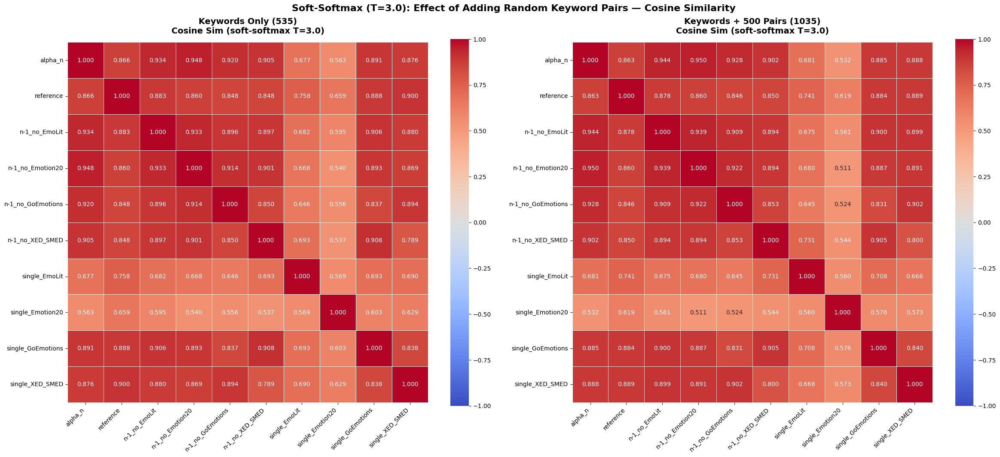

Saved: softmax_expanded_vs_original_cosine_T3.0.png


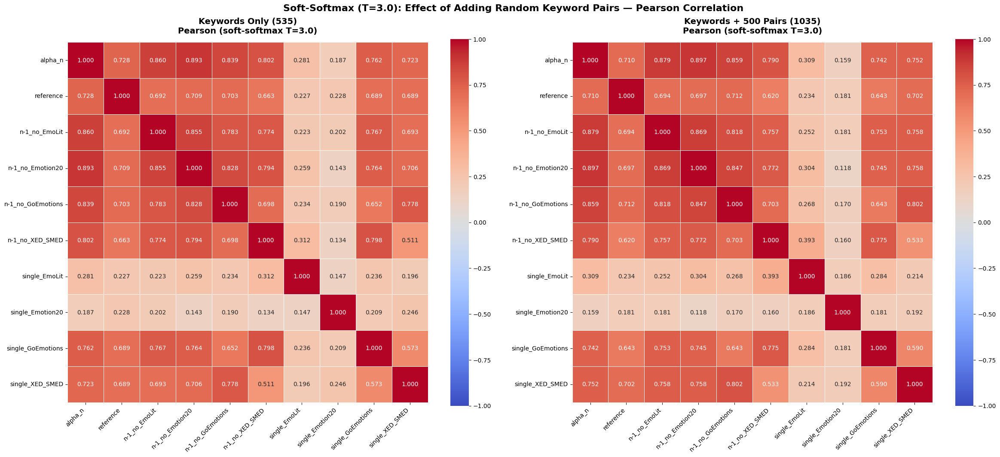

Saved: softmax_expanded_vs_original_pearson_T3.0.png


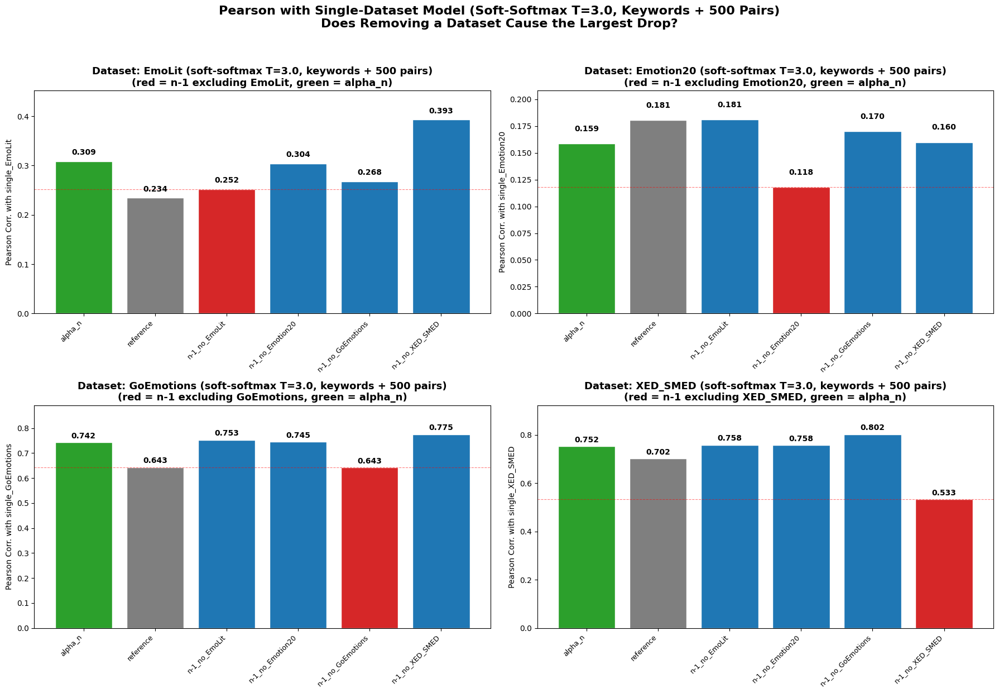

Saved: barplot_softmax_expanded_500pairs_T3.0.png

Summary: Soft-softmax T=3.0, Keywords + 500 pairs
Is n-1_no_X the minimum Pearson corr. with single_X?

  EmoLit (compared to single_EmoLit):
    alpha_n                   0.3086
    reference                 0.2343
    n-1_no_EmoLit             0.2523 ◄──  (EXCLUDED, MIN)
    n-1_no_Emotion20          0.3037
    n-1_no_GoEmotions         0.2681
    n-1_no_XED_SMED           0.3930
  Hypothesis supported: YES

  Emotion20 (compared to single_Emotion20):
    alpha_n                   0.1588
    reference                 0.1805
    n-1_no_EmoLit             0.1810
    n-1_no_Emotion20          0.1178 ◄──  (EXCLUDED, MIN)
    n-1_no_GoEmotions         0.1702
    n-1_no_XED_SMED           0.1600
  Hypothesis supported: YES

  GoEmotions (compared to single_GoEmotions):
    alpha_n                   0.7423
    reference                 0.6430
    n-1_no_EmoLit             0.7528
    n-1_no_Emotion20          0.7452
    n-1_no_GoEmotions    

In [50]:
# ══════════════════════════════════════════════════════════════════════════════
# Soft-Softmax Comparison: Keywords + 500 Random Keyword Pairs
#
# Apply soft-softmax (T=3.0) to the expanded logit matrices, then flatten,
# L2-normalize, and compare using cosine similarity and Pearson correlation.
# Compare side-by-side with the keyword-only soft-softmax results.
# ══════════════════════════════════════════════════════════════════════════════

from scipy.special import softmax as scipy_softmax

TEMPERATURE = 3.0

# ── 1. Apply soft-softmax to expanded logit matrices ─────────────────────────

softmax_expanded = {}
for k in model_keys_exp:
    softmax_expanded[k] = scipy_softmax(logit_matrices_expanded[k] / TEMPERATURE, axis=1)

print(f"Soft-softmax (T={TEMPERATURE}) applied to expanded logit matrices.")
print(f"  Shape: {list(softmax_expanded.values())[0].shape}")


# ── 2. Flatten, L2-normalize, pairwise comparison ───────────────────────────

flattened_soft_exp = {}
for k in model_keys_exp:
    flattened_soft_exp[k] = l2_normalize(softmax_expanded[k].flatten())

# Cosine similarity
cos_soft_exp = np.zeros((n_models_exp, n_models_exp))
for i, ki in enumerate(model_keys_exp):
    for j, kj in enumerate(model_keys_exp):
        cos_soft_exp[i, j] = sklearn_cosine_sim(
            flattened_soft_exp[ki].reshape(1, -1), flattened_soft_exp[kj].reshape(1, -1)
        )[0, 0]

# Pearson correlation
pear_soft_exp = np.zeros((n_models_exp, n_models_exp))
for i, ki in enumerate(model_keys_exp):
    for j, kj in enumerate(model_keys_exp):
        pear_soft_exp[i, j], _ = pearsonr(flattened_soft_exp[ki], flattened_soft_exp[kj])

cos_soft_exp_df = pd.DataFrame(cos_soft_exp, index=model_keys_exp, columns=model_keys_exp)
pear_soft_exp_df = pd.DataFrame(pear_soft_exp, index=model_keys_exp, columns=model_keys_exp)


# ── 3. Compute keyword-only soft-softmax for comparison ──────────────────
# (in case NCC cell hasn't run yet)

softmax_kw_only = {}
for k in model_keys:
    if k in logit_matrices:
        softmax_kw_only[k] = scipy_softmax(logit_matrices[k] / TEMPERATURE, axis=1)

flattened_soft_kw = {}
for k in model_keys:
    if k in softmax_kw_only:
        flattened_soft_kw[k] = l2_normalize(softmax_kw_only[k].flatten())

cos_soft_kw = np.zeros((n_models, n_models))
pear_soft_kw = np.zeros((n_models, n_models))
for i, ki in enumerate(model_keys):
    for j, kj in enumerate(model_keys):
        if ki in flattened_soft_kw and kj in flattened_soft_kw:
            cos_soft_kw[i, j] = sklearn_cosine_sim(
                flattened_soft_kw[ki].reshape(1, -1), flattened_soft_kw[kj].reshape(1, -1)
            )[0, 0]
            pear_soft_kw[i, j], _ = pearsonr(flattened_soft_kw[ki], flattened_soft_kw[kj])

cos_soft_kw_df = pd.DataFrame(cos_soft_kw, index=model_keys, columns=model_keys)
pear_soft_kw_df = pd.DataFrame(pear_soft_kw, index=model_keys, columns=model_keys)

# ── 4. Side-by-side: keyword-only softmax vs expanded softmax ────────────────
# cosine_df and ncc_cen_df are from the keyword-only soft-softmax cell (cell 51)

# Cosine comparison
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 10))

sns.heatmap(cos_soft_kw_df, annot=True, fmt=".3f", cmap="coolwarm", center=0,
            vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
            square=True, ax=ax1)
ax1.set_title(f"Keywords Only (535)\nCosine Sim (soft-softmax T={TEMPERATURE})",
              fontsize=14, fontweight="bold", pad=15)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha="right")

sns.heatmap(cos_soft_exp_df, annot=True, fmt=".3f", cmap="coolwarm", center=0,
            vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
            square=True, ax=ax2)
ax2.set_title(f"Keywords + {N_PAIRS} Pairs ({len(expanded_inputs)})\nCosine Sim (soft-softmax T={TEMPERATURE})",
              fontsize=14, fontweight="bold", pad=15)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha="right")

fig.suptitle(f"Soft-Softmax (T={TEMPERATURE}): Effect of Adding Random Keyword Pairs — Cosine Similarity",
             fontsize=16, fontweight="bold", y=1.02)
plt.tight_layout()
plt.savefig(f"softmax_expanded_vs_original_cosine_T{TEMPERATURE}.png", dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved: softmax_expanded_vs_original_cosine_T{TEMPERATURE}.png")

# Pearson comparison
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 10))

sns.heatmap(pear_soft_kw_df, annot=True, fmt=".3f", cmap="coolwarm", center=0,
            vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
            square=True, ax=ax1)
ax1.set_title(f"Keywords Only (535)\nPearson (soft-softmax T={TEMPERATURE})",
              fontsize=14, fontweight="bold", pad=15)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha="right")

sns.heatmap(pear_soft_exp_df, annot=True, fmt=".3f", cmap="coolwarm", center=0,
            vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
            square=True, ax=ax2)
ax2.set_title(f"Keywords + {N_PAIRS} Pairs ({len(expanded_inputs)})\nPearson (soft-softmax T={TEMPERATURE})",
              fontsize=14, fontweight="bold", pad=15)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha="right")

fig.suptitle(f"Soft-Softmax (T={TEMPERATURE}): Effect of Adding Random Keyword Pairs — Pearson Correlation",
             fontsize=16, fontweight="bold", y=1.02)
plt.tight_layout()
plt.savefig(f"softmax_expanded_vs_original_pearson_T{TEMPERATURE}.png", dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved: softmax_expanded_vs_original_pearson_T{TEMPERATURE}.png")


# ── 5. Bar plots with expanded soft-softmax ──────────────────────────────────

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

for ds_idx, (ds_name, n1_key, single_key) in enumerate(zip(DATASET_NAMES, N1_KEYS, SINGLE_KEYS)):
    row, col = divmod(ds_idx, 2)
    ax = axes[row][col]

    if single_key not in model_keys_exp:
        ax.set_title(f"{ds_name} — single model not available")
        continue

    single_idx = model_keys_exp.index(single_key)
    bar_models = ["alpha_n", "reference"] + N1_KEYS

    bar_labels = []
    bar_values = []
    bar_colors = []

    for bm in bar_models:
        if bm not in model_keys_exp:
            continue
        bm_idx = model_keys_exp.index(bm)
        corr = pear_soft_exp[single_idx, bm_idx]
        bar_labels.append(bm)
        bar_values.append(corr)

        if bm == n1_key:
            bar_colors.append("#d62728")
        elif bm == "reference":
            bar_colors.append("#7f7f7f")
        elif bm == "alpha_n":
            bar_colors.append("#2ca02c")
        else:
            bar_colors.append("#1f77b4")

    bars = ax.bar(range(len(bar_labels)), bar_values, color=bar_colors, edgecolor="white")

    for bar_obj, val in zip(bars, bar_values):
        ax.text(bar_obj.get_x() + bar_obj.get_width() / 2, bar_obj.get_height() + 0.01,
                f"{val:.3f}", ha="center", va="bottom", fontsize=10, fontweight="bold")

    ax.set_xticks(range(len(bar_labels)))
    ax.set_xticklabels(bar_labels, rotation=45, ha="right", fontsize=9)
    ax.set_ylabel(f"Pearson Corr. with {single_key}", fontsize=10)
    ax.set_title(f"Dataset: {ds_name} (soft-softmax T={TEMPERATURE}, keywords + {N_PAIRS} pairs)\n"
                 f"(red = n-1 excluding {ds_name}, green = alpha_n)",
                 fontsize=13, fontweight="bold")
    ax.set_ylim(0, max(bar_values) * 1.15)

    n1_vals = [v for v, l in zip(bar_values, bar_labels) if l in N1_KEYS]
    if n1_vals:
        ax.axhline(y=min(n1_vals), color="red", linestyle="--", linewidth=0.8, alpha=0.5)

fig.suptitle(f"Pearson with Single-Dataset Model (Soft-Softmax T={TEMPERATURE}, Keywords + {N_PAIRS} Pairs)\n"
             f"Does Removing a Dataset Cause the Largest Drop?",
             fontsize=16, fontweight="bold", y=1.03)
plt.tight_layout()
plt.savefig(f"barplot_softmax_expanded_{N_PAIRS}pairs_T{TEMPERATURE}.png", dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved: barplot_softmax_expanded_{N_PAIRS}pairs_T{TEMPERATURE}.png")


# ── 6. Summary table ────────────────────────────────────────────────────────

print("\n" + "=" * 70)
print(f"Summary: Soft-softmax T={TEMPERATURE}, Keywords + {N_PAIRS} pairs")
print(f"Is n-1_no_X the minimum Pearson corr. with single_X?")
print("=" * 70)

for ds_name, n1_key, single_key in zip(DATASET_NAMES, N1_KEYS, SINGLE_KEYS):
    if single_key not in model_keys_exp:
        print(f"\n  {ds_name}: single model not available")
        continue

    single_idx = model_keys_exp.index(single_key)

    compare_models = ["alpha_n", "reference"] + N1_KEYS
    all_corrs = {}
    for bm in compare_models:
        if bm in model_keys_exp:
            bm_idx = model_keys_exp.index(bm)
            all_corrs[bm] = pear_soft_exp[single_idx, bm_idx]

    n1_corrs = {k: v for k, v in all_corrs.items() if k in N1_KEYS}
    min_model = min(n1_corrs, key=n1_corrs.get)
    is_minimum = (min_model == n1_key)

    print(f"\n  {ds_name} (compared to {single_key}):")
    for bm, corr in all_corrs.items():
        tags = []
        if bm == n1_key:
            tags.append("EXCLUDED")
        if bm in N1_KEYS and bm == min_model:
            tags.append("MIN")
        tag_str = f"  ({', '.join(tags)})" if tags else ""
        marker = " ◄──" if tags else ""
        print(f"    {bm:<25} {corr:.4f}{marker}{tag_str}")
    print(f"  Hypothesis supported: {'YES' if is_minimum else 'NO'}")


## Logit Comparison: Keywords + 1000 Random Keyword Pairs

Extend to 1000 pairs and compare three conditions side by side:
1. Keywords only (535)
2. Keywords + 500 pairs (1035)
3. Keywords + 1000 pairs (1535)

Both raw logits and soft-softmax (T=3.0) versions.
Tests whether adding more pairs strengthens, weakens, or stabilizes the similarity structure.

Keywords only:        535
Keywords + 500 pairs: 1035
Keywords + 1000 pairs: 1535
  New pairs (500-1000) examples: ['cool rose', 'thought public', 'spending disappointed', 'song back', 'water sleep']
Computing 1000-pair logit matrix for: alpha_n


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (1535, 9)
Computing 1000-pair logit matrix for: reference


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (1535, 9)
Computing 1000-pair logit matrix for: n-1_no_EmoLit


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (1535, 9)
Computing 1000-pair logit matrix for: n-1_no_Emotion20


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (1535, 9)
Computing 1000-pair logit matrix for: n-1_no_GoEmotions


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (1535, 9)
Computing 1000-pair logit matrix for: n-1_no_XED_SMED


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (1535, 9)
Computing 1000-pair logit matrix for: single_EmoLit


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (1535, 9)
Computing 1000-pair logit matrix for: single_Emotion20


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (1535, 9)
Computing 1000-pair logit matrix for: single_GoEmotions


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (1535, 9)
Computing 1000-pair logit matrix for: single_XED_SMED


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Shape: (1535, 9)

✓ 1000-pair logit matrices computed for 10 models.


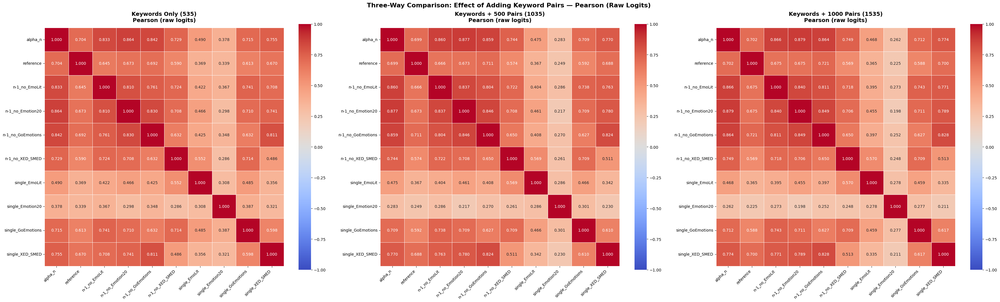

Saved: threeway_pearson_raw.png


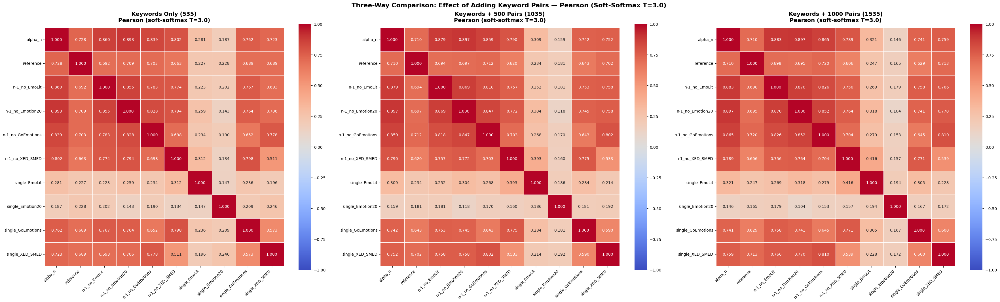

Saved: threeway_pearson_softmax_T3.0.png


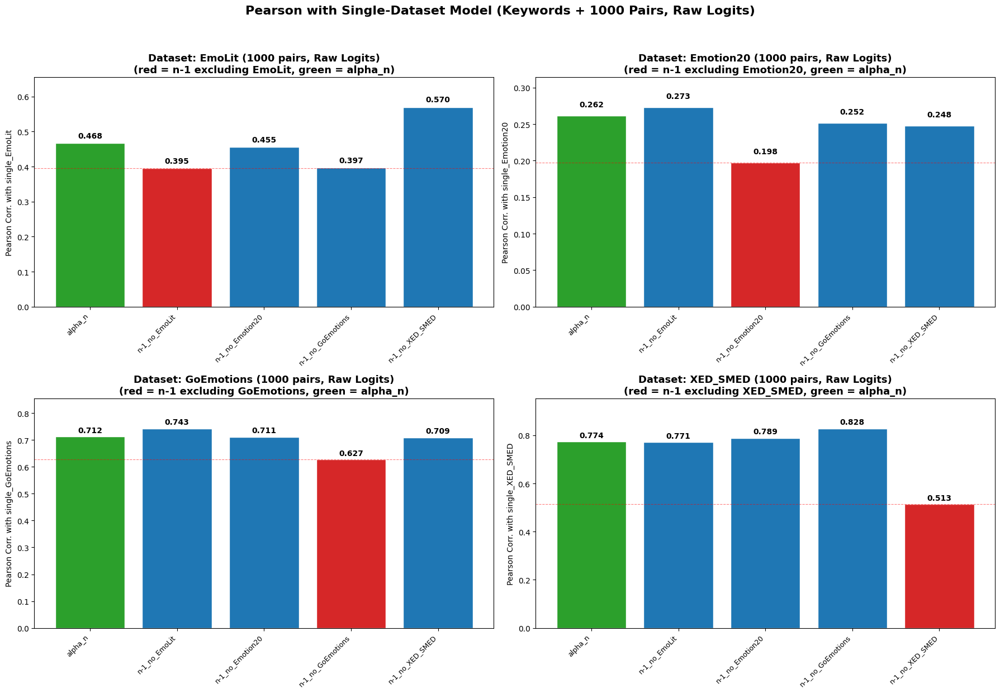

Saved: barplot_1000pairs_Raw_Logits.png


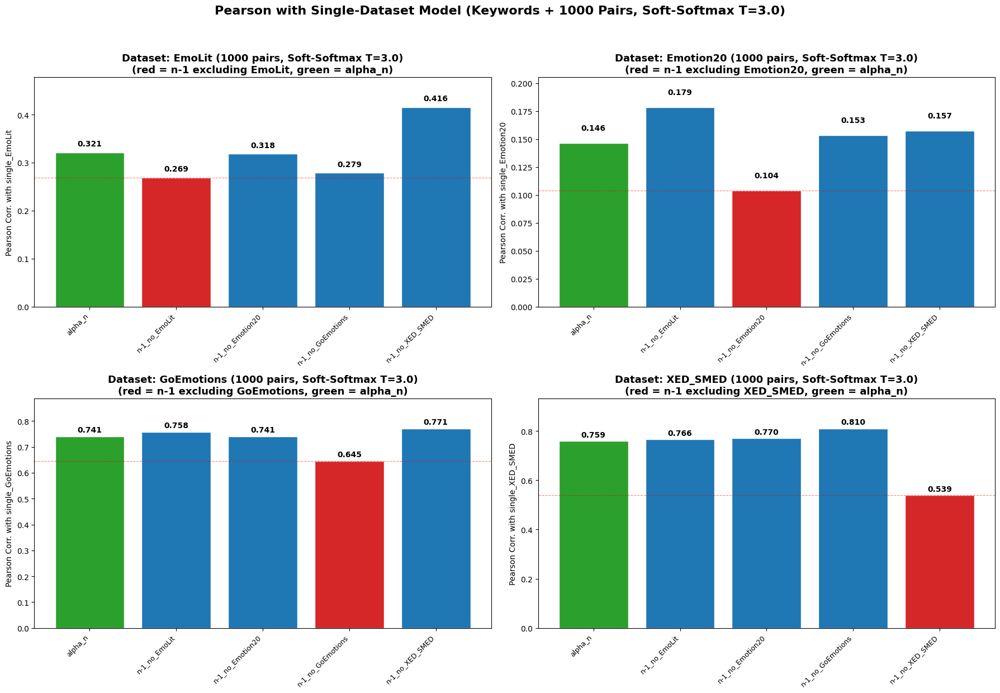

Saved: barplot_1000pairs_Soft-Softmax_T30.png

Summary: Raw Logits, 1000 pairs
Is n-1_no_X the minimum Pearson corr. with single_X?

  EmoLit (compared to single_EmoLit):
    alpha_n                   0.4676
    reference                 0.3654
    n-1_no_EmoLit             0.3954 ◄──  (EXCLUDED, MIN)
    n-1_no_Emotion20          0.4555
    n-1_no_GoEmotions         0.3965
    n-1_no_XED_SMED           0.5699
  Hypothesis supported: YES

  Emotion20 (compared to single_Emotion20):
    alpha_n                   0.2617
    reference                 0.2249
    n-1_no_EmoLit             0.2733
    n-1_no_Emotion20          0.1975 ◄──  (EXCLUDED, MIN)
    n-1_no_GoEmotions         0.2516
    n-1_no_XED_SMED           0.2480
  Hypothesis supported: YES

  GoEmotions (compared to single_GoEmotions):
    alpha_n                   0.7118
    reference                 0.5877
    n-1_no_EmoLit             0.7426
    n-1_no_Emotion20          0.7113
    n-1_no_GoEmotions         0.6265 ◄──  (EXCL

In [51]:
# ══════════════════════════════════════════════════════════════════════════════
# Logit Comparison: Keywords + 1000 Random Keyword Pairs
#
# Extend to 1000 pairs (adding 500 more to the existing 500).
# Compare three conditions:
#   1. Keywords only (535)
#   2. Keywords + 500 pairs (1035)
#   3. Keywords + 1000 pairs (1535)
# ══════════════════════════════════════════════════════════════════════════════

# ── 1. Generate 500 additional keyword pairs ─────────────────────────────────
# Keep the same seed-based pairs from before, add 500 more

random.seed(SEED)
# Re-generate the original 500 to keep pair_set consistent
pair_set_1000 = set()
keyword_pairs_1000 = []

while len(keyword_pairs_1000) < 1000:
    kw1, kw2 = random.sample(all_keywords_union, 2)
    pair = f"{kw1} {kw2}"
    reverse_pair = f"{kw2} {kw1}"
    if pair not in pair_set_1000 and reverse_pair not in pair_set_1000:
        pair_set_1000.add(pair)
        keyword_pairs_1000.append(pair)

# Verify first 500 match the original
assert keyword_pairs_1000[:500] == keyword_pairs, "First 500 pairs should match the original set"

expanded_inputs_1000 = all_keywords_union + keyword_pairs_1000
print(f"Keywords only:        {len(all_keywords_union)}")
print(f"Keywords + 500 pairs: {len(expanded_inputs)}")
print(f"Keywords + 1000 pairs: {len(expanded_inputs_1000)}")
print(f"  New pairs (500-1000) examples: {keyword_pairs_1000[500:505]}")


# ── 2. Compute logit matrices for 1000-pair expanded set ─────────────────────

logit_matrices_1000 = {}
for config_key in ALL_KEYS:
    model_path = MODEL_PATHS.get(config_key)
    if model_path is None or not os.path.isdir(model_path):
        print(f"  SKIP {config_key}: model not found")
        continue
    print(f"Computing 1000-pair logit matrix for: {config_key}")
    logit_matrices_1000[config_key] = compute_logit_matrix(model_path, expanded_inputs_1000)
    print(f"  Shape: {logit_matrices_1000[config_key].shape}")

print(f"\n✓ 1000-pair logit matrices computed for {len(logit_matrices_1000)} models.")


# ── 3. Flatten, L2-normalize, pairwise comparison (raw logits) ───────────────

model_keys_1000 = list(logit_matrices_1000.keys())
n_models_1000 = len(model_keys_1000)

flattened_1000 = {}
for k in model_keys_1000:
    flattened_1000[k] = l2_normalize(logit_matrices_1000[k].flatten())

cos_1000 = np.zeros((n_models_1000, n_models_1000))
pear_1000 = np.zeros((n_models_1000, n_models_1000))
for i, ki in enumerate(model_keys_1000):
    for j, kj in enumerate(model_keys_1000):
        cos_1000[i, j] = sklearn_cosine_sim(
            flattened_1000[ki].reshape(1, -1), flattened_1000[kj].reshape(1, -1)
        )[0, 0]
        pear_1000[i, j], _ = pearsonr(flattened_1000[ki], flattened_1000[kj])

cos_1000_df = pd.DataFrame(cos_1000, index=model_keys_1000, columns=model_keys_1000)
pear_1000_df = pd.DataFrame(pear_1000, index=model_keys_1000, columns=model_keys_1000)


# ── 4. Also compute soft-softmax version ─────────────────────────────────────

softmax_1000 = {}
for k in model_keys_1000:
    softmax_1000[k] = scipy_softmax(logit_matrices_1000[k] / TEMPERATURE, axis=1)

flattened_soft_1000 = {}
for k in model_keys_1000:
    flattened_soft_1000[k] = l2_normalize(softmax_1000[k].flatten())

cos_soft_1000 = np.zeros((n_models_1000, n_models_1000))
pear_soft_1000 = np.zeros((n_models_1000, n_models_1000))
for i, ki in enumerate(model_keys_1000):
    for j, kj in enumerate(model_keys_1000):
        cos_soft_1000[i, j] = sklearn_cosine_sim(
            flattened_soft_1000[ki].reshape(1, -1), flattened_soft_1000[kj].reshape(1, -1)
        )[0, 0]
        pear_soft_1000[i, j], _ = pearsonr(flattened_soft_1000[ki], flattened_soft_1000[kj])

cos_soft_1000_df = pd.DataFrame(cos_soft_1000, index=model_keys_1000, columns=model_keys_1000)
pear_soft_1000_df = pd.DataFrame(pear_soft_1000, index=model_keys_1000, columns=model_keys_1000)


# ── 5. Three-way comparison heatmaps (raw logits) ────────────────────────────

# Pearson
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(36, 10))

sns.heatmap(pear_df, annot=True, fmt=".3f", cmap="coolwarm", center=0,
            vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
            square=True, ax=ax1)
ax1.set_title(f"Keywords Only ({len(all_keywords_union)})\nPearson (raw logits)",
              fontsize=14, fontweight="bold", pad=15)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha="right")

sns.heatmap(pear_exp_df, annot=True, fmt=".3f", cmap="coolwarm", center=0,
            vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
            square=True, ax=ax2)
ax2.set_title(f"Keywords + 500 Pairs ({len(expanded_inputs)})\nPearson (raw logits)",
              fontsize=14, fontweight="bold", pad=15)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha="right")

sns.heatmap(pear_1000_df, annot=True, fmt=".3f", cmap="coolwarm", center=0,
            vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
            square=True, ax=ax3)
ax3.set_title(f"Keywords + 1000 Pairs ({len(expanded_inputs_1000)})\nPearson (raw logits)",
              fontsize=14, fontweight="bold", pad=15)
ax3.set_xticklabels(ax3.get_xticklabels(), rotation=45, ha="right")

fig.suptitle("Three-Way Comparison: Effect of Adding Keyword Pairs — Pearson (Raw Logits)",
             fontsize=16, fontweight="bold", y=1.02)
plt.tight_layout()
plt.savefig("threeway_pearson_raw.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved: threeway_pearson_raw.png")

# Soft-softmax Pearson
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(36, 10))

sns.heatmap(pear_soft_kw_df, annot=True, fmt=".3f", cmap="coolwarm", center=0,
            vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
            square=True, ax=ax1)
ax1.set_title(f"Keywords Only ({len(all_keywords_union)})\nPearson (soft-softmax T={TEMPERATURE})",
              fontsize=14, fontweight="bold", pad=15)
ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha="right")

sns.heatmap(pear_soft_exp_df, annot=True, fmt=".3f", cmap="coolwarm", center=0,
            vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
            square=True, ax=ax2)
ax2.set_title(f"Keywords + 500 Pairs ({len(expanded_inputs)})\nPearson (soft-softmax T={TEMPERATURE})",
              fontsize=14, fontweight="bold", pad=15)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha="right")

sns.heatmap(pear_soft_1000_df, annot=True, fmt=".3f", cmap="coolwarm", center=0,
            vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
            square=True, ax=ax3)
ax3.set_title(f"Keywords + 1000 Pairs ({len(expanded_inputs_1000)})\nPearson (soft-softmax T={TEMPERATURE})",
              fontsize=14, fontweight="bold", pad=15)
ax3.set_xticklabels(ax3.get_xticklabels(), rotation=45, ha="right")

fig.suptitle(f"Three-Way Comparison: Effect of Adding Keyword Pairs — Pearson (Soft-Softmax T={TEMPERATURE})",
             fontsize=16, fontweight="bold", y=1.02)
plt.tight_layout()
plt.savefig(f"threeway_pearson_softmax_T{TEMPERATURE}.png", dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved: threeway_pearson_softmax_T{TEMPERATURE}.png")


# ── 6. Bar plots for 1000 pairs (raw logits + soft-softmax) ─────────────────

for title_suffix, pear_mat, mk in [
    ("Raw Logits", pear_1000, model_keys_1000),
    (f"Soft-Softmax T={TEMPERATURE}", pear_soft_1000, model_keys_1000)
]:
    fig, axes = plt.subplots(2, 2, figsize=(18, 12))

    for ds_idx, (ds_name, n1_key, single_key) in enumerate(zip(DATASET_NAMES, N1_KEYS, SINGLE_KEYS)):
        row, col = divmod(ds_idx, 2)
        ax = axes[row][col]

        if single_key not in mk:
            ax.set_title(f"{ds_name} — single model not available")
            continue

        single_idx = mk.index(single_key)
        # bar_models = ["alpha_n", "reference"] + N1_KEYS
        bar_models = ["alpha_n"] + N1_KEYS

        bar_labels = []
        bar_values = []
        bar_colors = []

        for bm in bar_models:
            if bm not in mk:
                continue
            bm_idx = mk.index(bm)
            corr = pear_mat[single_idx, bm_idx]
            bar_labels.append(bm)
            bar_values.append(corr)

            if bm == n1_key:
                bar_colors.append("#d62728")
            elif bm == "reference":
                bar_colors.append("#7f7f7f")
            elif bm == "alpha_n":
                bar_colors.append("#2ca02c")
            else:
                bar_colors.append("#1f77b4")

        bars = ax.bar(range(len(bar_labels)), bar_values, color=bar_colors, edgecolor="white")

        for bar_obj, val in zip(bars, bar_values):
            ax.text(bar_obj.get_x() + bar_obj.get_width() / 2, bar_obj.get_height() + 0.01,
                    f"{val:.3f}", ha="center", va="bottom", fontsize=10, fontweight="bold")

        ax.set_xticks(range(len(bar_labels)))
        ax.set_xticklabels(bar_labels, rotation=45, ha="right", fontsize=9)
        ax.set_ylabel(f"Pearson Corr. with {single_key}", fontsize=10)
        ax.set_title(f"Dataset: {ds_name} (1000 pairs, {title_suffix})\n"
                     f"(red = n-1 excluding {ds_name}, green = alpha_n)",
                     fontsize=13, fontweight="bold")
        ax.set_ylim(0, max(bar_values) * 1.15)

        n1_vals = [v for v, l in zip(bar_values, bar_labels) if l in N1_KEYS]
        if n1_vals:
            ax.axhline(y=min(n1_vals), color="red", linestyle="--", linewidth=0.8, alpha=0.5)

    safe_suffix = title_suffix.replace(" ", "_").replace("=", "").replace(".", "")
    fig.suptitle(f"Pearson with Single-Dataset Model (Keywords + 1000 Pairs, {title_suffix})",
                 fontsize=16, fontweight="bold", y=1.03)
    plt.tight_layout()
    plt.savefig(f"barplot_1000pairs_{safe_suffix}.png", dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved: barplot_1000pairs_{safe_suffix}.png")


# ── 7. Summary tables ───────────────────────────────────────────────────────

for title_suffix, pear_mat, mk in [
    ("Raw Logits, 1000 pairs", pear_1000, model_keys_1000),
    (f"Soft-Softmax T={TEMPERATURE}, 1000 pairs", pear_soft_1000, model_keys_1000)
]:
    print("\n" + "=" * 70)
    print(f"Summary: {title_suffix}")
    print(f"Is n-1_no_X the minimum Pearson corr. with single_X?")
    print("=" * 70)

    for ds_name, n1_key, single_key in zip(DATASET_NAMES, N1_KEYS, SINGLE_KEYS):
        if single_key not in mk:
            print(f"\n  {ds_name}: single model not available")
            continue

        single_idx = mk.index(single_key)

        compare_models = ["alpha_n", "reference"] + N1_KEYS
        all_corrs = {}
        for bm in compare_models:
            if bm in mk:
                bm_idx = mk.index(bm)
                all_corrs[bm] = pear_mat[single_idx, bm_idx]

        n1_corrs = {k: v for k, v in all_corrs.items() if k in N1_KEYS}
        min_model = min(n1_corrs, key=n1_corrs.get)
        is_minimum = (min_model == n1_key)

        print(f"\n  {ds_name} (compared to {single_key}):")
        for bm, corr in all_corrs.items():
            tags = []
            if bm == n1_key:
                tags.append("EXCLUDED")
            if bm in N1_KEYS and bm == min_model:
                tags.append("MIN")
            tag_str = f"  ({', '.join(tags)})" if tags else ""
            marker = " ◄──" if tags else ""
            print(f"    {bm:<25} {corr:.4f}{marker}{tag_str}")
        print(f"  Hypothesis supported: {'YES' if is_minimum else 'NO'}")


## Scaling Experiment: Keywords + 2000/3000/4000/5000 Pairs

Incrementally add 1000 more pairs at each step (deterministic, same seed).
Each step is a superset of the previous — the first 500 pairs match the 500-pair experiment,
the first 1000 match the 1000-pair experiment, etc.

Produces: bar plots and summary tables for each pair count, multi-way heatmap comparison,
and convergence plots tracking how similarity evolves with more pairs.

Generated 5000 total pairs (deterministic, seed=42)
  Verified: first 500 match original, first 1000 match 1000-pair experiment

══════════════════════════════════════════════════════════════════════
  EXPERIMENT: Keywords + 2000 Random Keyword Pairs
══════════════════════════════════════════════════════════════════════
  Total inputs: 2535 (535 keywords + 2000 pairs)
  Computing logits for: alpha_n


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: reference


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: n-1_no_EmoLit


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: n-1_no_Emotion20


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: n-1_no_GoEmotions


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: n-1_no_XED_SMED


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: single_EmoLit


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: single_Emotion20


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: single_GoEmotions


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: single_XED_SMED


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

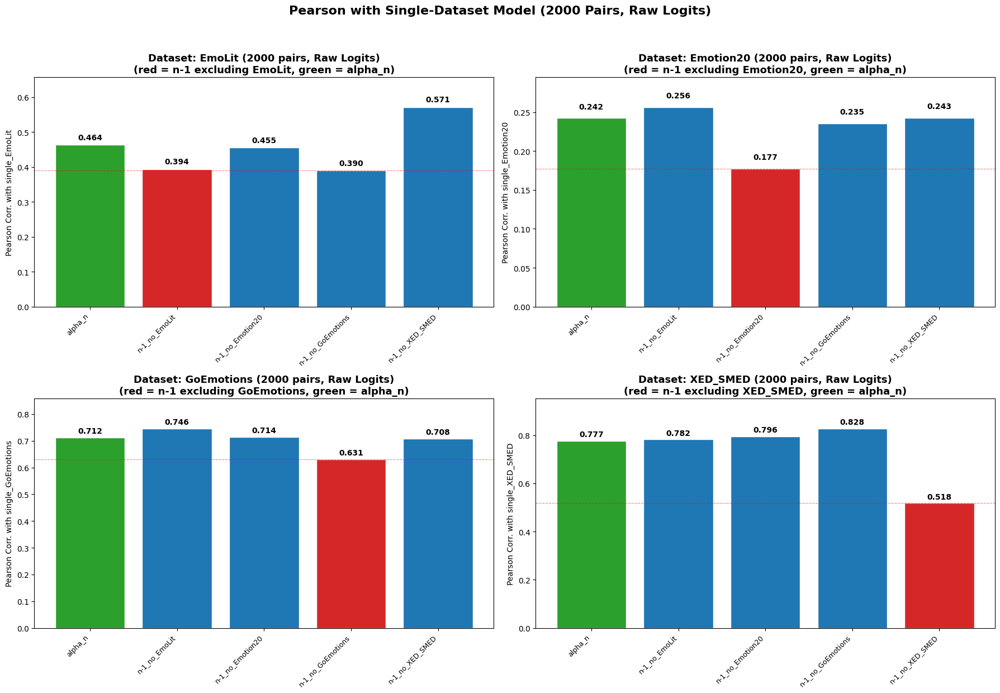

  Saved: barplot_2000pairs_Raw_Logits.png


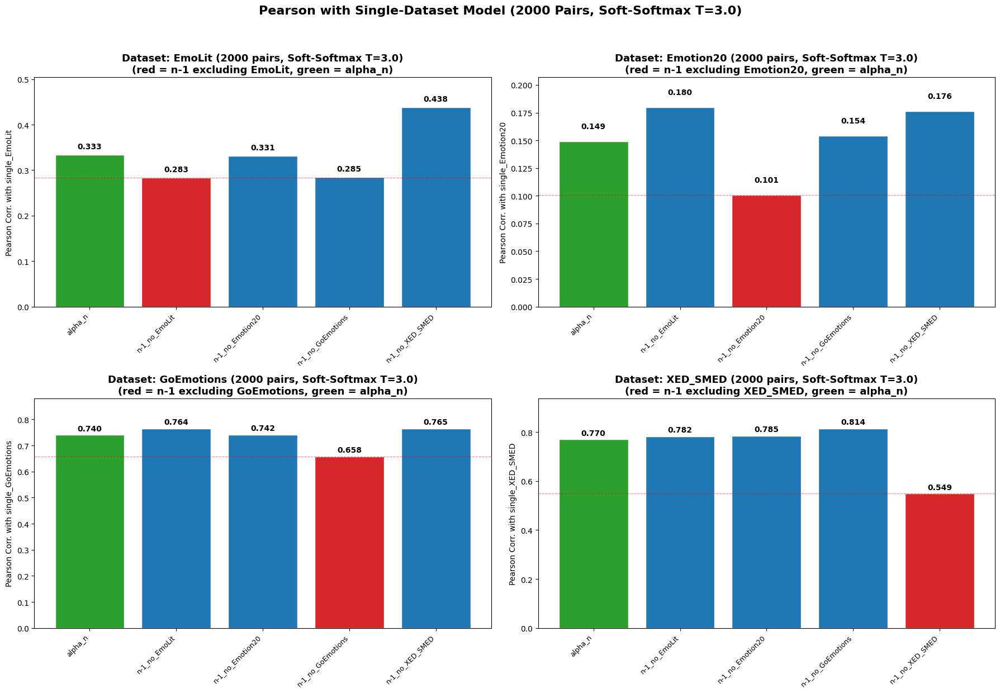

  Saved: barplot_2000pairs_Soft-Softmax_T30.png

  Summary: Raw Logits, 2000 pairs
    EmoLit: excluded=0.3938, min=0.3902 at n-1_no_GoEmotions, hypothesis=NO
    Emotion20: excluded=0.1772, min=0.1772 at n-1_no_Emotion20, hypothesis=YES
    GoEmotions: excluded=0.6311, min=0.6311 at n-1_no_GoEmotions, hypothesis=YES
    XED_SMED: excluded=0.5179, min=0.5179 at n-1_no_XED_SMED, hypothesis=YES

  Summary: Soft-Softmax T=3.0, 2000 pairs
    EmoLit: excluded=0.2831, min=0.2831 at n-1_no_EmoLit, hypothesis=YES
    Emotion20: excluded=0.1008, min=0.1008 at n-1_no_Emotion20, hypothesis=YES
    GoEmotions: excluded=0.6576, min=0.6576 at n-1_no_GoEmotions, hypothesis=YES
    XED_SMED: excluded=0.5489, min=0.5489 at n-1_no_XED_SMED, hypothesis=YES

══════════════════════════════════════════════════════════════════════
  EXPERIMENT: Keywords + 3000 Random Keyword Pairs
══════════════════════════════════════════════════════════════════════
  Total inputs: 3535 (535 keywords + 3000 pairs)
  Comput

Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: reference


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: n-1_no_EmoLit


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: n-1_no_Emotion20


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: n-1_no_GoEmotions


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: n-1_no_XED_SMED


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: single_EmoLit


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: single_Emotion20


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: single_GoEmotions


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: single_XED_SMED


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

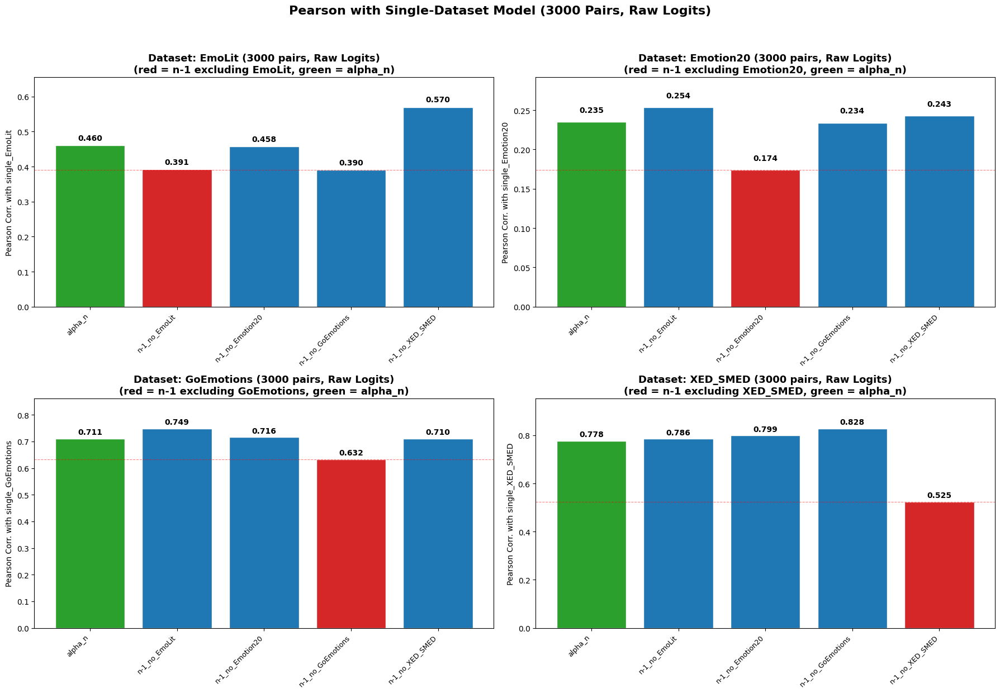

  Saved: barplot_3000pairs_Raw_Logits.png


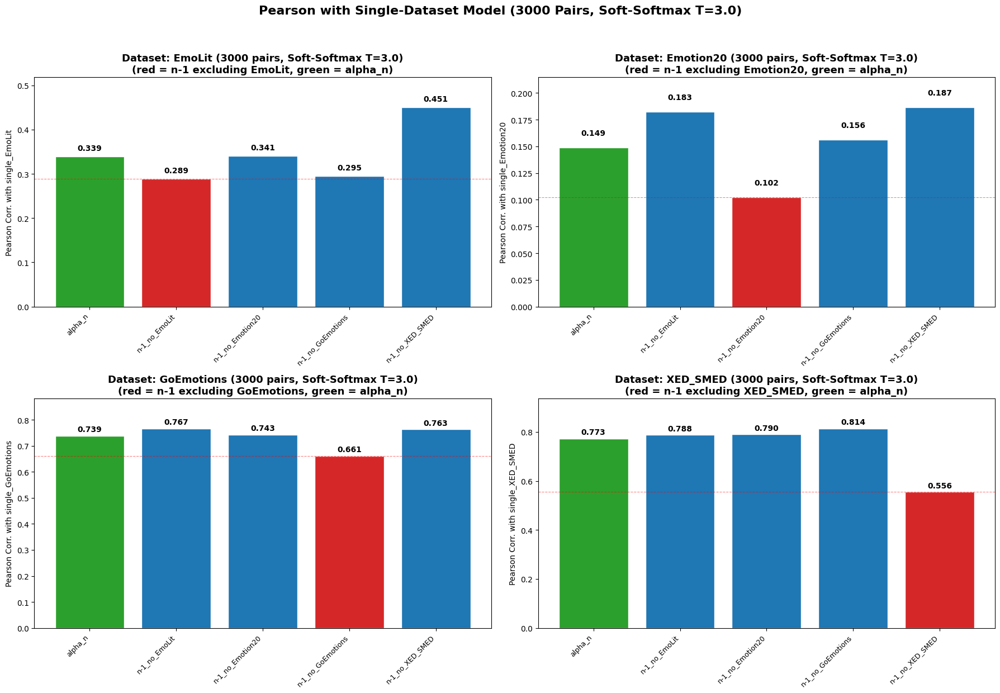

  Saved: barplot_3000pairs_Soft-Softmax_T30.png

  Summary: Raw Logits, 3000 pairs
    EmoLit: excluded=0.3915, min=0.3903 at n-1_no_GoEmotions, hypothesis=NO
    Emotion20: excluded=0.1738, min=0.1738 at n-1_no_Emotion20, hypothesis=YES
    GoEmotions: excluded=0.6322, min=0.6322 at n-1_no_GoEmotions, hypothesis=YES
    XED_SMED: excluded=0.5247, min=0.5247 at n-1_no_XED_SMED, hypothesis=YES

  Summary: Soft-Softmax T=3.0, 3000 pairs
    EmoLit: excluded=0.2888, min=0.2888 at n-1_no_EmoLit, hypothesis=YES
    Emotion20: excluded=0.1022, min=0.1022 at n-1_no_Emotion20, hypothesis=YES
    GoEmotions: excluded=0.6607, min=0.6607 at n-1_no_GoEmotions, hypothesis=YES
    XED_SMED: excluded=0.5560, min=0.5560 at n-1_no_XED_SMED, hypothesis=YES

══════════════════════════════════════════════════════════════════════
  EXPERIMENT: Keywords + 4000 Random Keyword Pairs
══════════════════════════════════════════════════════════════════════
  Total inputs: 4535 (535 keywords + 4000 pairs)
  Comput

Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: reference


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: n-1_no_EmoLit


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: n-1_no_Emotion20


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: n-1_no_GoEmotions


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: n-1_no_XED_SMED


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: single_EmoLit


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: single_Emotion20


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: single_GoEmotions


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: single_XED_SMED


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

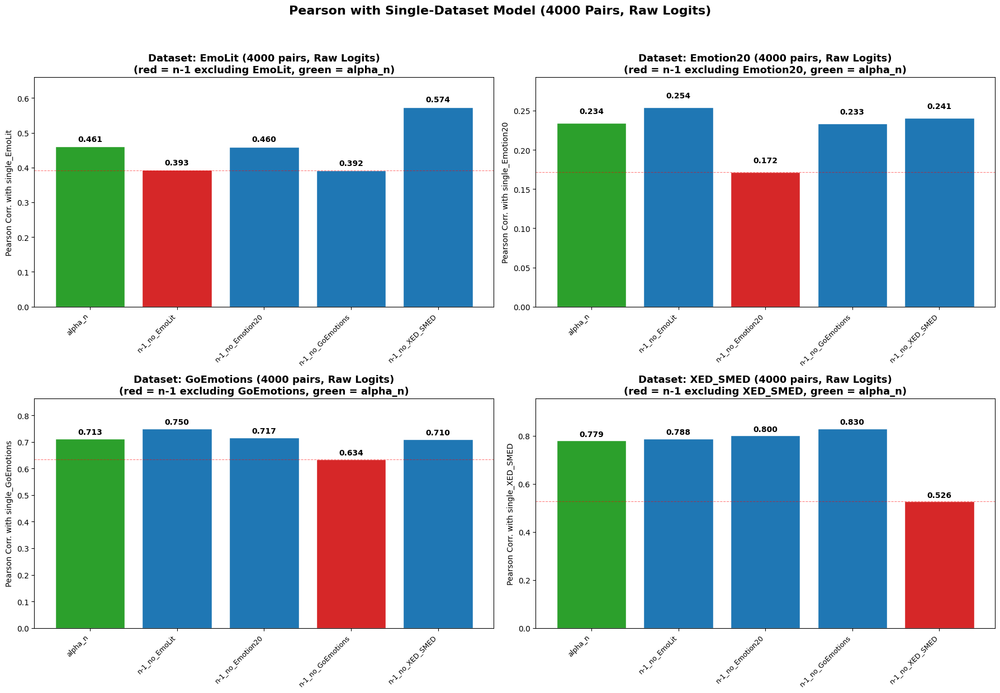

  Saved: barplot_4000pairs_Raw_Logits.png


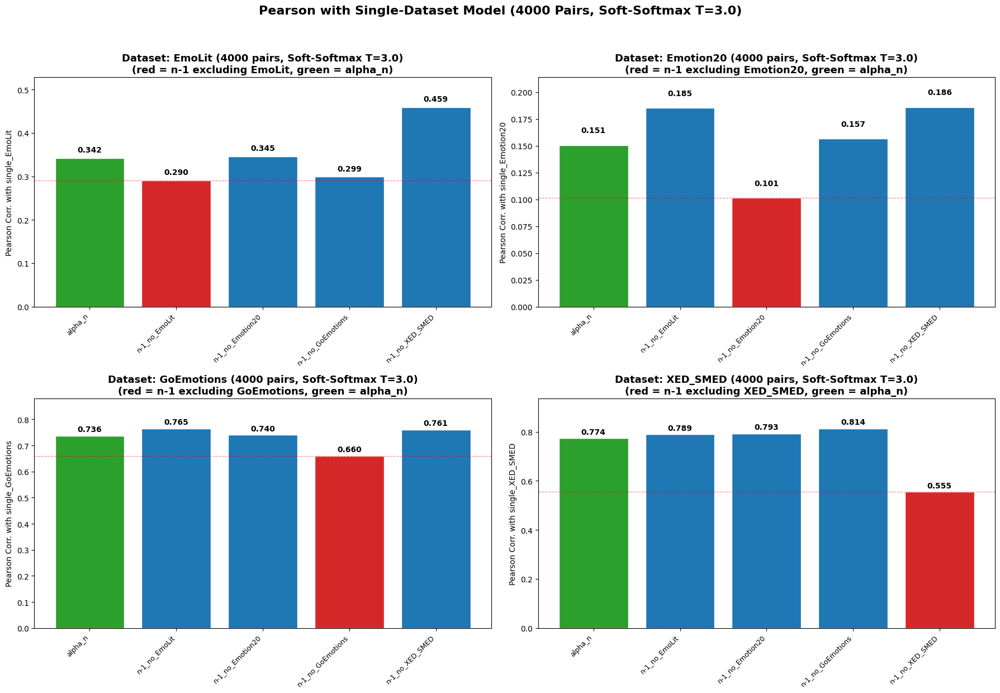

  Saved: barplot_4000pairs_Soft-Softmax_T30.png

  Summary: Raw Logits, 4000 pairs
    EmoLit: excluded=0.3933, min=0.3919 at n-1_no_GoEmotions, hypothesis=NO
    Emotion20: excluded=0.1716, min=0.1716 at n-1_no_Emotion20, hypothesis=YES
    GoEmotions: excluded=0.6343, min=0.6343 at n-1_no_GoEmotions, hypothesis=YES
    XED_SMED: excluded=0.5261, min=0.5261 at n-1_no_XED_SMED, hypothesis=YES

  Summary: Soft-Softmax T=3.0, 4000 pairs
    EmoLit: excluded=0.2902, min=0.2902 at n-1_no_EmoLit, hypothesis=YES
    Emotion20: excluded=0.1012, min=0.1012 at n-1_no_Emotion20, hypothesis=YES
    GoEmotions: excluded=0.6599, min=0.6599 at n-1_no_GoEmotions, hypothesis=YES
    XED_SMED: excluded=0.5552, min=0.5552 at n-1_no_XED_SMED, hypothesis=YES

══════════════════════════════════════════════════════════════════════
  EXPERIMENT: Keywords + 5000 Random Keyword Pairs
══════════════════════════════════════════════════════════════════════
  Total inputs: 5535 (535 keywords + 5000 pairs)
  Comput

Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: reference


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: n-1_no_EmoLit


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: n-1_no_Emotion20


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: n-1_no_GoEmotions


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: n-1_no_XED_SMED


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: single_EmoLit


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: single_Emotion20


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: single_GoEmotions


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

  Computing logits for: single_XED_SMED


Loading weights:   0%|          | 0/76 [00:00<?, ?it/s]

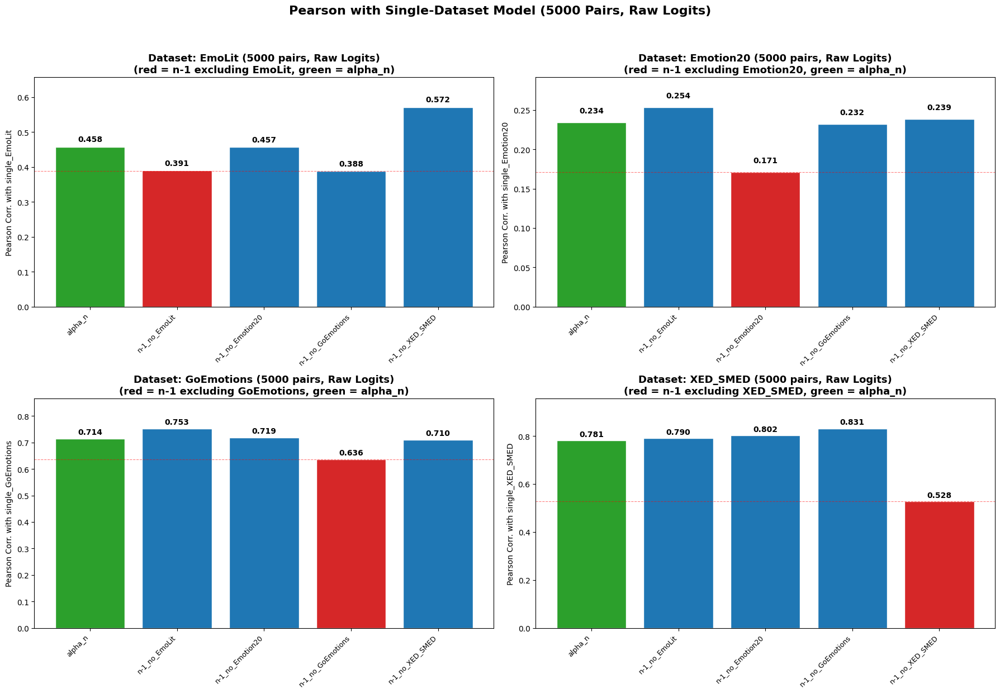

  Saved: barplot_5000pairs_Raw_Logits.png


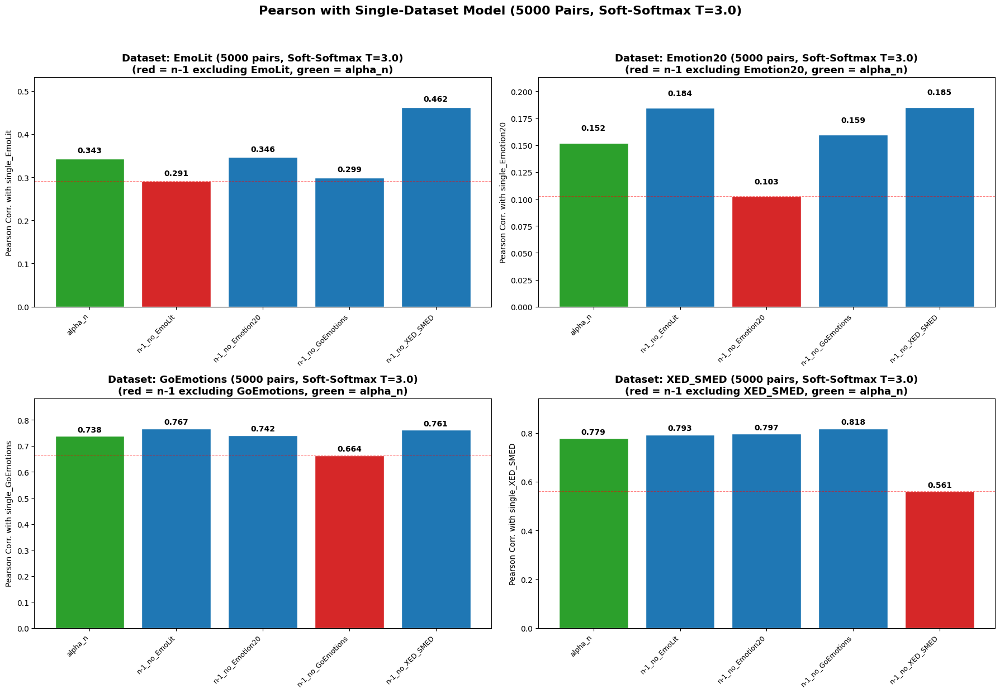

  Saved: barplot_5000pairs_Soft-Softmax_T30.png

  Summary: Raw Logits, 5000 pairs
    EmoLit: excluded=0.3905, min=0.3882 at n-1_no_GoEmotions, hypothesis=NO
    Emotion20: excluded=0.1708, min=0.1708 at n-1_no_Emotion20, hypothesis=YES
    GoEmotions: excluded=0.6358, min=0.6358 at n-1_no_GoEmotions, hypothesis=YES
    XED_SMED: excluded=0.5281, min=0.5281 at n-1_no_XED_SMED, hypothesis=YES

  Summary: Soft-Softmax T=3.0, 5000 pairs
    EmoLit: excluded=0.2906, min=0.2906 at n-1_no_EmoLit, hypothesis=YES
    Emotion20: excluded=0.1025, min=0.1025 at n-1_no_Emotion20, hypothesis=YES
    GoEmotions: excluded=0.6635, min=0.6635 at n-1_no_GoEmotions, hypothesis=YES
    XED_SMED: excluded=0.5607, min=0.5607 at n-1_no_XED_SMED, hypothesis=YES


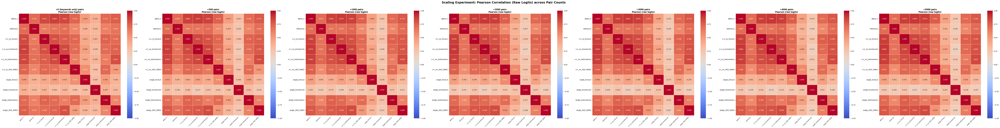

Saved: scaling_all_pearson_raw.png


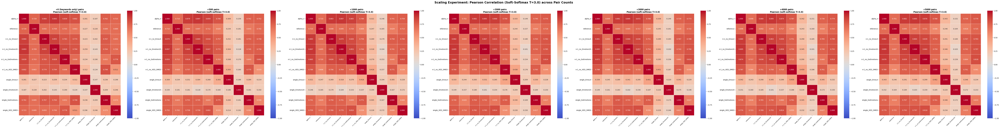

Saved: scaling_all_pearson_softmax_T3.0.png


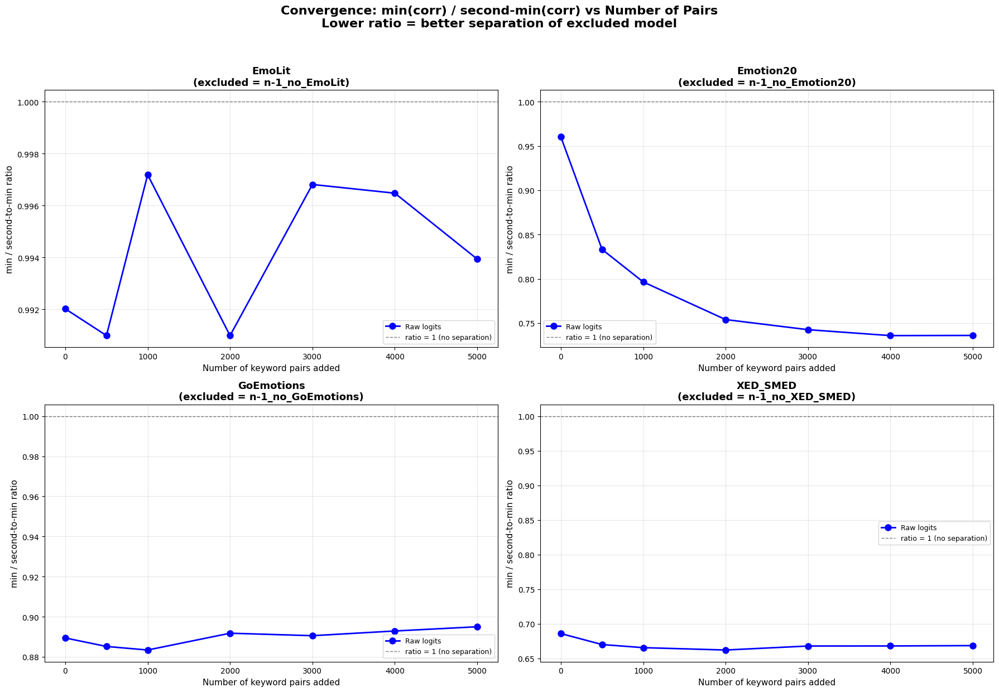

Saved: convergence_ratio.png

Convergence Ratios: min / second-to-min

  EmoLit:
    Pairs    | Raw ratio    | Softmax ratio   | Min model (raw)           | Is excluded?
    -------------------------------------------------------------------------------------
    0        | 0.9920       | 0.9502          | n-1_no_EmoLit             | YES
    500      | 0.9910       | 0.9407          | n-1_no_EmoLit             | YES
    1000     | 0.9972       | 0.9636          | n-1_no_EmoLit             | YES
    2000     | 0.9910       | 0.9948          | n-1_no_GoEmotions         | NO
    3000     | 0.9968       | 0.9805          | n-1_no_GoEmotions         | NO
    4000     | 0.9965       | 0.9702          | n-1_no_GoEmotions         | NO
    5000     | 0.9939       | 0.9715          | n-1_no_GoEmotions         | NO

  Emotion20:
    Pairs    | Raw ratio    | Softmax ratio   | Min model (raw)           | Is excluded?
    -----------------------------------------------------------------------------

In [57]:
# ══════════════════════════════════════════════════════════════════════════════
# Logit Comparison: Keywords + 2000/3000/4000/5000 Random Keyword Pairs
#
# Incrementally add 1000 more pairs at each step. All pairs are deterministic
# (same seed), and each step's pairs are a superset of the previous.
# Compare raw logits and soft-softmax (T=3.0) Pearson correlations.
# ══════════════════════════════════════════════════════════════════════════════

PAIR_COUNTS = [2000, 3000, 4000, 5000]

# ── 1. Generate all pairs up to max count ────────────────────────────────────

MAX_PAIRS = max(PAIR_COUNTS)
random.seed(SEED)

all_keyword_pairs = []
all_pair_set = set()

while len(all_keyword_pairs) < MAX_PAIRS:
    kw1, kw2 = random.sample(all_keywords_union, 2)
    pair = f"{kw1} {kw2}"
    reverse_pair = f"{kw2} {kw1}"
    if pair not in all_pair_set and reverse_pair not in all_pair_set:
        all_pair_set.add(pair)
        all_keyword_pairs.append(pair)

# Verify consistency with previous experiments
assert all_keyword_pairs[:500] == keyword_pairs, "First 500 pairs should match original"
assert all_keyword_pairs[:1000] == keyword_pairs_1000, "First 1000 pairs should match 1000-pair experiment"
print(f"Generated {MAX_PAIRS} total pairs (deterministic, seed={SEED})")
print(f"  Verified: first 500 match original, first 1000 match 1000-pair experiment")


# ── 2. For each pair count: compute logits, compare, bar plot, summary ───────

# Store results for the final multi-way comparison
all_pear_dfs = {
    "0 (keywords only)": pear_df,
    "500": pear_exp_df,
    "1000": pear_1000_df,
}
all_pear_soft_dfs = {
    "0 (keywords only)": pear_soft_kw_df,
    "500": pear_soft_exp_df,
    "1000": pear_soft_1000_df,
}
# Also store the raw matrices and model keys for bar plots
all_pear_mats = {}
all_pear_soft_mats = {}
all_mk = {}

for N_P in PAIR_COUNTS:
    print(f"\n{'═'*70}")
    print(f"  EXPERIMENT: Keywords + {N_P} Random Keyword Pairs")
    print(f"{'═'*70}")

    pairs_subset = all_keyword_pairs[:N_P]
    expanded = all_keywords_union + pairs_subset
    print(f"  Total inputs: {len(expanded)} ({len(all_keywords_union)} keywords + {N_P} pairs)")

    # ── Compute logit matrices ───────────────────────────────────────────
    logit_mats = {}
    for config_key in ALL_KEYS:
        model_path = MODEL_PATHS.get(config_key)
        if model_path is None or not os.path.isdir(model_path):
            continue
        print(f"  Computing logits for: {config_key}")
        logit_mats[config_key] = compute_logit_matrix(model_path, expanded)

    mk = list(logit_mats.keys())
    nm = len(mk)

    # ── Raw logits: flatten, L2-normalize, Pearson ───────────────────────
    flat = {k: l2_normalize(logit_mats[k].flatten()) for k in mk}

    pear = np.zeros((nm, nm))
    for i, ki in enumerate(mk):
        for j, kj in enumerate(mk):
            pear[i, j], _ = pearsonr(flat[ki], flat[kj])

    pear_this_df = pd.DataFrame(pear, index=mk, columns=mk)
    all_pear_dfs[str(N_P)] = pear_this_df
    all_pear_mats[N_P] = pear
    all_mk[N_P] = mk

    # ── Soft-softmax: flatten, L2-normalize, Pearson ─────────────────────
    soft = {k: scipy_softmax(logit_mats[k] / TEMPERATURE, axis=1) for k in mk}
    flat_soft = {k: l2_normalize(soft[k].flatten()) for k in mk}

    pear_soft = np.zeros((nm, nm))
    for i, ki in enumerate(mk):
        for j, kj in enumerate(mk):
            pear_soft[i, j], _ = pearsonr(flat_soft[ki], flat_soft[kj])

    pear_soft_this_df = pd.DataFrame(pear_soft, index=mk, columns=mk)
    all_pear_soft_dfs[str(N_P)] = pear_soft_this_df
    all_pear_soft_mats[N_P] = pear_soft

    # ── Bar plots (raw + soft-softmax) ───────────────────────────────────
    for title_suffix, pear_mat in [
        ("Raw Logits", pear),
        (f"Soft-Softmax T={TEMPERATURE}", pear_soft)
    ]:
        fig, axes = plt.subplots(2, 2, figsize=(18, 12))

        for ds_idx, (ds_name, n1_key, single_key) in enumerate(zip(DATASET_NAMES, N1_KEYS, SINGLE_KEYS)):
            row, col = divmod(ds_idx, 2)
            ax = axes[row][col]

            if single_key not in mk:
                ax.set_title(f"{ds_name} — not available")
                continue

            single_idx = mk.index(single_key)
            bar_models = ["alpha_n"] + N1_KEYS

            bar_labels, bar_values, bar_colors = [], [], []
            for bm in bar_models:
                if bm not in mk:
                    continue
                bm_idx = mk.index(bm)
                corr = pear_mat[single_idx, bm_idx]
                bar_labels.append(bm)
                bar_values.append(corr)
                if bm == n1_key:
                    bar_colors.append("#d62728")
                elif bm == "alpha_n":
                    bar_colors.append("#2ca02c")
                else:
                    bar_colors.append("#1f77b4")

            bars = ax.bar(range(len(bar_labels)), bar_values, color=bar_colors, edgecolor="white")
            for bar_obj, val in zip(bars, bar_values):
                ax.text(bar_obj.get_x() + bar_obj.get_width() / 2, bar_obj.get_height() + 0.01,
                        f"{val:.3f}", ha="center", va="bottom", fontsize=10, fontweight="bold")

            ax.set_xticks(range(len(bar_labels)))
            ax.set_xticklabels(bar_labels, rotation=45, ha="right", fontsize=9)
            ax.set_ylabel(f"Pearson Corr. with {single_key}", fontsize=10)
            ax.set_title(f"Dataset: {ds_name} ({N_P} pairs, {title_suffix})\n"
                         f"(red = n-1 excluding {ds_name}, green = alpha_n)",
                         fontsize=13, fontweight="bold")
            ax.set_ylim(0, max(bar_values) * 1.15)

            n1_vals = [v for v, l in zip(bar_values, bar_labels) if l in N1_KEYS]
            if n1_vals:
                ax.axhline(y=min(n1_vals), color="red", linestyle="--", linewidth=0.8, alpha=0.5)

        safe = title_suffix.replace(" ", "_").replace("=", "").replace(".", "")
        fig.suptitle(f"Pearson with Single-Dataset Model ({N_P} Pairs, {title_suffix})",
                     fontsize=16, fontweight="bold", y=1.03)
        plt.tight_layout()
        plt.savefig(f"barplot_{N_P}pairs_{safe}.png", dpi=150, bbox_inches="tight")
        plt.show()
        print(f"  Saved: barplot_{N_P}pairs_{safe}.png")

    # ── Summary table ────────────────────────────────────────────────────
    for title_suffix, pear_mat in [
        (f"Raw Logits, {N_P} pairs", pear),
        (f"Soft-Softmax T={TEMPERATURE}, {N_P} pairs", pear_soft)
    ]:
        print(f"\n  {'='*60}")
        print(f"  Summary: {title_suffix}")
        print(f"  {'='*60}")

        for ds_name, n1_key, single_key in zip(DATASET_NAMES, N1_KEYS, SINGLE_KEYS):
            if single_key not in mk:
                continue
            single_idx = mk.index(single_key)
            n1_corrs = {}
            for bm in N1_KEYS:
                if bm in mk:
                    n1_corrs[bm] = pear_mat[single_idx, mk.index(bm)]

            min_model = min(n1_corrs, key=n1_corrs.get)
            is_min = (min_model == n1_key)
            excl_val = n1_corrs.get(n1_key, 0)
            print(f"    {ds_name}: excluded={excl_val:.4f}, "
                  f"min={min(n1_corrs.values()):.4f} at {min_model}, "
                  f"hypothesis={'YES' if is_min else 'NO'}")

    # Free memory
    del logit_mats, flat, soft, flat_soft
    gc.collect()
    torch.cuda.empty_cache()


# ── 3. Multi-way comparison: all pair counts side by side ────────────────────

pair_labels = ["0 (keywords only)", "500", "1000"] + [str(n) for n in PAIR_COUNTS]

# Raw logits
n_conditions = len(pair_labels)
fig, axes = plt.subplots(1, n_conditions, figsize=(12 * n_conditions, 10))
if n_conditions == 1:
    axes = [axes]

for idx, label in enumerate(pair_labels):
    ax = axes[idx]
    df = all_pear_dfs.get(label)
    if df is not None:
        sns.heatmap(df, annot=True, fmt=".3f", cmap="coolwarm", center=0,
                    vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
                    square=True, ax=ax)
    ax.set_title(f"+{label} pairs\nPearson (raw logits)", fontsize=12, fontweight="bold")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", fontsize=8)

fig.suptitle("Scaling Experiment: Pearson Correlation (Raw Logits) across Pair Counts",
             fontsize=18, fontweight="bold", y=1.02)
plt.tight_layout()
plt.savefig("scaling_all_pearson_raw.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved: scaling_all_pearson_raw.png")

# Soft-softmax
fig, axes = plt.subplots(1, n_conditions, figsize=(12 * n_conditions, 10))
if n_conditions == 1:
    axes = [axes]

for idx, label in enumerate(pair_labels):
    ax = axes[idx]
    df = all_pear_soft_dfs.get(label)
    if df is not None:
        sns.heatmap(df, annot=True, fmt=".3f", cmap="coolwarm", center=0,
                    vmin=-1, vmax=1, linewidths=0.5, linecolor="white",
                    square=True, ax=ax)
    ax.set_title(f"+{label} pairs\nPearson (soft-softmax T={TEMPERATURE})", fontsize=12, fontweight="bold")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", fontsize=8)

fig.suptitle(f"Scaling Experiment: Pearson Correlation (Soft-Softmax T={TEMPERATURE}) across Pair Counts",
             fontsize=18, fontweight="bold", y=1.02)
plt.tight_layout()
plt.savefig(f"scaling_all_pearson_softmax_T{TEMPERATURE}.png", dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved: scaling_all_pearson_softmax_T{TEMPERATURE}.png")


# ── 4. Convergence plot: min / second-to-min ratio ───────────────────────
#
# For each dataset and pair count, compute:
#   - min_corr: Pearson corr between single_X and the N-1 model with lowest correlation
#   - second_min_corr: second lowest
#   - ratio = min_corr / second_min_corr
#
# If the hypothesis holds, min should be the excluded model, and the ratio
# should be < 1 (excluded is lower than all others). A ratio close to 1 means
# the excluded model is barely distinguishable from others.

def get_n1_correlations(pear_mat, mk_list, single_key):
    """Get sorted N-1 correlations with single_key."""
    if single_key not in mk_list:
        return {}
    si = mk_list.index(single_key)
    corrs = {}
    for bm in N1_KEYS:
        if bm in mk_list:
            corrs[bm] = pear_mat[si, mk_list.index(bm)]
    return corrs

x_ticks = [0, 500, 1000] + PAIR_COUNTS

# Collect sources: (n_pairs, raw_mat, soft_mat, mk_list)
sources = [
    (0, pearson_matrix, pear_soft_kw, model_keys),
    (500, pearson_exp, pear_soft_exp, model_keys_exp),
    (1000, pear_1000, pear_soft_1000, model_keys_1000),
]
for N_P in PAIR_COUNTS:
    if N_P in all_pear_mats:
        sources.append((N_P, all_pear_mats[N_P], all_pear_soft_mats[N_P], all_mk[N_P]))

# Sort by pair count
sources.sort(key=lambda x: x[0])

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

for ds_idx, (ds_name, n1_key, single_key) in enumerate(zip(DATASET_NAMES, N1_KEYS, SINGLE_KEYS)):
    row, col = divmod(ds_idx, 2)
    ax = axes[row][col]

    ratios_raw = []
    ratios_soft = []
    x_vals = []

    for n_p, raw_mat, soft_mat, mk_list in sources:
        # Raw logits
        corrs_raw = get_n1_correlations(raw_mat, mk_list, single_key)
        if len(corrs_raw) >= 2:
            sorted_vals = sorted(corrs_raw.values())
            min_val = sorted_vals[0]
            second_min = sorted_vals[1]
            ratios_raw.append(min_val / second_min if abs(second_min) > 1e-10 else 0.0)
        else:
            ratios_raw.append(None)

        # Soft-softmax
        corrs_soft = get_n1_correlations(soft_mat, mk_list, single_key)
        if len(corrs_soft) >= 2:
            sorted_vals = sorted(corrs_soft.values())
            min_val = sorted_vals[0]
            second_min = sorted_vals[1]
            ratios_soft.append(min_val / second_min if abs(second_min) > 1e-10 else 0.0)
        else:
            ratios_soft.append(None)

        x_vals.append(n_p)

    # Filter None values
    valid_raw = [(x, r) for x, r in zip(x_vals, ratios_raw) if r is not None]
    valid_soft = [(x, r) for x, r in zip(x_vals, ratios_soft) if r is not None]

    if valid_raw:
        ax.plot([v[0] for v in valid_raw], [v[1] for v in valid_raw], 'b-o',
                label="Raw logits", linewidth=2, markersize=8)
    # if valid_soft:
    #     ax.plot([v[0] for v in valid_soft], [v[1] for v in valid_soft], 'r-s',
    #             label=f"Soft-softmax T={TEMPERATURE}", linewidth=2, markersize=8)

    ax.axhline(y=1.0, color="black", linestyle="--", linewidth=1, alpha=0.5, label="ratio = 1 (no separation)")
    ax.set_xlabel("Number of keyword pairs added", fontsize=11)
    ax.set_ylabel("min / second-to-min ratio", fontsize=11)
    ax.set_title(f"{ds_name}\n(excluded = n-1_no_{ds_name})",
                 fontsize=13, fontweight="bold")
    ax.legend(fontsize=9)
    ax.grid(True, alpha=0.3)

fig.suptitle("Convergence: min(corr) / second-min(corr) vs Number of Pairs\n"
             "Lower ratio = better separation of excluded model",
             fontsize=16, fontweight="bold", y=1.03)
plt.tight_layout()
plt.savefig("convergence_ratio.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved: convergence_ratio.png")

# Print the ratios
print("\n" + "=" * 80)
print("Convergence Ratios: min / second-to-min")
print("=" * 80)
for ds_idx, (ds_name, n1_key, single_key) in enumerate(zip(DATASET_NAMES, N1_KEYS, SINGLE_KEYS)):
    print(f"\n  {ds_name}:")
    print(f"    {'Pairs':<8} | {'Raw ratio':<12} | {'Softmax ratio':<15} | {'Min model (raw)':<25} | {'Is excluded?'}")
    print("    " + "-" * 85)
    for n_p, raw_mat, soft_mat, mk_list in sources:
        corrs_raw = get_n1_correlations(raw_mat, mk_list, single_key)
        corrs_soft = get_n1_correlations(soft_mat, mk_list, single_key)
        if len(corrs_raw) >= 2:
            sorted_raw = sorted(corrs_raw.items(), key=lambda x: x[1])
            min_model = sorted_raw[0][0]
            min_val = sorted_raw[0][1]
            second_min = sorted_raw[1][1]
            ratio_r = min_val / second_min if abs(second_min) > 1e-10 else 0.0
            sorted_soft = sorted(corrs_soft.items(), key=lambda x: x[1])
            ratio_s = sorted_soft[0][1] / sorted_soft[1][1] if abs(sorted_soft[1][1]) > 1e-10 else 0.0
            is_excl = "YES" if min_model == n1_key else "NO"
            print(f"    {n_p:<8} | {ratio_r:<12.4f} | {ratio_s:<15.4f} | {min_model:<25} | {is_excl}")
